In [1]:
import pandas as pd

df = pd.read_pickle("./data/pre-processed-metrics-dataframe.pkl")

# Descriptive Statistics

In [2]:
df.columns

Index(['dag', 'system', 'scheduler', 'makespan', 'exec_time',
       'run_stats.total_task_time', 'run_stats.total_network_traffic',
       'run_stats.total_network_time', 'run_stats.max_used_cores',
       'run_stats.max_cpu_utilization', 'run_stats.cpu_utilization',
       'run_stats.memory_utilization', 'run_stats.used_resource_count',
       'run_stats.cpu_utilization_used', 'run_stats.cpu_utilization_active',
       'dag_nodes', 'dag_edges', 'dag_density', 'dag_total_comp_size',
       'dag_total_transfers_size', 'dag_depth', 'dag_width',
       'dag_parallelism_degree', 'dag_critical_path_size', 'CCR', 'speedup',
       'processor_count', 'core_count', 'efficiency_processors',
       'efficiency_cores', 'network_bandwidth', 'network_latency',
       'network_model', 'min_processor_speed', 'max_processor_speed', 'SLR',
       'workflow', 'test_id', 'system_type'],
      dtype='object')

In [3]:
cols = ["makespan","exec_time","dag_nodes","dag_edges", "dag_density",
        "speedup", "efficiency_processors", "efficiency_cores", "SLR",
       "scheduler"]
means = df[cols].groupby("scheduler").mean()

Below we see that that, based on the normalized makespan (`SLR`), `HEFT` has the lowest mean `SLR` followed by `DLS`, then `DynamicList`. The "best" `DYTAS` variant based on this alone would be where it navigates all tasks in the current `PTQ`, uses `DFS` for sorting tasks, and uses all available cores in the processor.

Another thing to notices is how simply using `all cores` available minimizes `SLR` in `DYTAS`.

Further analysis required to determine whether `Khan` or `DFS` are better for sorting.

In [4]:
means[["SLR"]].sort_values(by="SLR")

,SLR
scheduler,
HEFT,47.463730
DLS,47.466804
"DynamicList[task=BottomLevel,resource=Speed,cores=MaxCores]",47.855822
"DynamicList[task=CompSize,resource=Speed,cores=MaxCores]",47.880014
"DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]",48.033792
"DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]",48.047356
"DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]",48.112191
"DYTAS[navigation=Front,sorting=DFS,multicore=UseAllCores]",49.164828
"DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]",49.652313


Below we see, with the `makespan`, the same results as before, which suggests that the way `SLR` is being calculated accurately.

In [5]:
means[["makespan"]].sort_values(by="makespan")

,makespan
scheduler,
HEFT,78068.607752
DLS,78079.162788
"DynamicList[task=BottomLevel,resource=Speed,cores=MaxCores]",79741.135144
"DynamicList[task=CompSize,resource=Speed,cores=MaxCores]",80242.345434
"DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]",84393.364106
"DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]",84549.380377
"DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]",88482.920764
"DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]",104107.857649
"DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]",104624.864668


In terms of how long the algorithm took to converge to a final solution, the pattern changes. All `DYTAS` variants end up taking, on average, less time than all the other schedulers, `DLS` taking 50 times longer than `HEFT` and 388 times longer than the fastest algorithm on average.

Important to note, this is just the execution time of the algorithm. It does not represent makespan performance.

In [6]:
means[["exec_time"]].sort_values(by="exec_time")

,exec_time
scheduler,
"DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]",0.051685
"DYTAS[navigation=Front,sorting=DFS,multicore=UseAllCores]",0.051948
"DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]",0.066767
"DYTAS[navigation=Front,sorting=Khan,multicore=SkipActiveProcessors]",0.068898
"DYTAS[navigation=Front,sorting=DFS,multicore=SkipActiveProcessors]",0.069230
"DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]",0.069758
"DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]",0.073873
"DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]",0.074507
HEFT,0.075377


In [7]:
5.665025 / 0.111311

50.89366729254072

In [8]:
5.665025 / 0.014595

388.14833847207944

Below we see that `HEFT`, quickly followed by `DLS`, achieve -on average- the best speedups w.r.t. all other algorithms. All `DYTAS` variants end up in last place, but we see a similar pattern to the mean `SLR` per algorithm in terms of hierarchy: navigating all tasks, using `DFS` for sorting, als using all available cores achieved the largest speedup in comparison to the rest of the `DYTAS` variants.

Further analysis is required to determine whether `Khan` or `DFS` are best sorting methods.

In [9]:
means[["speedup"]].sort_values(by="speedup", ascending=False)

,speedup
scheduler,
HEFT,9.127653
DLS,9.112547
"DynamicList[task=BottomLevel,resource=Speed,cores=MaxCores]",8.642997
"DynamicList[task=CompSize,resource=Speed,cores=MaxCores]",8.446463
"DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]",7.940162
"DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]",7.893514
"DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]",7.483229
"DYTAS[navigation=Front,sorting=DFS,multicore=UseAllCores]",5.356505
"DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]",4.473977


Below we see a similar pattern to before. `HEFT`, on average, has the best cores efficiency out of all. All `DYTAS` variants are last.

In [10]:
means[["efficiency_cores"]].sort_values(by="efficiency_cores", ascending=False)

,efficiency_cores
scheduler,
HEFT,0.303081
DLS,0.302665
"DynamicList[task=BottomLevel,resource=Speed,cores=MaxCores]",0.288859
"DynamicList[task=CompSize,resource=Speed,cores=MaxCores]",0.283278
"DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]",0.267704
"DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]",0.267246
"DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]",0.257128
"DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]",0.222430
"DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]",0.222198


Here we see the same as before, and we see a stronger dip in efficiency when `DYTAS` does not use all cores available.

In [11]:
means[["efficiency_processors"]].sort_values(by="efficiency_processors", ascending=False)

,efficiency_processors
scheduler,
HEFT,1.226579
DLS,1.225191
"DynamicList[task=BottomLevel,resource=Speed,cores=MaxCores]",1.167672
"DynamicList[task=CompSize,resource=Speed,cores=MaxCores]",1.140553
"DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]",1.079818
"DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]",1.073457
"DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]",1.003270
"DYTAS[navigation=Front,sorting=DFS,multicore=UseAllCores]",0.701770
"DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]",0.569507


In [12]:
medians = df[cols].groupby("scheduler").median()

In [13]:
medians[["SLR"]].sort_values(by="SLR")

,SLR
scheduler,
HEFT,1.000102
DLS,1.000108
"DynamicList[task=BottomLevel,resource=Speed,cores=MaxCores]",1.000720
"DynamicList[task=CompSize,resource=Speed,cores=MaxCores]",1.004046
"DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]",1.070151
"DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]",1.071478
"DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]",1.141516
"DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]",1.681602
"DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]",1.688838


In terms of medians, we see here an edge from a `DYTAS` variant w.r.t. `DynamicList`.

In [14]:
medians[["makespan"]].sort_values(by="makespan")

,makespan
scheduler,
HEFT,62223.962927
DLS,62270.762927
"DynamicList[task=BottomLevel,resource=Speed,cores=MaxCores]",63678.795977
"DynamicList[task=CompSize,resource=Speed,cores=MaxCores]",64600.892642
"DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]",68514.851151
"DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]",69029.411260
"DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]",73814.088011
"DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]",91929.910407
"DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]",92803.282218


In [15]:
medians[["exec_time"]].sort_values(by="exec_time")

,exec_time
scheduler,
"DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]",0.030267
"DYTAS[navigation=Front,sorting=DFS,multicore=UseAllCores]",0.031297
"DYTAS[navigation=Front,sorting=Khan,multicore=SkipActiveProcessors]",0.034012
"DYTAS[navigation=Front,sorting=DFS,multicore=SkipActiveProcessors]",0.034683
"DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]",0.035906
"DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]",0.035961
"DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]",0.037934
"DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]",0.039291
HEFT,0.046414


In [16]:
medians[["speedup"]].sort_values(by="speedup", ascending=False)

,speedup
scheduler,
HEFT,5.503291
DLS,5.500601
"DynamicList[task=BottomLevel,resource=Speed,cores=MaxCores]",5.423384
"DynamicList[task=CompSize,resource=Speed,cores=MaxCores]",5.398027
"DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]",5.146365
"DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]",5.146146
"DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]",4.887929
"DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]",3.796969
"DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]",3.764629


In [17]:
medians[["efficiency_cores"]].sort_values(by="efficiency_cores", ascending=False)

,efficiency_cores
scheduler,
HEFT,0.153981
DLS,0.153279
"DynamicList[task=BottomLevel,resource=Speed,cores=MaxCores]",0.150016
"DynamicList[task=CompSize,resource=Speed,cores=MaxCores]",0.148850
"DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]",0.136228
"DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]",0.136151
"DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]",0.122193
"DYTAS[navigation=Front,sorting=DFS,multicore=UseAllCores]",0.076051
"DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]",0.072525


In [18]:
medians[["efficiency_processors"]].sort_values(by="efficiency_processors", ascending=False)

,efficiency_processors
scheduler,
DLS,0.723625
HEFT,0.722473
"DynamicList[task=BottomLevel,resource=Speed,cores=MaxCores]",0.706068
"DynamicList[task=CompSize,resource=Speed,cores=MaxCores]",0.700856
"DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]",0.683948
"DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]",0.681571
"DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]",0.659165
"DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]",0.577027
"DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]",0.575371


In [19]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

In [20]:
df["SLR"].min()

1.0000000037317578

In [21]:
df["SLR"].max()

94277.09025707922

In [22]:
df["SLR"].median()

1.2078751134565213

In [23]:
df["SLR"].mean()

48.6365177363462

## Distributions

Conclusion: Data is not normally distributed. Seems heavily skewed on most cases.

<Axes: xlabel='makespan'>

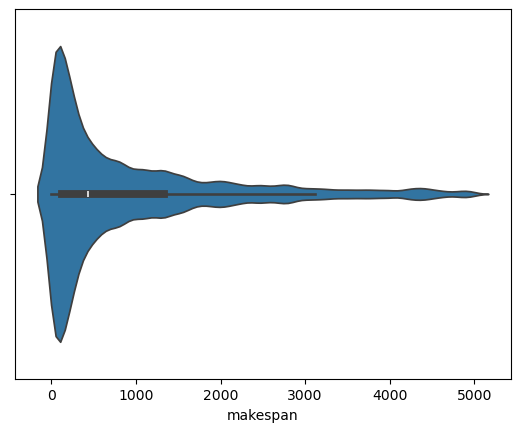

In [24]:
sns.violinplot(data=df[(df["makespan"] < 5000)], x="makespan")

<Axes: xlabel='makespan'>

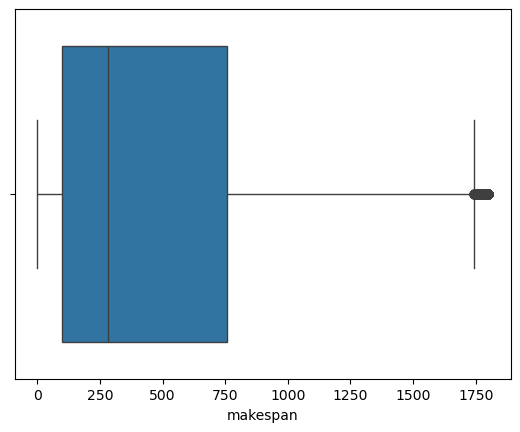

In [25]:
sns.boxplot(data=df[(df["makespan"] < 1800)], x="makespan")

<Axes: xlabel='SLR'>

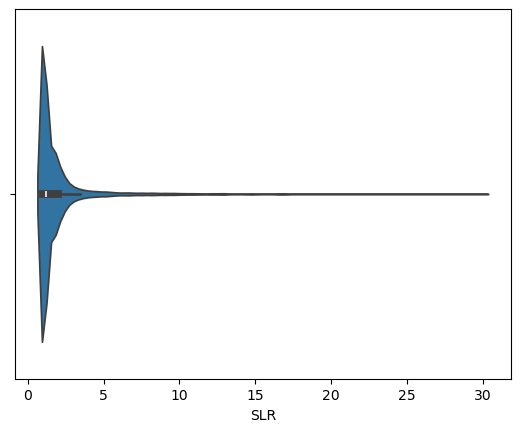

In [26]:
sns.violinplot(data=df[(df["SLR"] < 30)], x="SLR")

<Axes: xlabel='exec_time'>

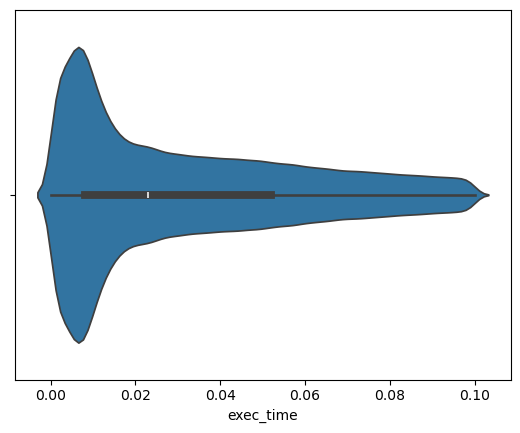

In [27]:
sns.violinplot(data=df[df["exec_time"] < .1], x="exec_time")

<Axes: xlabel='speedup'>

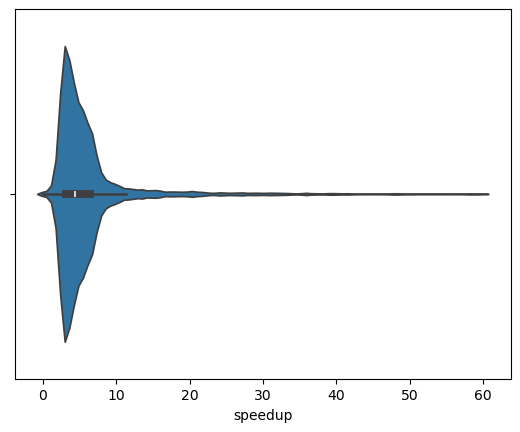

In [28]:
sns.violinplot(data=df[df["speedup"] < 60], x="speedup")

<Axes: xlabel='efficiency_processors'>

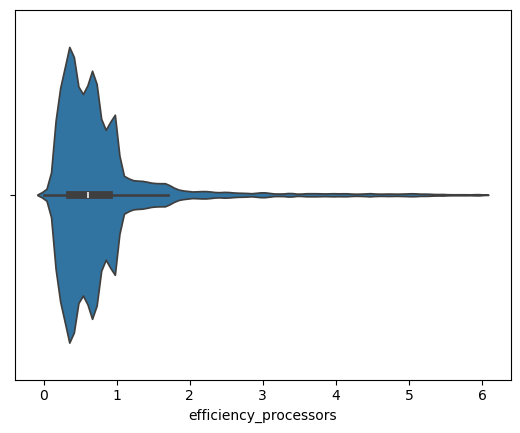

In [29]:
sns.violinplot(data=df[df["efficiency_processors"] < 6], x="efficiency_processors")

<Axes: xlabel='efficiency_cores'>

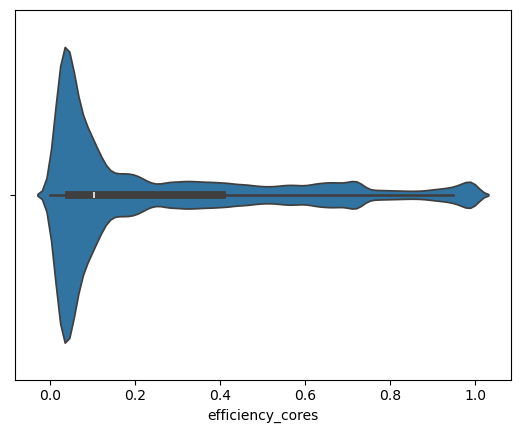

In [30]:
sns.violinplot(data=df, x="efficiency_cores")

<Axes: xlabel='dag_edges'>

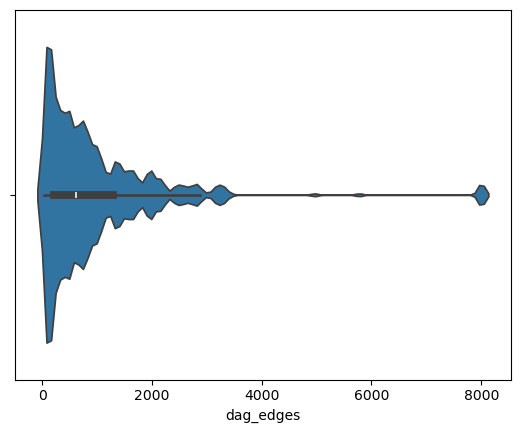

In [31]:
sns.violinplot(data=df, x="dag_edges")

<Axes: xlabel='dag_nodes'>

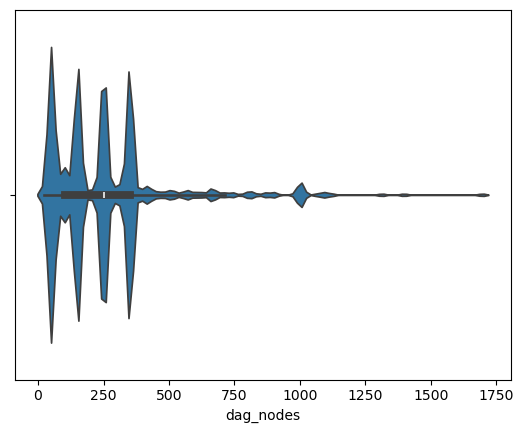

In [32]:
sns.violinplot(data=df, x="dag_nodes")

<Axes: xlabel='dag_density'>

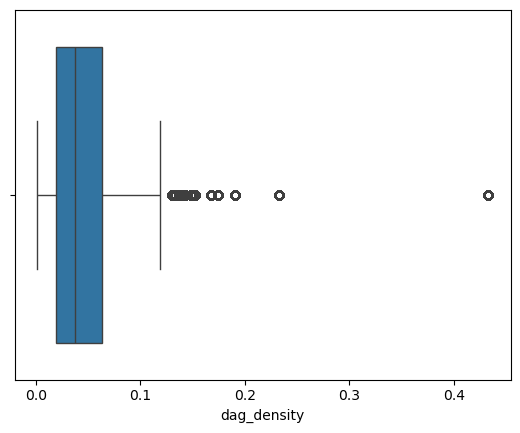

In [33]:
sns.boxplot(data=df, x="dag_density")

<Axes: xlabel='dag_density'>

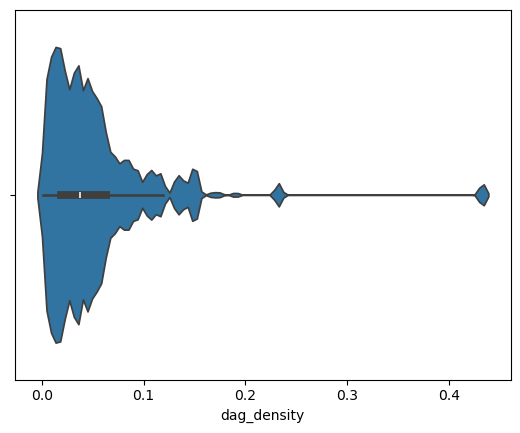

In [34]:
sns.violinplot(data=df, x="dag_density")

<Axes: xlabel='dag_density'>

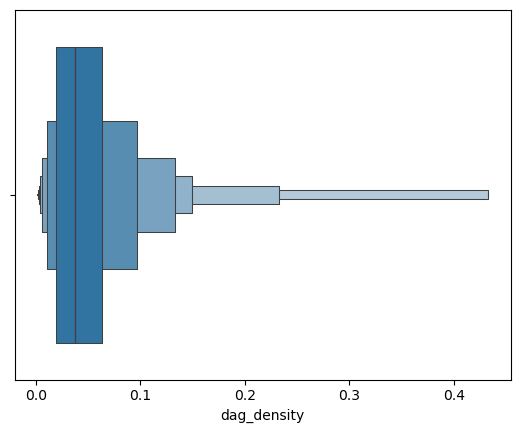

In [35]:
sns.boxenplot(data=df, x="dag_density")

As seen before, the skewness of the data makes it hard to use any normal distribution methods of analysis.

In [36]:
# sns.pairplot(df)

<Axes: xlabel='SLR', ylabel='exec_time'>

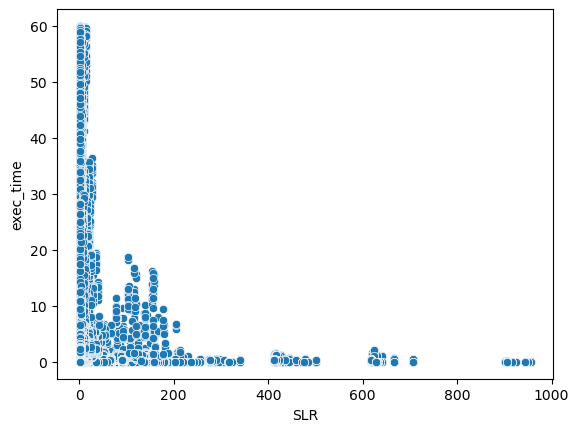

In [37]:
sns.scatterplot(df[(df["SLR"]<1000) & (df["exec_time"] < 60)], x="SLR", y="exec_time")

Below we see that there is not a strong relationship between number of tasks and the SLR, same with number of edges and SLR. This might indicate that some workflow might have less tasks but each task might require more FLOPs to complete than workflows with many tasks.

<Axes: xlabel='dag_nodes', ylabel='SLR'>

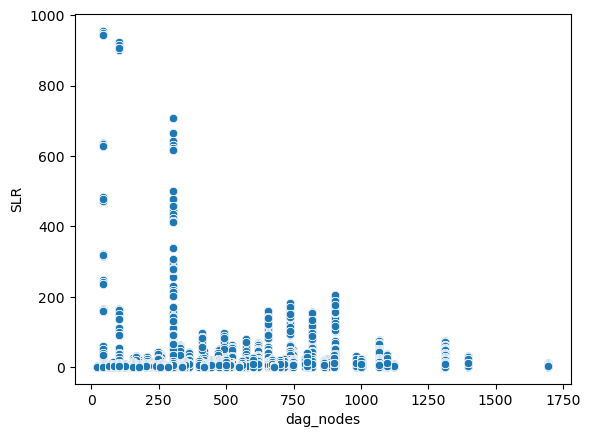

In [38]:
sns.scatterplot(df[(df["SLR"]<1000)], x="dag_nodes", y="SLR")

<Axes: xlabel='dag_edges', ylabel='SLR'>

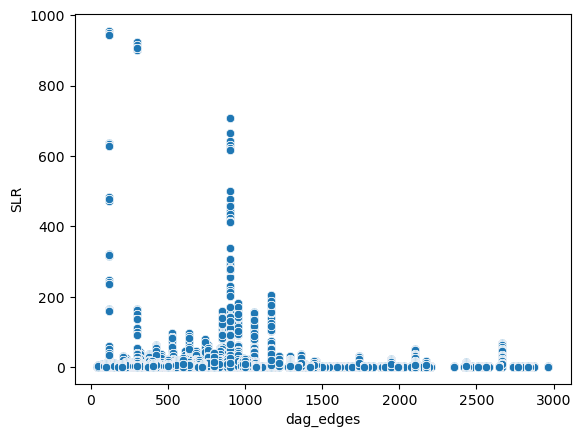

In [39]:
sns.scatterplot(df[(df["SLR"]<1000) & (df["dag_edges"] < 3000)], x="dag_edges", y="SLR")

<Axes: xlabel='SLR'>

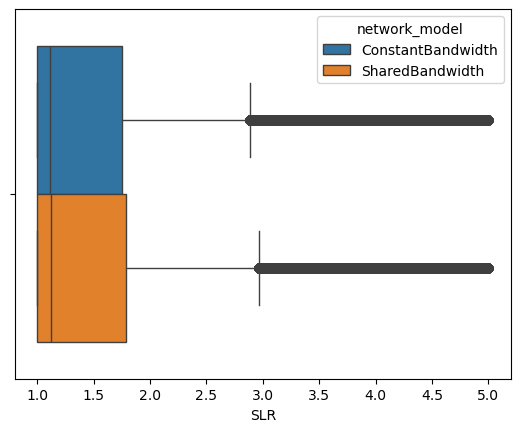

In [40]:
sns.boxplot(data=df[df["SLR"]< 5], x="SLR", hue="network_model")

<Axes: xlabel='makespan'>

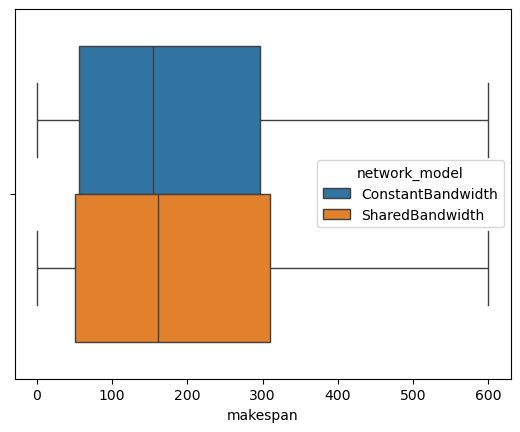

In [41]:
sns.boxplot(data=df[df["makespan"] < 600], x="makespan", hue="network_model")

<Axes: xlabel='SLR'>

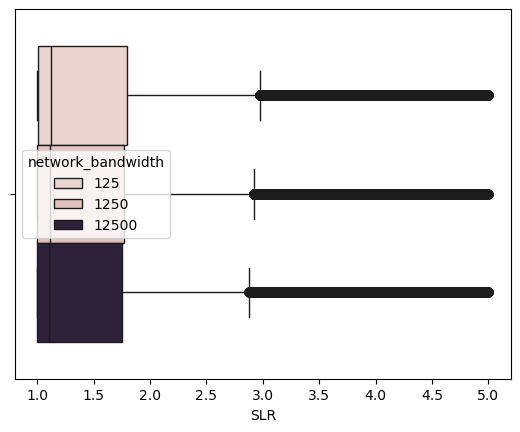

In [42]:
sns.boxplot(data=df[df["SLR"]< 5], x="SLR", hue="network_bandwidth")

<Axes: xlabel='makespan'>

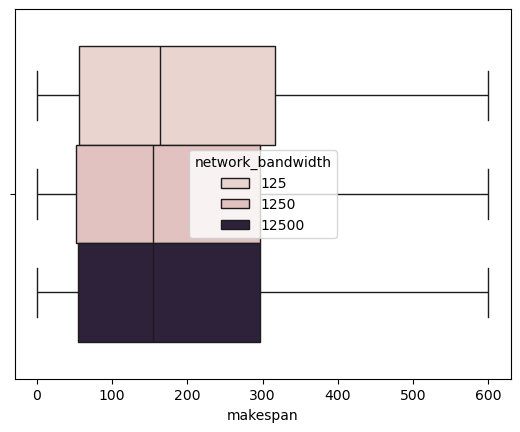

In [43]:
sns.boxplot(data=df[df["makespan"] < 600], x="makespan", hue="network_bandwidth")

<Axes: xlabel='SLR'>

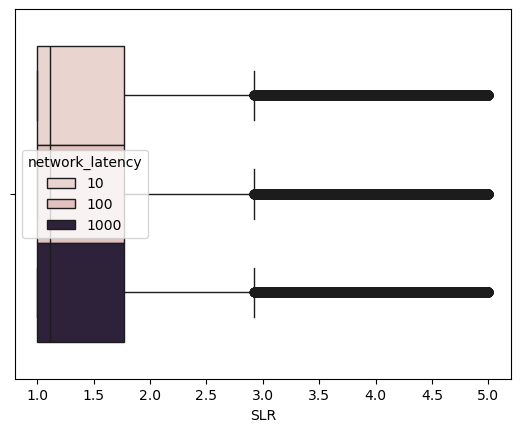

In [44]:
sns.boxplot(data=df[df["SLR"]< 5], x="SLR", hue="network_latency")

<Axes: xlabel='makespan'>

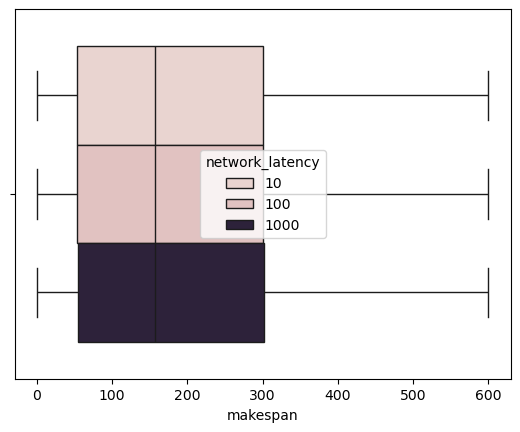

In [45]:
sns.boxplot(data=df[df["makespan"] < 600], x="makespan", hue="network_latency")

Important to note that depending on the workflow and the number of tasks in the DAG, the algorithms will represent varying behaviors that will be hard to plot smoothly.

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'random'),
  Text(1, 0, '1000genome'),
  Text(2, 0, 'blast'),
  Text(3, 0, 'bwa'),
  Text(4, 0, 'cycles'),
  Text(5, 0, 'epigenomics'),
  Text(6, 0, 'montage'),
  Text(7, 0, 'seismology'),
  Text(8, 0, 'soykb'),
  Text(9, 0, 'srasearch')])

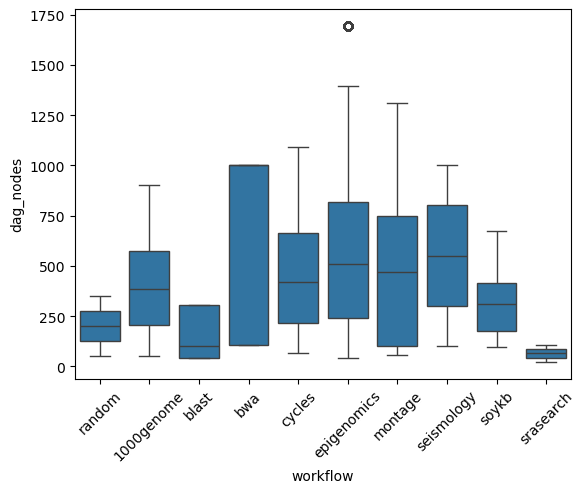

In [46]:
sns.boxplot(df, x="workflow", y="dag_nodes")
plt.xticks(rotation=45)

In [47]:
# df.columns

# Plotting efficiency per algorithm

The below efficiency figures suggest that the `DYTAS` variants that skip active processors have terrible efficiency compared to the rest.

Out of the `DYTAS` variants, the one with the best efficiency consistently is the one using `navigation=All, sorting=DFS, multicore=UseAllCores` followed by the one using `sorting=Khan`. Nonetheless, none of them reaches even the worst performing scheduler -in terms of efficiency- from the control group (`DynamicList`).

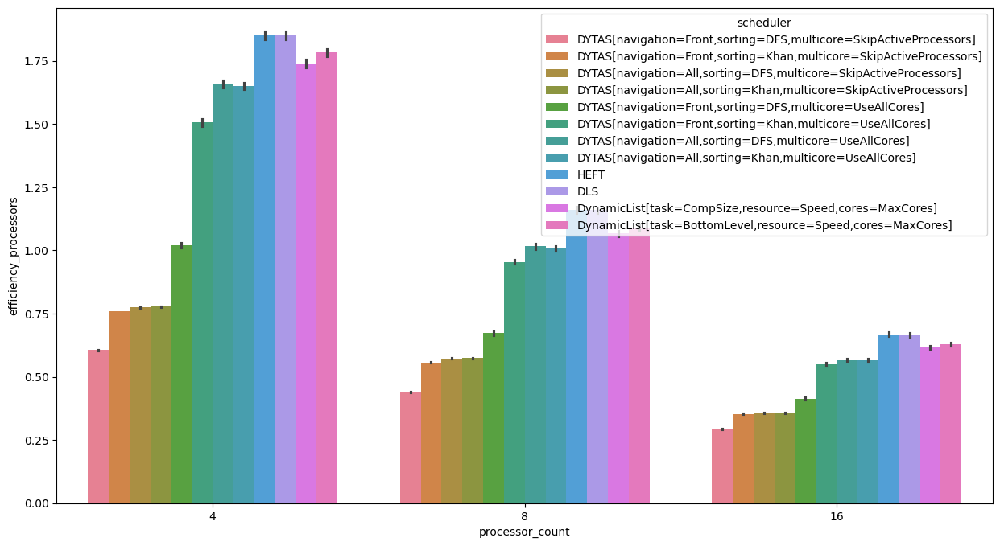

In [48]:


plt.figure(figsize=(15,8))
sns.barplot(data=df, x="processor_count", y="efficiency_processors", hue="scheduler")

plt.show()

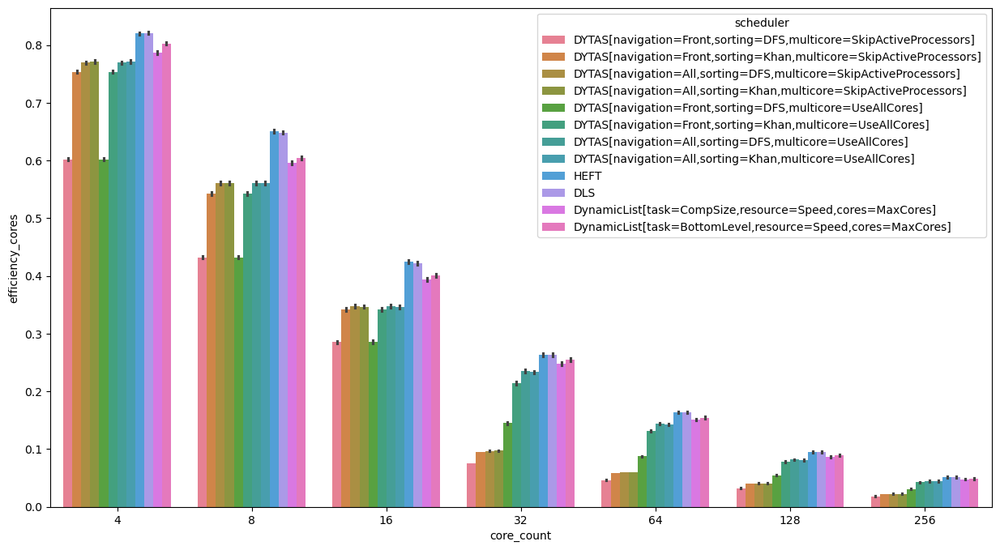

In [49]:
plt.figure(figsize=(15,8))

sns.barplot(data=df, x="core_count", y="efficiency_cores", hue="scheduler")

plt.show()

# Running time vs Processor count

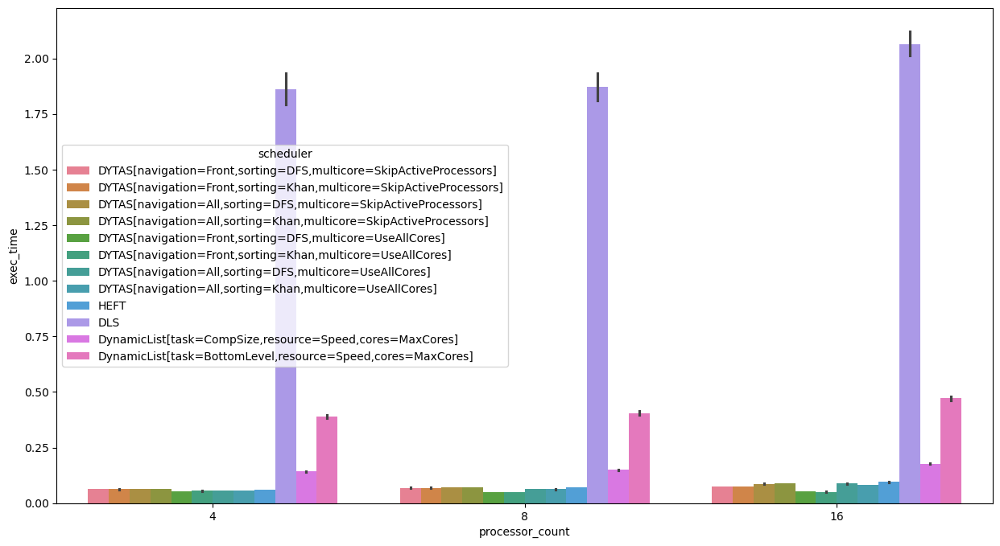

In [50]:
plt.figure(figsize=(15,8))

sns.barplot(data=df, x="processor_count", y="exec_time", hue="scheduler")

plt.show()

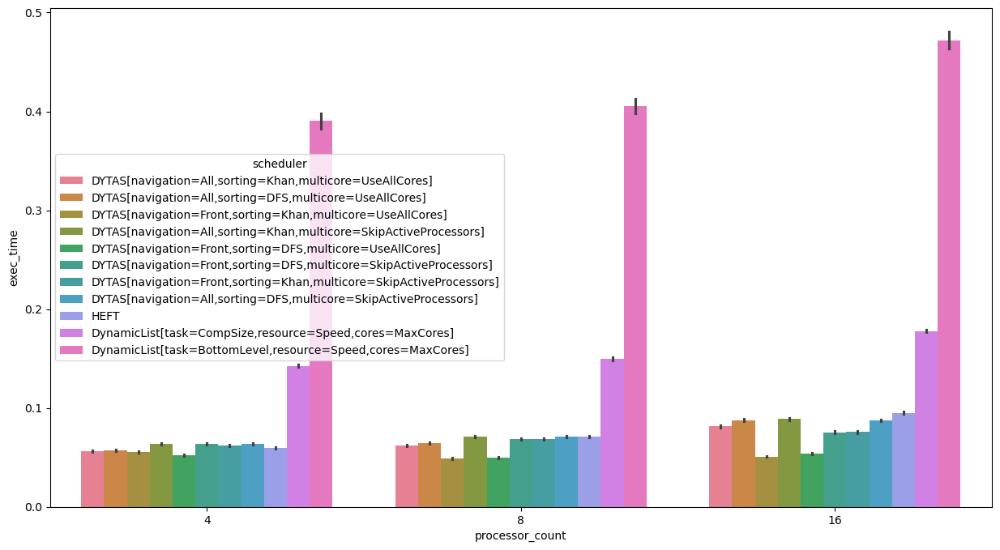

In [51]:
plt.figure(figsize=(15,8))

sns.barplot(
    data=df[df.scheduler != "DLS"].sort_values(
        by="exec_time"
    ),
    x="processor_count", y="exec_time", hue="scheduler"
)

plt.show()

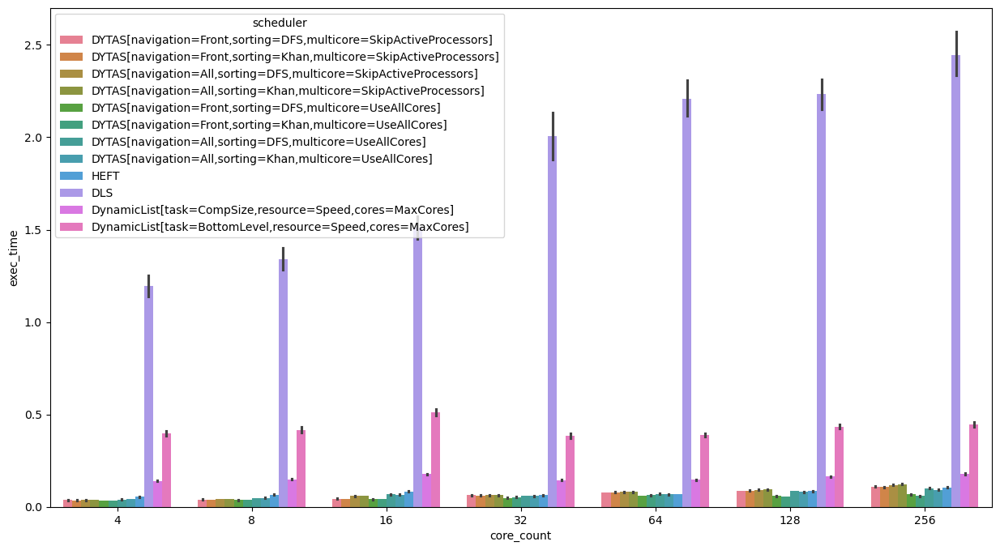

In [52]:
plt.figure(figsize=(15,8))

sns.barplot(data=df, x="core_count", y="exec_time", hue="scheduler")

plt.show()

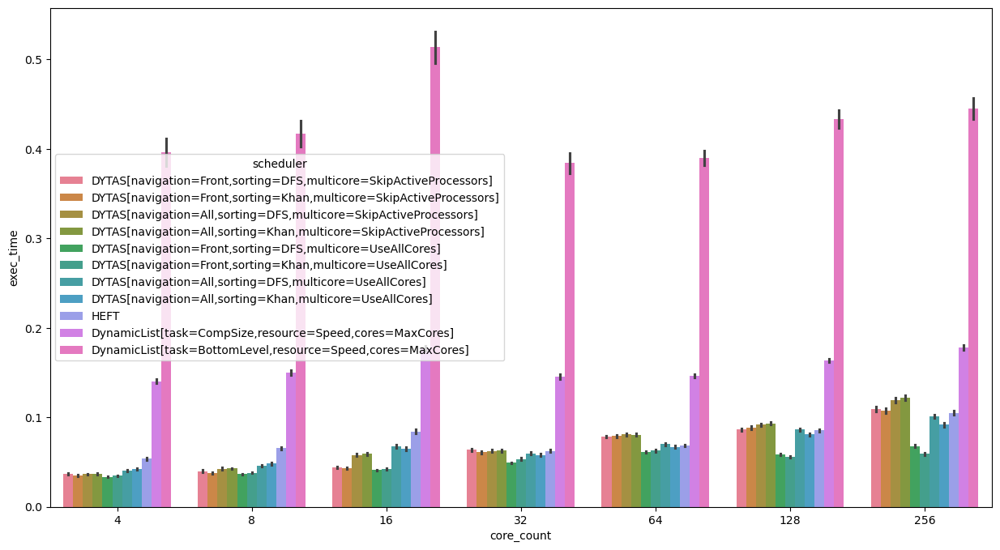

In [53]:
# Ignoring DLS
plt.figure(figsize=(15,8))

sns.barplot(data=df[df.scheduler != "DLS"], x="core_count", y="exec_time", hue="scheduler")

plt.show()

# SLR vs processor count

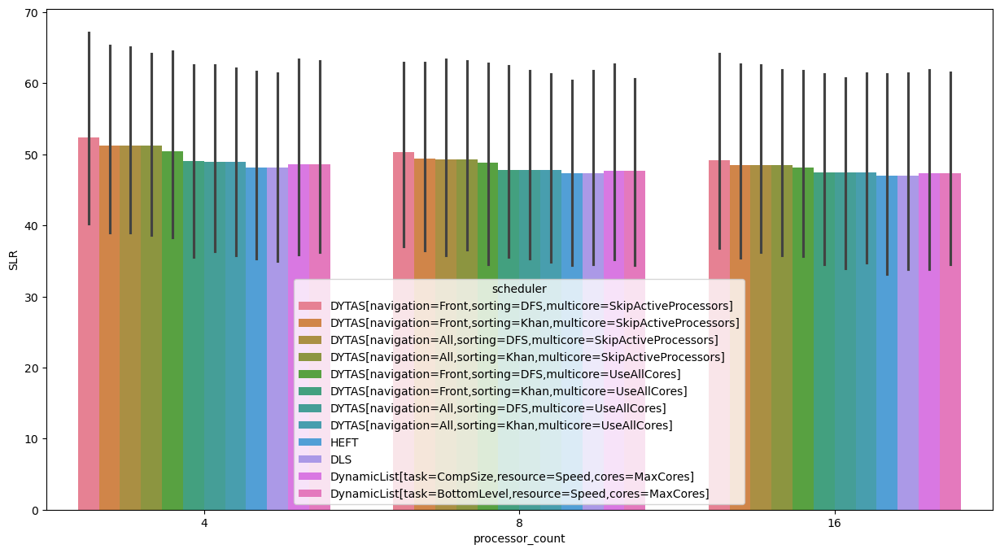

In [54]:
plt.figure(figsize=(15,8))

sns.barplot(data=df, x="processor_count", y="SLR", hue="scheduler")

plt.show()

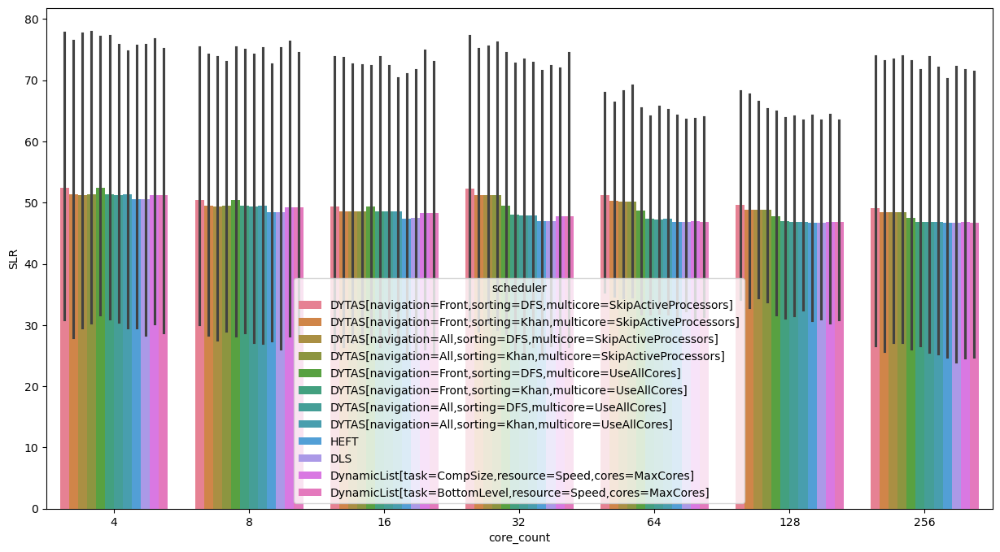

In [55]:
plt.figure(figsize=(15,8))

sns.barplot(data=df, x="core_count", y="SLR", hue="scheduler")

plt.show()

# Plotting mean SLR vs DAG node count

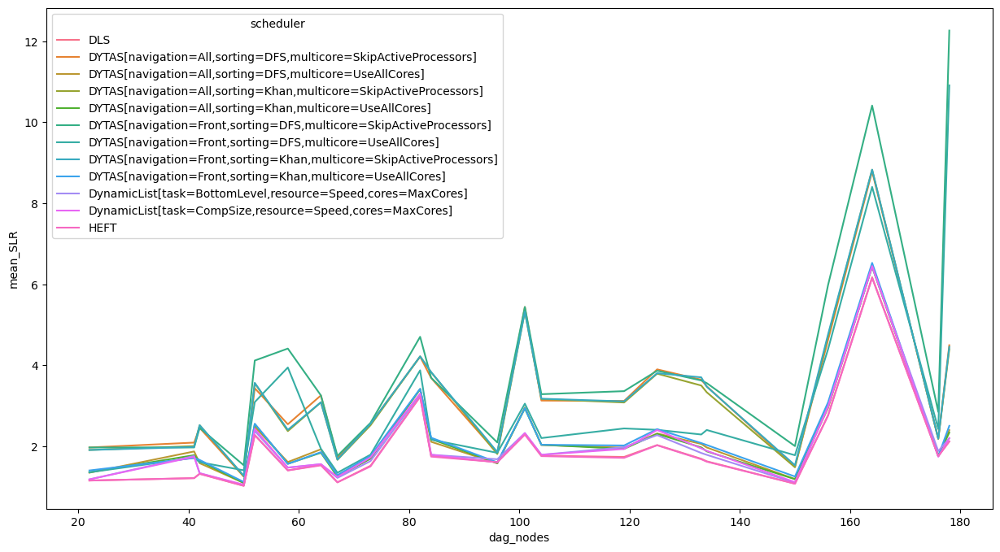

In [56]:
df_mean_slr = df[
    ["SLR", "scheduler", "dag_nodes"]
].groupby(["scheduler", "dag_nodes"]).mean().reset_index()
df_mean_slr = df_mean_slr.rename(columns={"SLR":"mean_SLR"})

plt.figure(figsize=(15,8))

sns.lineplot(
    data=df_mean_slr[
    (df_mean_slr["mean_SLR"]<20) & (df_mean_slr.dag_nodes < 200)],
    y="mean_SLR", x="dag_nodes", hue="scheduler"
)

plt.show()

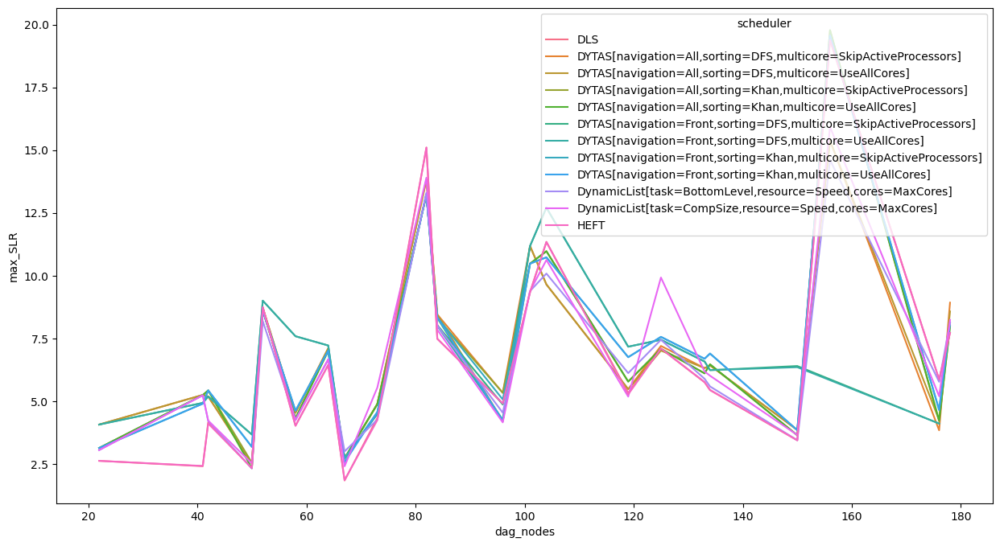

In [57]:
df_max_slr = df[
    ["SLR", "scheduler", "dag_nodes"]
].groupby(["scheduler", "dag_nodes"]).max().reset_index()
df_max_slr = df_max_slr.rename(columns={"SLR":"max_SLR"})

plt.figure(figsize=(15,8))

sns.lineplot(
    data=df_max_slr[
    (df_max_slr["max_SLR"]<20) & (df_max_slr.dag_nodes < 200)],
    y="max_SLR", x="dag_nodes", hue="scheduler"
)

plt.show()

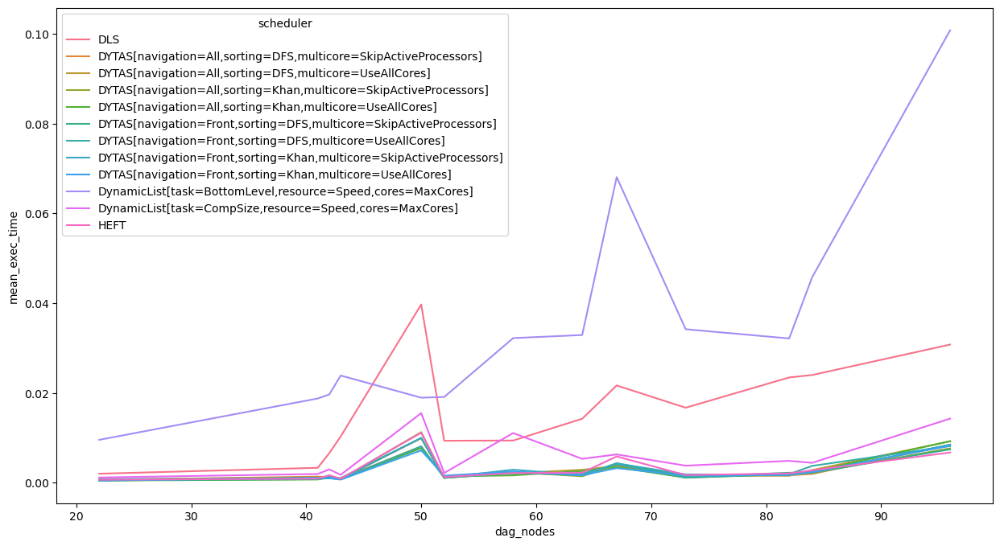

In [58]:
df_mean_exec_time = df[
    ["exec_time", "scheduler", "dag_nodes"]
].groupby(["scheduler", "dag_nodes"]).mean().reset_index()
df_mean_exec_time = df_mean_exec_time.rename(columns={"exec_time":"mean_exec_time"})

plt.figure(figsize=(15,8))

sns.lineplot(data=df_mean_exec_time[df_mean_exec_time.dag_nodes < 100], y="mean_exec_time", x="dag_nodes", hue="scheduler")

plt.show()

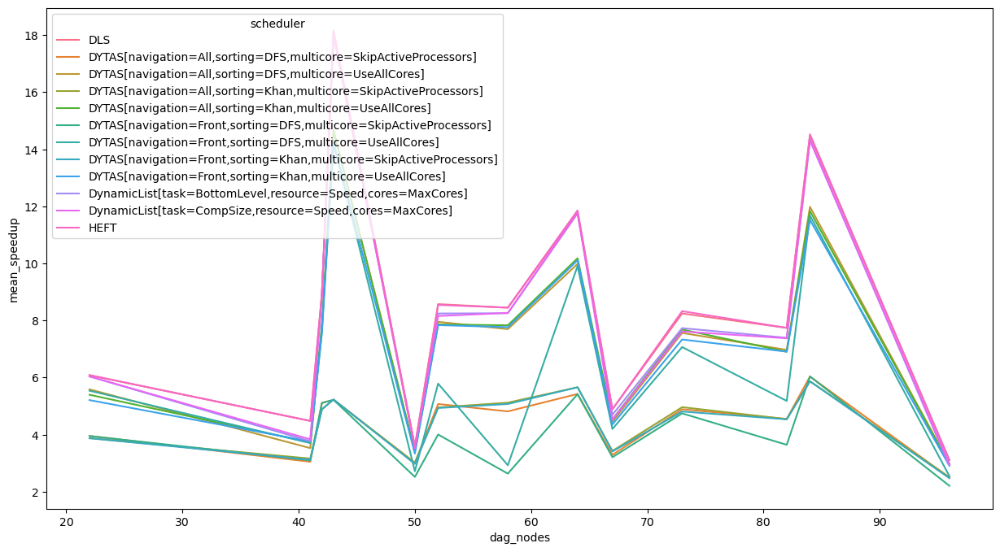

In [59]:
df_mean_speedup = df[
    ["speedup", "scheduler", "dag_nodes"]
].groupby(["scheduler", "dag_nodes"]).mean().reset_index()
df_mean_speedup = df_mean_speedup.rename(columns={"speedup":"mean_speedup"})

plt.figure(figsize=(15,8))

sns.lineplot(data=df_mean_speedup[df_mean_speedup.dag_nodes < 100], y="mean_speedup", x="dag_nodes", hue="scheduler")

plt.show()

In [60]:
df.workflow.unique()

array(['random', '1000genome', 'blast', 'bwa', 'cycles', 'epigenomics',
       'montage', 'seismology', 'soykb', 'srasearch'], dtype=object)

In [61]:
df_epigenomics = df[df.workflow == "epigenomics"]

In [62]:
def plot_mean_slr(df):
    data=df
    data = data[
    ["SLR", "scheduler", "dag_nodes"]
    ].groupby(["scheduler", "dag_nodes"]).mean().reset_index()
    data = data.rename(columns={"SLR":"mean_SLR"})

    # Smoothing out
    data["mean_SLR_smoothed"] = data["mean_SLR"].rolling(window=5, center=True).mean()
    
    plt.figure(figsize=(15,8))

    plt.title("Mean SLR vs DAG node count")
    
    sns.lineplot(
        data=data,
        y="mean_SLR_smoothed", x="dag_nodes", hue="scheduler",
        marker='o'
    )
    
    plt.show()

We can in more detail see below how it each workflow does not scale smoothly up or down, for these test cases in particular.


random


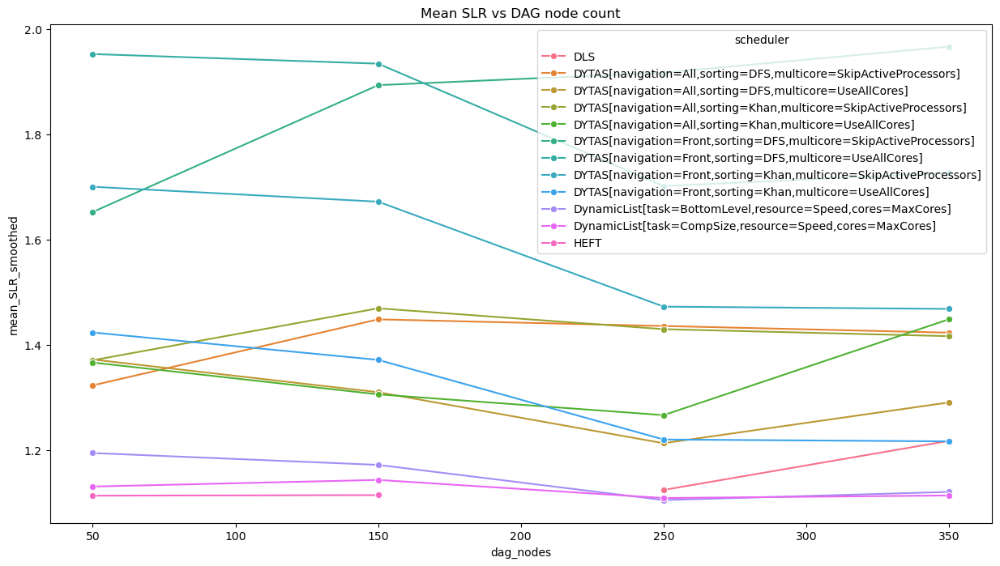

1000genome


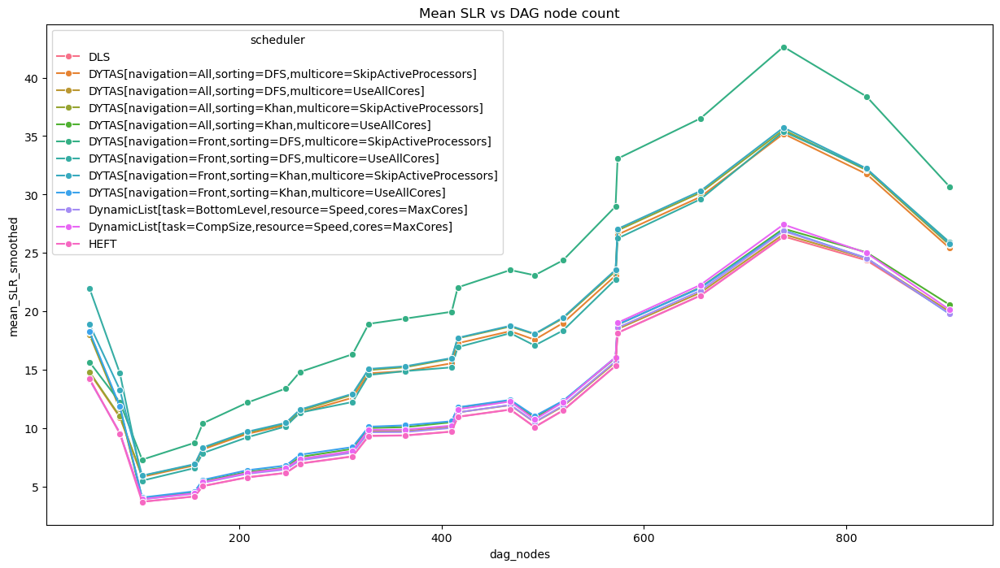

blast


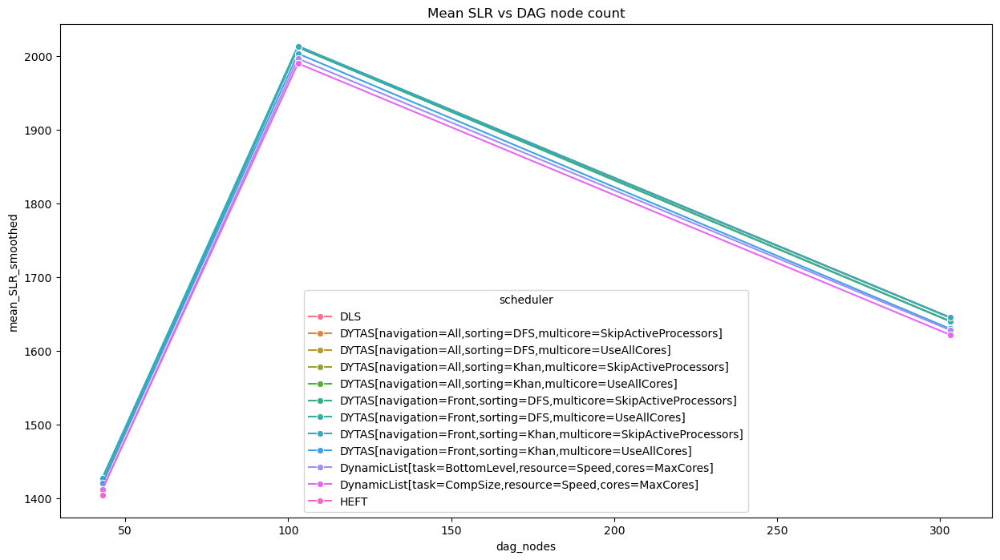

bwa


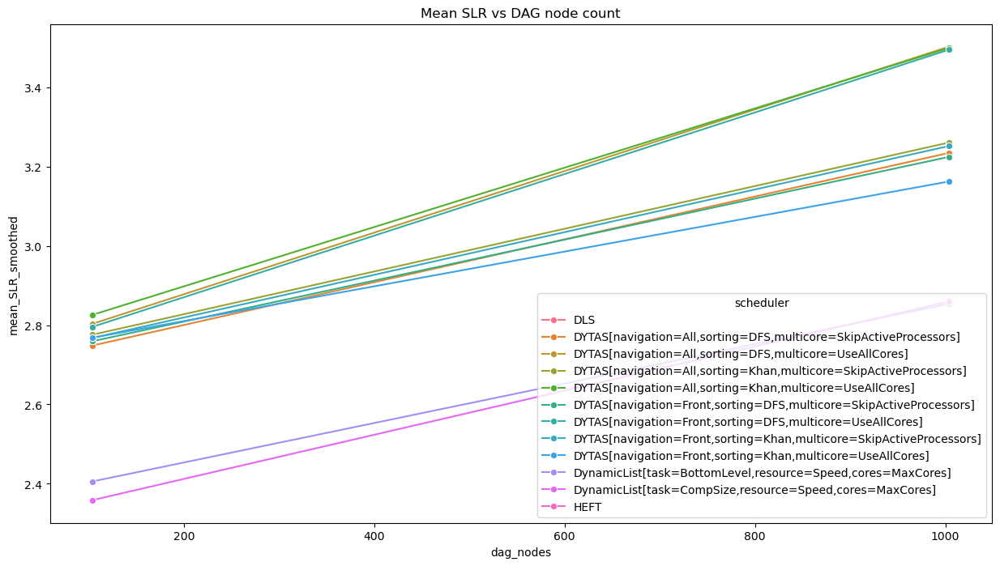

cycles


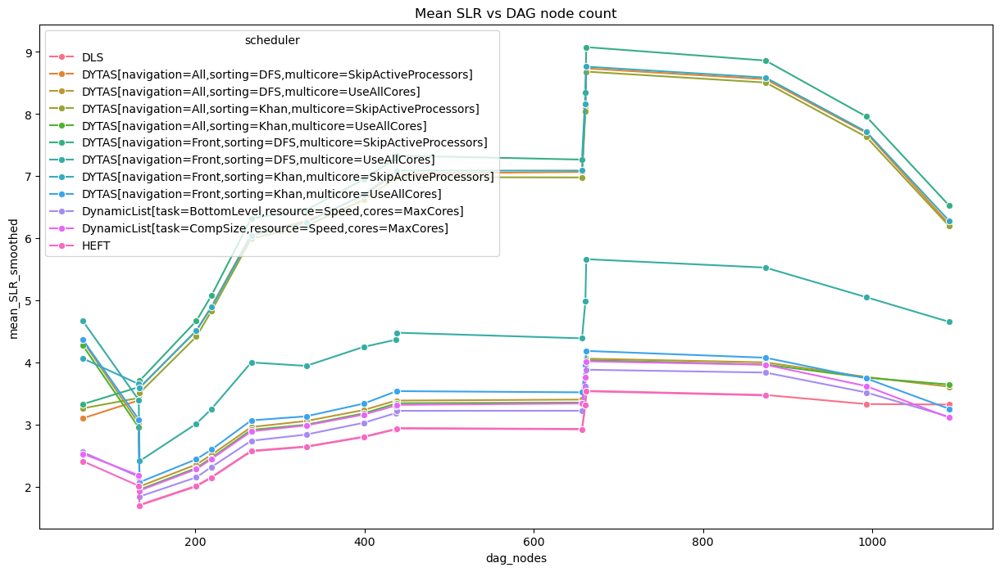

epigenomics


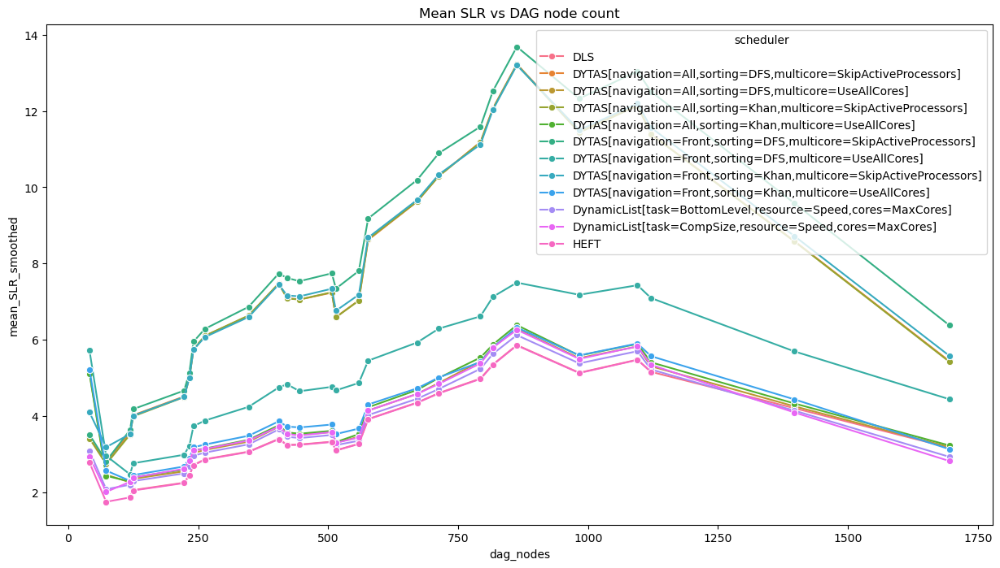

montage


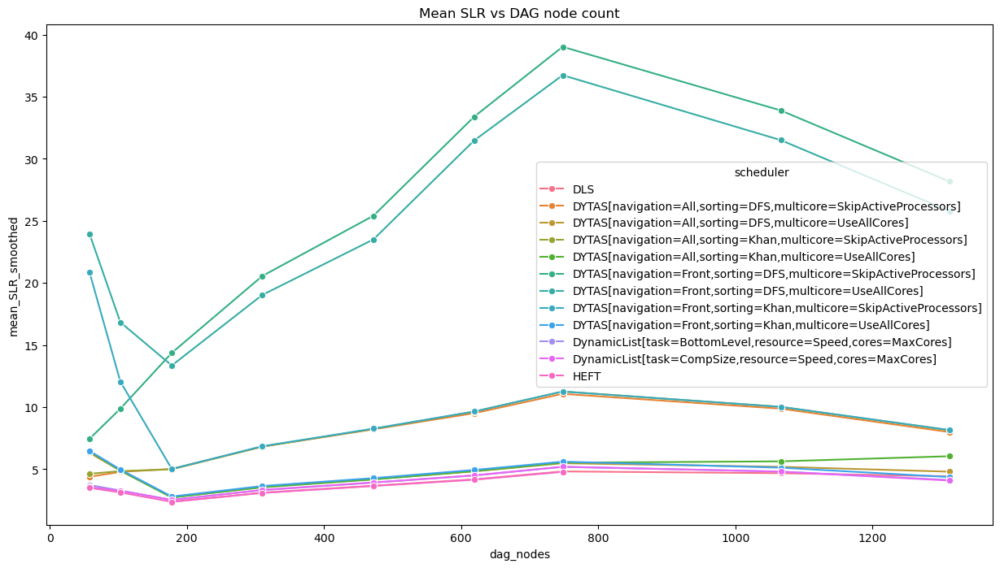

seismology


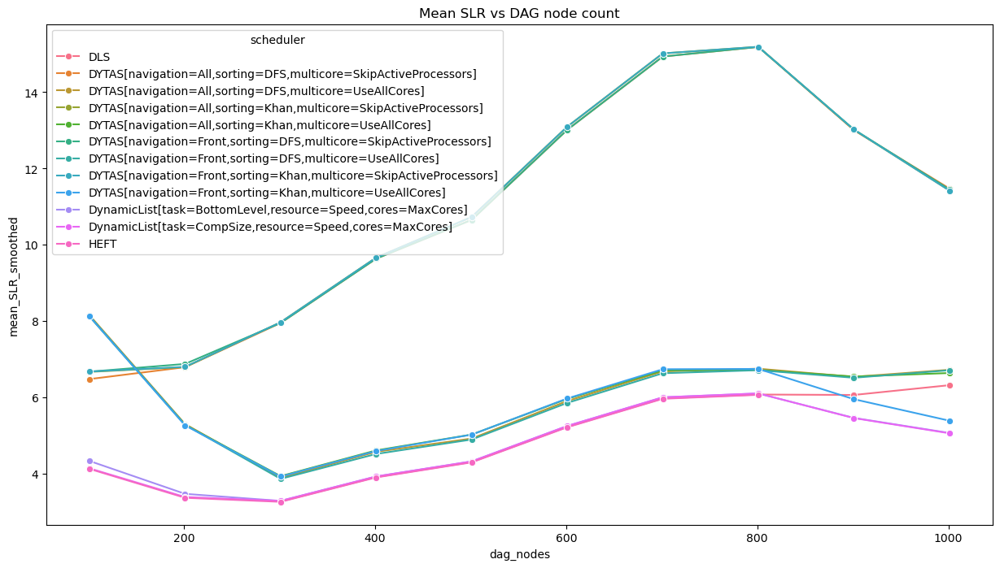

soykb


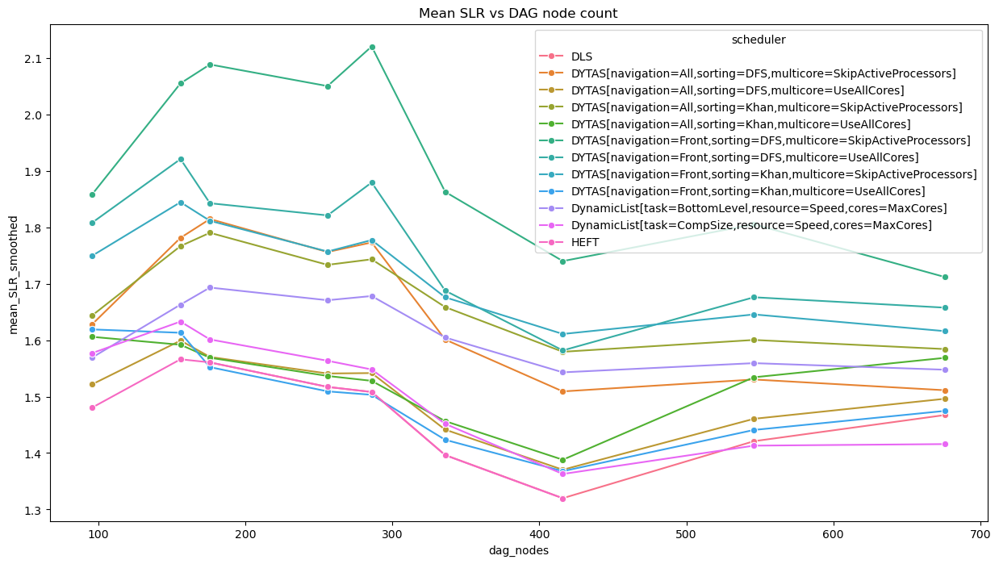

srasearch


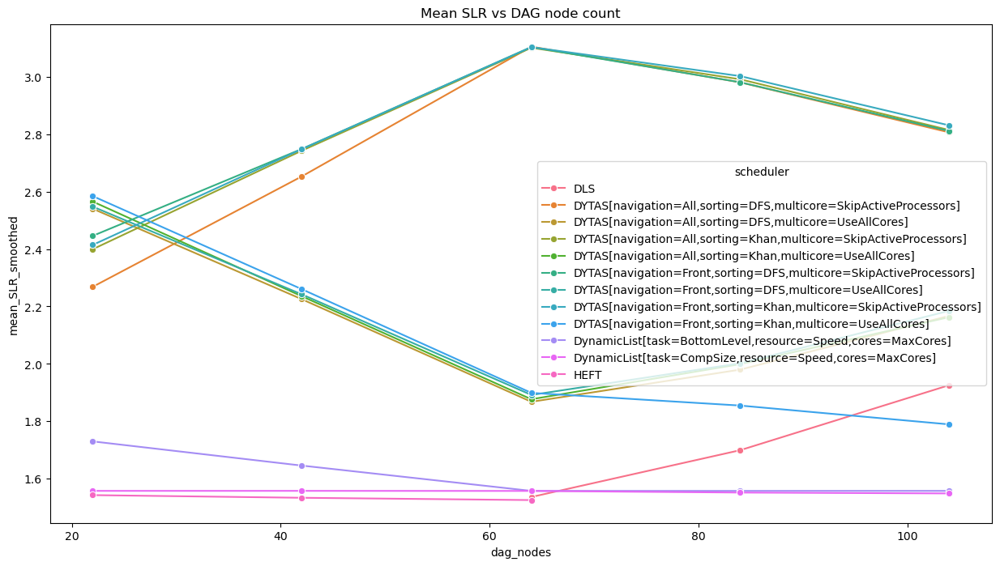

In [63]:
for workflow in df.workflow.unique():
    print(workflow)
    plot_mean_slr(df[df.workflow == workflow])

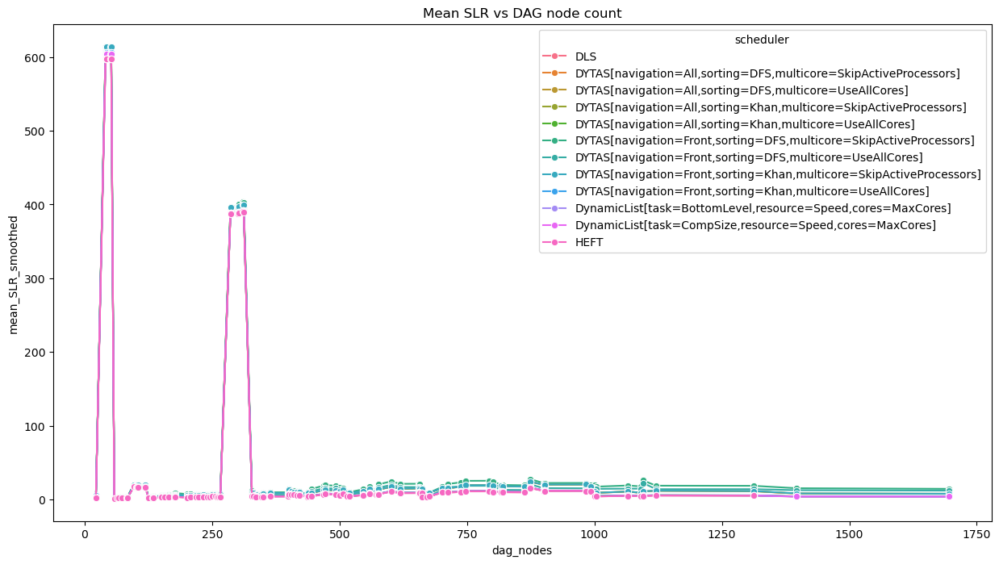

In [64]:
plot_mean_slr(df)

In [65]:
def plot_mean_speedup(df):
    data=df
    data = data[
    ["speedup", "scheduler", "dag_nodes"]
    ].groupby(["scheduler", "dag_nodes"]).mean().reset_index()
    data = data.rename(columns={"speedup":"mean_speedup"})

    # Smoothing out
    # data["mean_SLR_smoothed"] = data["mean_SLR"].rolling(window=5, center=True).mean()
    
    plt.figure(figsize=(15,8))

    plt.title("Mean speedup vs DAG node count")
    
    sns.lineplot(
        data=data,
        y="mean_speedup", x="dag_nodes", hue="scheduler",
        marker='o'
    )
    
    plt.show()

random


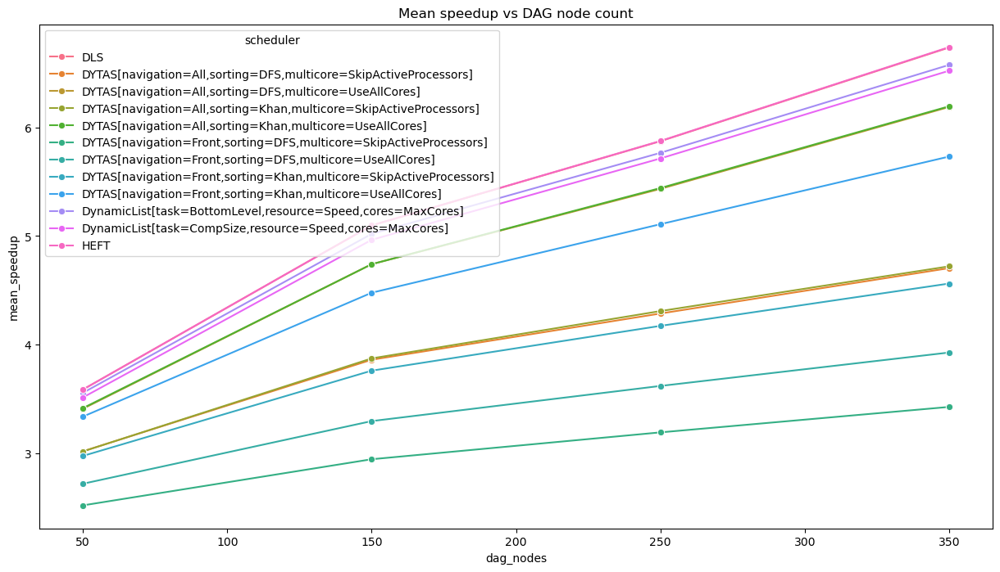

1000genome


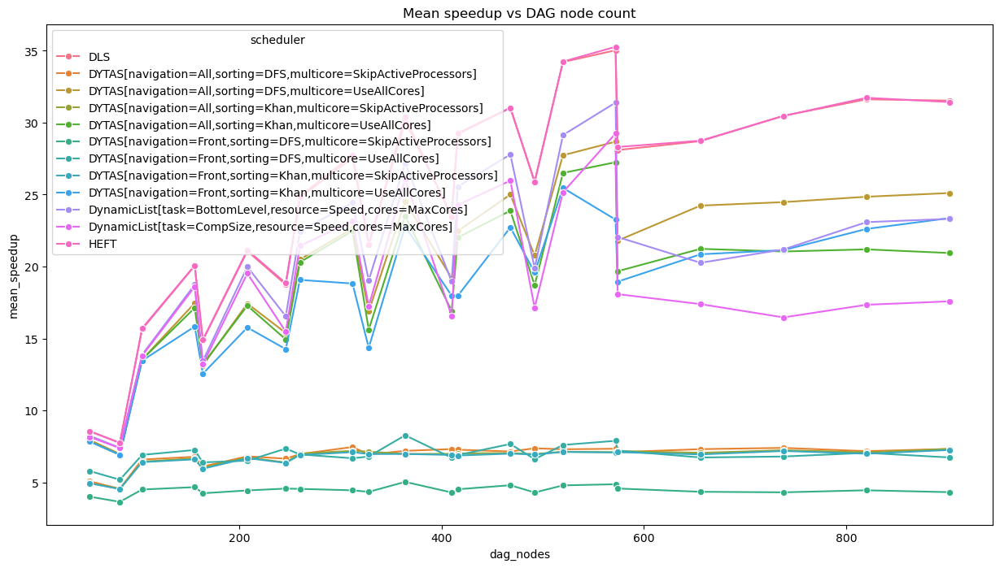

blast


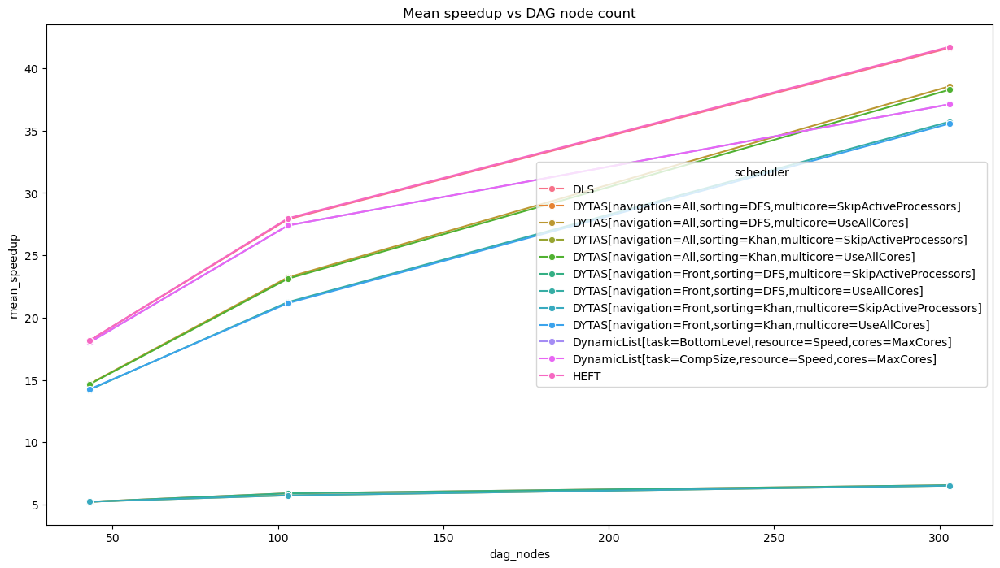

bwa


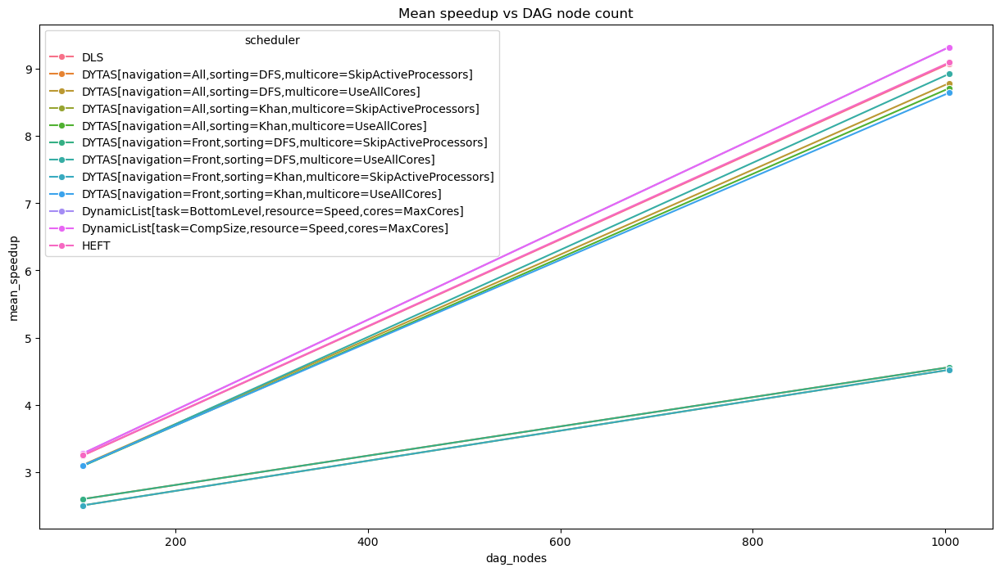

cycles


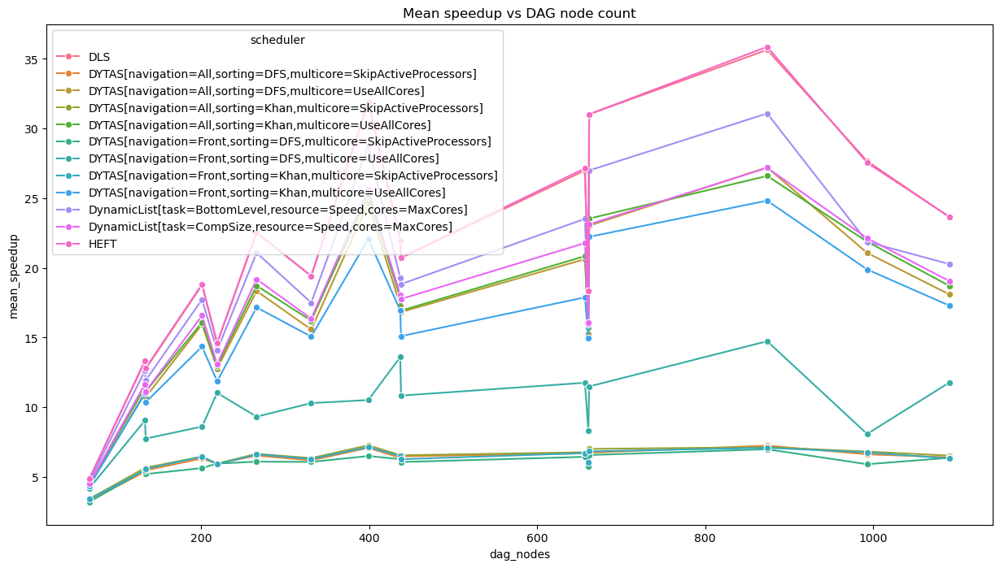

epigenomics


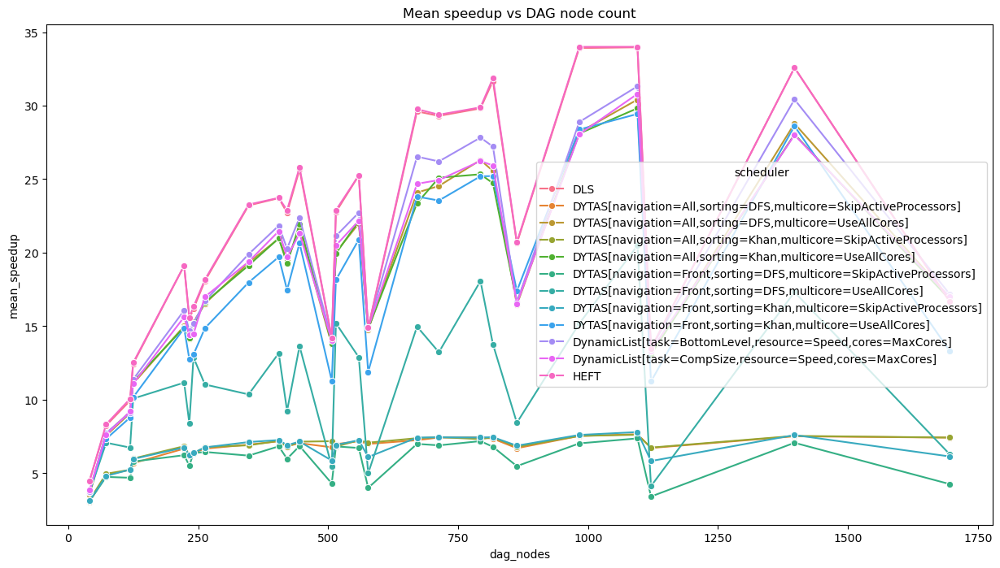

montage


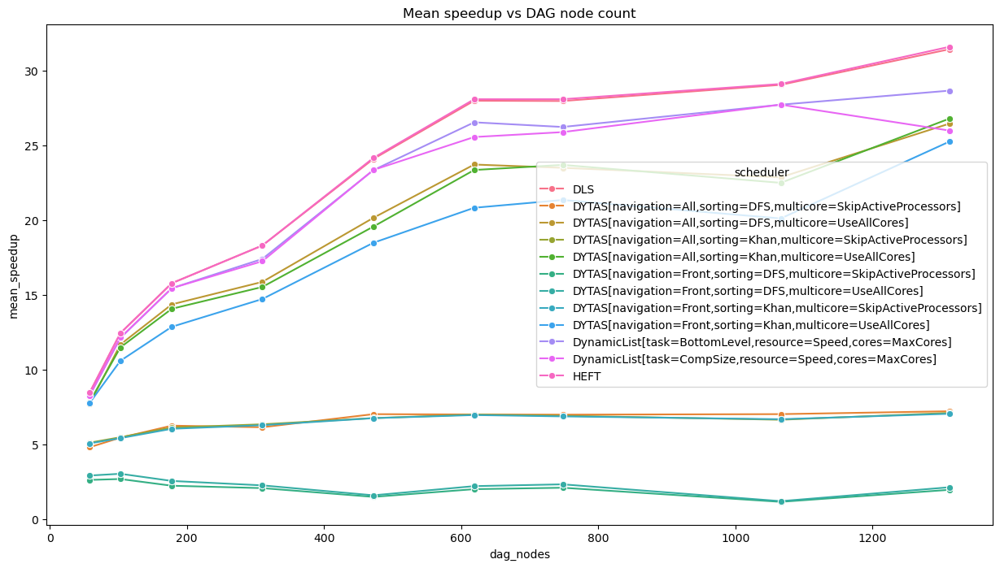

seismology


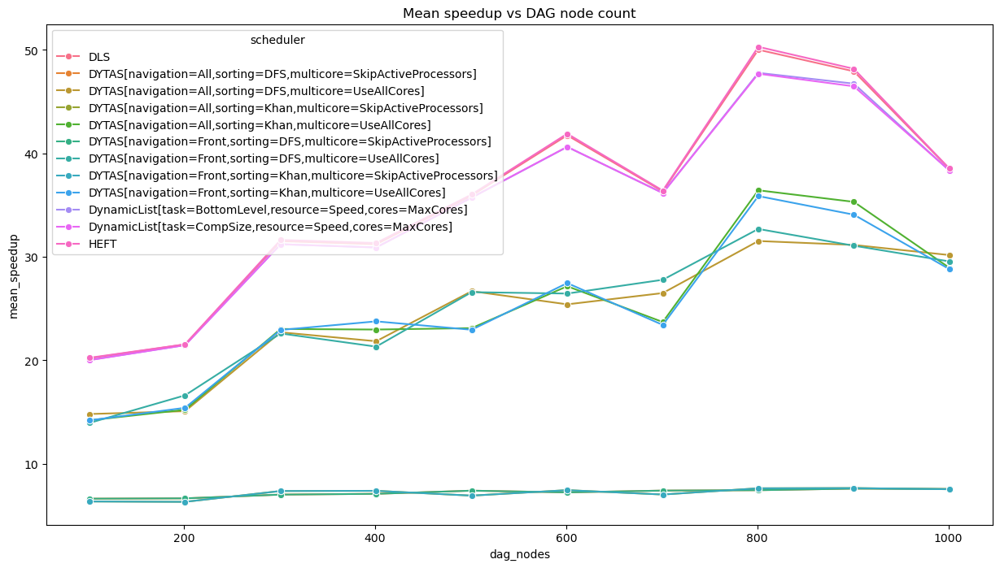

soykb


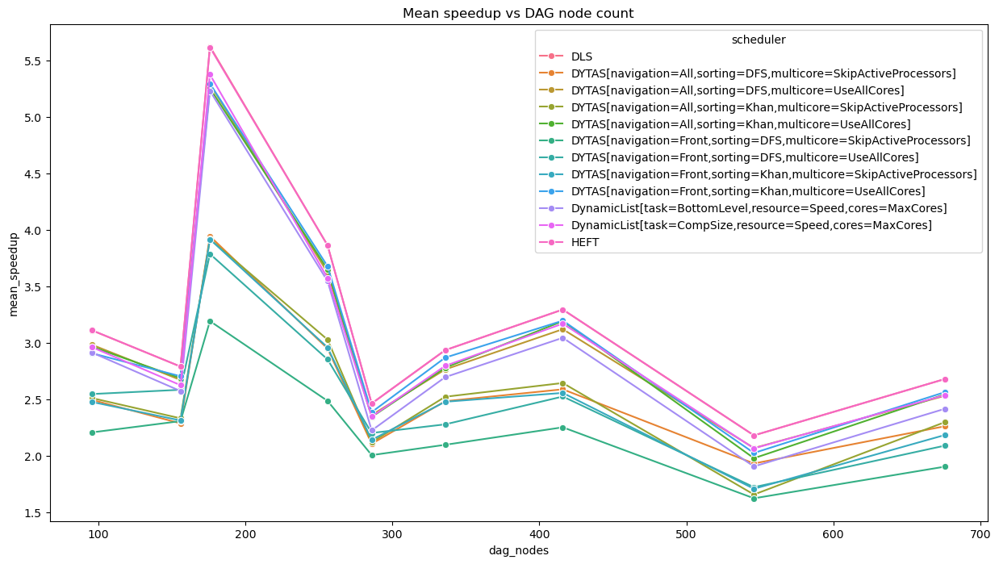

srasearch


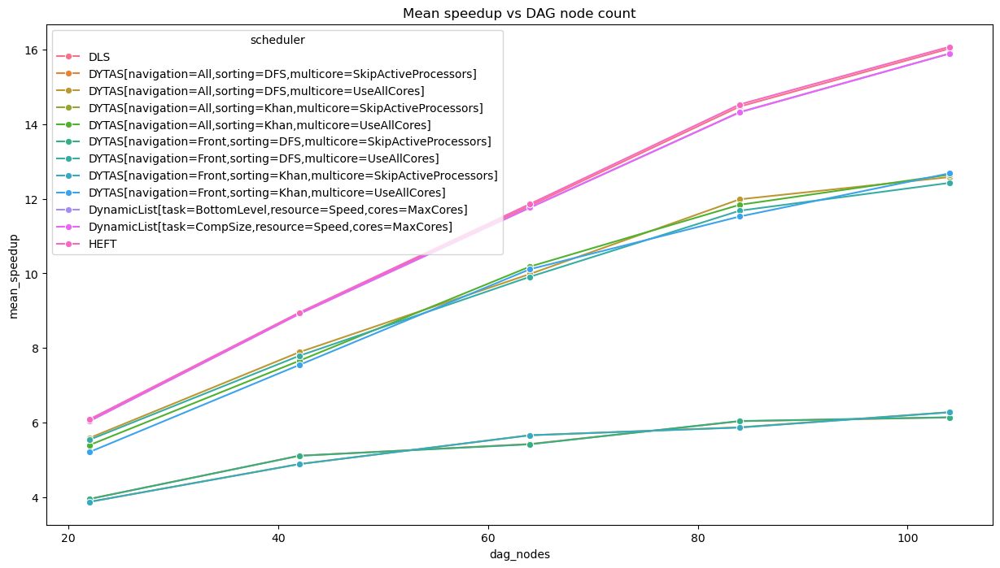

In [66]:
for workflow in df.workflow.unique():
    print(workflow)
    plot_mean_speedup(df[df.workflow == workflow])

In [67]:
df.columns

Index(['dag', 'system', 'scheduler', 'makespan', 'exec_time',
       'run_stats.total_task_time', 'run_stats.total_network_traffic',
       'run_stats.total_network_time', 'run_stats.max_used_cores',
       'run_stats.max_cpu_utilization', 'run_stats.cpu_utilization',
       'run_stats.memory_utilization', 'run_stats.used_resource_count',
       'run_stats.cpu_utilization_used', 'run_stats.cpu_utilization_active',
       'dag_nodes', 'dag_edges', 'dag_density', 'dag_total_comp_size',
       'dag_total_transfers_size', 'dag_depth', 'dag_width',
       'dag_parallelism_degree', 'dag_critical_path_size', 'CCR', 'speedup',
       'processor_count', 'core_count', 'efficiency_processors',
       'efficiency_cores', 'network_bandwidth', 'network_latency',
       'network_model', 'min_processor_speed', 'max_processor_speed', 'SLR',
       'workflow', 'test_id', 'system_type'],
      dtype='object')

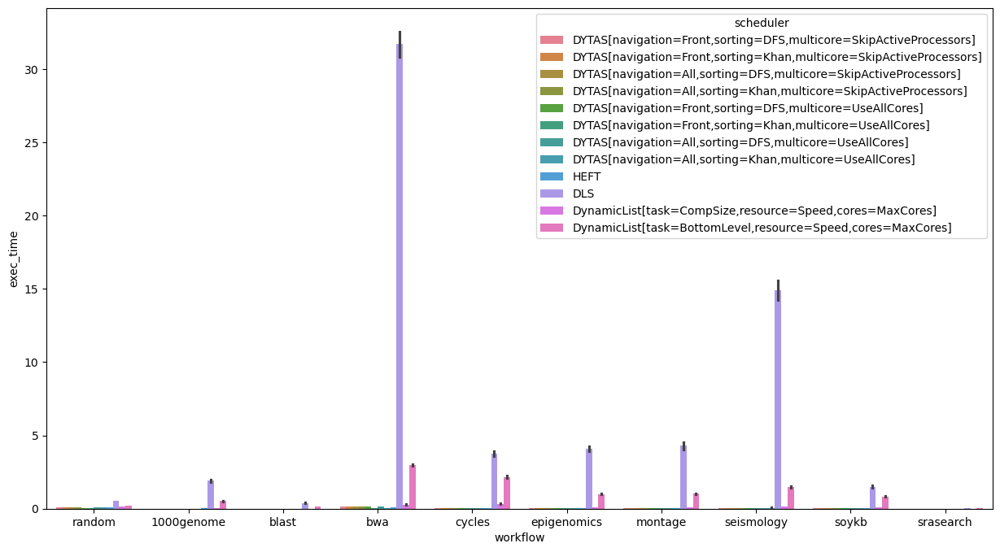

In [68]:
plt.figure(figsize=(15,8))

sns.barplot(data=df, x="workflow", y="exec_time", hue="scheduler")

plt.show()

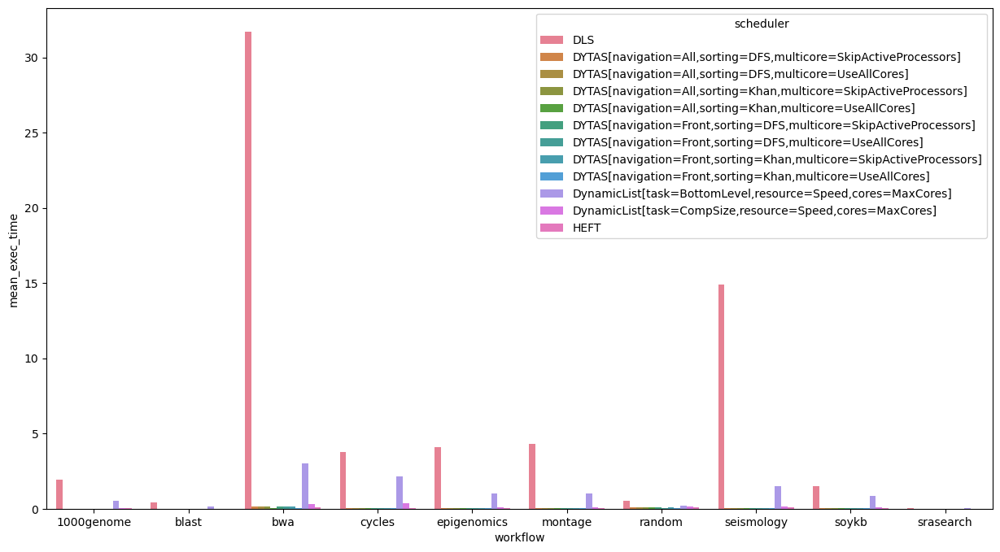

In [69]:
df_mean_workflow_exec_time = df[
    ["exec_time", "scheduler", "workflow"]
].groupby(["scheduler", "workflow"]).mean().reset_index()
df_mean_workflow_exec_time = df_mean_workflow_exec_time.rename(columns={"exec_time":"mean_exec_time"})

plt.figure(figsize=(15,8))

sns.barplot(data=df_mean_workflow_exec_time, x="workflow", y="mean_exec_time", hue="scheduler")

plt.show()

Given `DLS` is such an outlier in the above graph, and below it is easier to see all  other results with the clear assumption that `DLS` has the worst running time, followed by a large amount by `DynamicList`.

It's important to now that the below graph will depend heavily on 

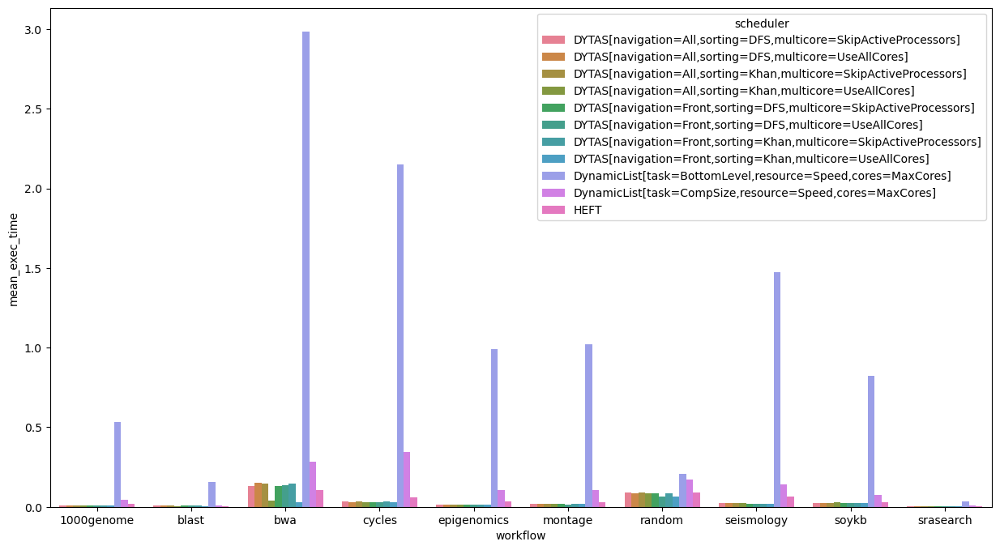

In [70]:
df_mean_workflow_exec_time = df[
    ["exec_time", "scheduler", "workflow"]
].groupby(["scheduler", "workflow"]).mean().reset_index()
df_mean_workflow_exec_time = df_mean_workflow_exec_time.rename(columns={"exec_time":"mean_exec_time"})

plt.figure(figsize=(15,8))

sns.barplot(data=df_mean_workflow_exec_time[df_mean_workflow_exec_time.scheduler != "DLS"], x="workflow", y="mean_exec_time", hue="scheduler")

plt.show()

# Calculating the Communication-to-Computation Ratio (CCR)

$$
\text{CCR} = \frac{\sum_{e \in E} c(e)}{\sum_{v \in V} w(v)}
$$

Where the numerator is the total data transfer time and the denominator is the total task computation time, for the workflow or DAG.

In [71]:
# df.columns

In [72]:
# df["run_stats.total_network_time"]

In [73]:
# df["run_stats.total_task_time"]

In [74]:
# df["CCR"] = df["run_stats.total_network_time"] / df["run_stats.total_task_time"]

<Axes: ylabel='CCR'>

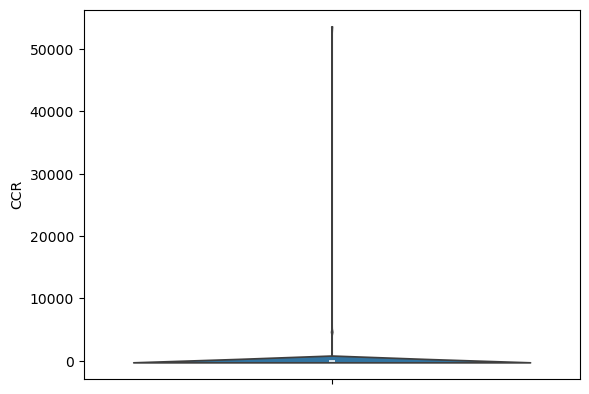

In [118]:
sns.violinplot(df["CCR"])

<Axes: ylabel='CCR'>

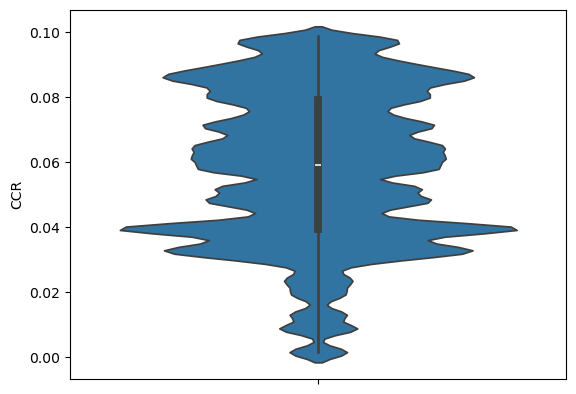

In [75]:
sns.violinplot(df[df.CCR < 0.1]["CCR"])

In [76]:
df.CCR.max()

53405.730259626784

In [77]:
df.CCR.min()

0.0015384689935109518

In [78]:
df.CCR.median()

0.12471500615133266

In [79]:
def plot_avg_slr_vs_ccr(df, n_bins):
    
    # Automatically calculate bins based on min/max CCR
    min_val = df['CCR'].min()
    max_val = df['CCR'].max()
    bins = np.linspace(min_val, max_val, n_bins + 1)
    
    # Create readable labels for the bins
    labels = [f'{(bins[i] + bins[i+1])/2:.1f}' for i in range(len(bins)-1)]

    df['CCR_bin'] = pd.cut(df['CCR'], bins=bins, labels=labels, include_lowest=True)

    df_mean_slr = df[
    ["SLR", "scheduler", "CCR_bin"]
    ].groupby(["scheduler", "CCR_bin"]).mean().reset_index()
    df_mean_slr = df_mean_slr.rename(columns={"SLR":"mean_SLR"})
    
    plt.figure(figsize=(15,8))
    
    sns.barplot(data=df_mean_slr, x="CCR_bin", y="mean_SLR", hue="scheduler")
    
    plt.show()

In [80]:
# for workflow in df.workflow.unique():
#     print(workflow)
#     plot_avg_slr_vs_ccr(df[df.workflow == workflow], 3)

random


ValueError: labels must be unique if ordered=True; pass ordered=False for duplicate labels

In [ ]:
# def plot_avg_exec_time_vs_ccr(df, n_bins):
    
#     # Automatically calculate bins based on min/max CCR
#     min_val = df['CCR'].min()
#     max_val = df['CCR'].max()
#     bins = np.linspace(min_val, max_val, n_bins + 1)
    
#     # Create readable labels for the bins
#     labels = [f'{(bins[i] + bins[i+1])/2:.1f}' for i in range(len(bins)-1)]

#     df['CCR_bin'] = pd.cut(df['CCR'], bins=bins, labels=labels, include_lowest=True)

#     df_mean_exec_time = df[
#     ["exec_time", "scheduler", "CCR_bin"]
#     ].groupby(["scheduler", "CCR_bin"]).mean().reset_index()
#     df_mean_exec_time = df_mean_exec_time.rename(columns={"exec_time":"mean_exec_time"})
    
#     plt.figure(figsize=(15,8))
    
#     sns.barplot(data=df_mean_exec_time, x="CCR_bin", y="mean_exec_time", hue="scheduler")
    
#     plt.show()

In [ ]:
# for workflow in df.workflow.unique():
#     print(workflow)
#     plot_avg_slr_vs_ccr(df[df.workflow == workflow], 3)

# Making a pairwise comparison of SLR performance

In [81]:
from itertools import combinations
from collections import defaultdict
# import choix
from collections import Counter

def calculate_pairwise_comparison(df, metric, invert_comparison = False):
    """
    This will calculate a pairwuse comparison of each test instance
    to see how much better each algorithm is against another on
    the specified metric.

    By default, smaller values are considered "better," but by
    enabling invert_comparison, higher values are considered "better".
    """
    comparison_stats = defaultdict(lambda: {'B': 0, 'E': 0, 'W': 0})

    # Group once by test id
    for _, group in df.groupby('test_id'):
        # Turn group into a dict: {'HLFET': 500, 'MCP': 480, ...}
        perf = dict(zip(group['scheduler'], group[metric]))
        
        # Only compare algorithms that are present in this test instance
        algos_in_test = list(perf.keys())
    
        # Do pairwise comparisons
        for algo1, algo2 in combinations(algos_in_test, 2):
            m1, m2 = perf[algo1], perf[algo2]

            large_lbl = "W" if not invert_comparison else "B"
            small_lbl = "B" if not invert_comparison else "W"
            
            if m1 < m2:
                comparison_stats[(algo1, algo2)][small_lbl] += 1
                comparison_stats[(algo2, algo1)][large_lbl] += 1
            elif m1 > m2:
                comparison_stats[(algo1, algo2)][large_lbl] += 1
                comparison_stats[(algo2, algo1)][small_lbl] += 1
            else:
                comparison_stats[(algo1, algo2)]['E'] += 1
                comparison_stats[(algo2, algo1)]['E'] += 1

    
    # Number of tests
    n_tests = df['test_id'].nunique()
    
    # Turn results into percentages
    for key in comparison_stats:
        for result in ['B', 'E', 'W']:
            comparison_stats[key][result] = 100 * comparison_stats[key][result] / n_tests

    
    return comparison_stats


def rank_pairwise_comparison(comparison_stats):
    # Initialize win rates
    win_rate = defaultdict(float)

    algorithms = []
    
    # Count B (better) percentages against all other algorithms
    for (row_alg, col_alg), results in comparison_stats.items():
        win_rate[row_alg] += results['B']
        if row_alg not in algorithms:
            algorithms.append(row_alg)
    
    # Normalize by number of opponents
    n_opponents = len(set(algorithms)) - 1
    for alg in win_rate:
        win_rate[alg] /= n_opponents

    ranking_df = pd.DataFrame.from_dict(win_rate, orient='index', columns=['Average Win Rate (%)'])
    ranking_df.sort_values('Average Win Rate (%)', ascending=False, inplace=True)

    return ranking_df


In [144]:
speedup_pairwise = calculate_pairwise_comparison(df, "speedup", True)
# speedup_pairwise

In [83]:
sorted({a for pair in speedup_pairwise.keys() for a in pair})


['DLS',
 'DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]',
 'DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]',
 'DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]',
 'DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]',
 'DYTAS[navigation=Front,sorting=DFS,multicore=SkipActiveProcessors]',
 'DYTAS[navigation=Front,sorting=DFS,multicore=UseAllCores]',
 'DYTAS[navigation=Front,sorting=Khan,multicore=SkipActiveProcessors]',
 'DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]',
 'DynamicList[task=BottomLevel,resource=Speed,cores=MaxCores]',
 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]',
 'HEFT']

In [84]:
def calculate_comparison_on_all_metrics(df):
    metrics = [
        ("makespan", False),
        ("SLR", False),
        ("exec_time", False),
        ("efficiency_cores", True),
        ("efficiency_processors", True),
        ("speedup", True)
    ]
    # bt_scores = {}
    comparison_stats_scores = {}
    
    
    for _, (metric, invert_comparison) in enumerate(metrics):
        comparison_stats = calculate_pairwise_comparison(df, metric, invert_comparison)
        comparison_stats_scores[metric] = comparison_stats
        print(comparison_stats)
        # bt_df = bradley_terry_model(comparison_stats)
        # bt_scores[metric] = bt_df
        print(metric)
    
        # Bar plots
        plt.figure(figsize=(15,8))
        # sns.barplot(bt_df, y="BT Score", hue="Algorithm")
        plt.show()
    
        # Table
    
        index_tuples = []
        table_data = []
    
        algorithms = sorted({a for pair in comparison_stats.keys() for a in pair})
        
        # Build multi-index rows: for each algorithm, create rows for B, E, W
        for row_alg in algorithms:
            for metric in ['B', 'E', 'W']:
                index_tuples.append((row_alg, metric))
                row = []
                for col_alg in algorithms:
                    if row_alg == col_alg:
                        row.append("")  # leave diagonal empty
                    else:
                        value = comparison_stats.get((row_alg, col_alg), {}).get(metric, None)
                        row.append(f"{value:.2f}%" if value is not None else "")
                table_data.append(row)
        
        # Create a MultiIndex DataFrame
        index = pd.MultiIndex.from_tuples(index_tuples, names=["Algorithm", "Result"])
        comparison_df = pd.DataFrame(table_data, index=index, columns=algorithms)
    
        display(comparison_df)

    return comparison_stats_scores
    

In [120]:
# comparison_stats_scores = calculate_comparison_on_all_metrics(df)

In [86]:
df["scheduler"].unique()

array(['DYTAS[navigation=Front,sorting=DFS,multicore=SkipActiveProcessors]',
       'DYTAS[navigation=Front,sorting=Khan,multicore=SkipActiveProcessors]',
       'DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]',
       'DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]',
       'DYTAS[navigation=Front,sorting=DFS,multicore=UseAllCores]',
       'DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]',
       'DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]',
       'DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]', 'HEFT',
       'DLS', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]',
       'DynamicList[task=BottomLevel,resource=Speed,cores=MaxCores]'],
      dtype=object)

In [119]:
# comparison_stats_scores

# Calculating the overall best based on the pairwise rank

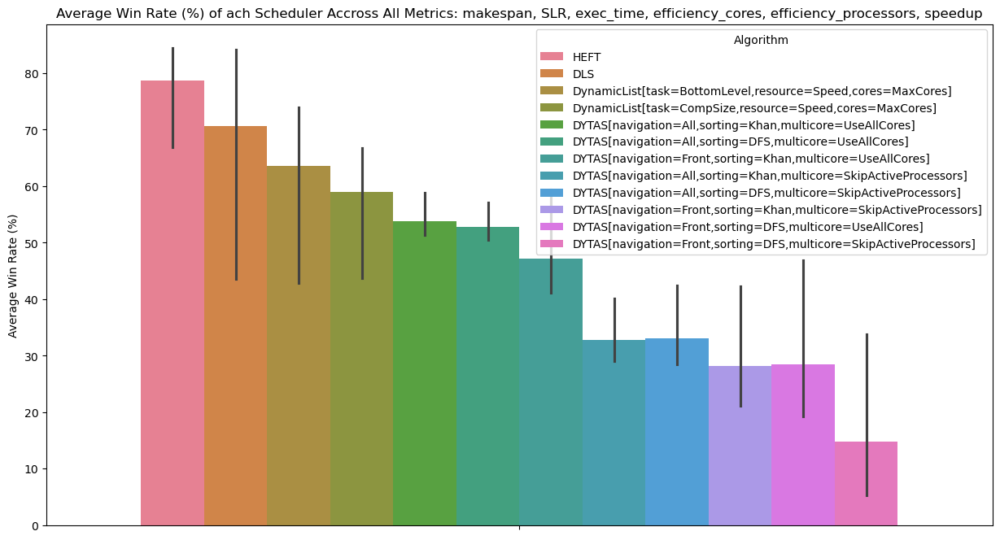

In [88]:
win_rates_dic = {}
for metric, val in comparison_stats_scores.items():
    ranks = rank_pairwise_comparison(val)
    win_rates_dic[metric] = pd.DataFrame(ranks.reset_index(names="Algorithm"))

win_rates_df = pd.concat(win_rates_dic, names=["metric"]).reset_index(level=0).reset_index(drop=True)

plt.figure(figsize=(15,8))
sns.barplot(data=win_rates_df, hue="Algorithm",y="Average Win Rate (%)")
plt.title("Average Win Rate (%) of ach Scheduler Accross All Metrics: " + ", ".join(win_rates_df.metric.unique()))
plt.show()

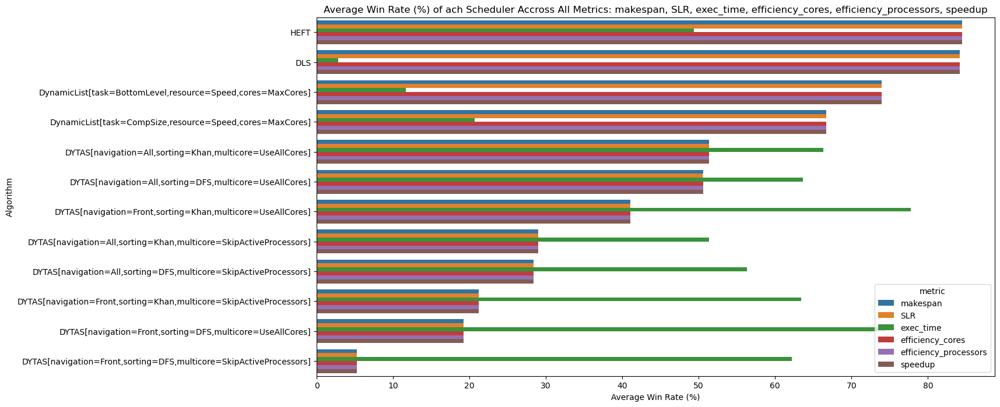

In [89]:
plt.figure(figsize=(15,8))
sns.barplot(data=win_rates_df, hue="metric",y="Algorithm",x="Average Win Rate (%)")
plt.title("Average Win Rate (%) of ach Scheduler Accross All Metrics: " + ", ".join(win_rates_df.metric.unique()))
# plt.xticks(rotation=90)
plt.show()

# Verifying the heterogeneous and homogeneous system performance between algorithms

To either accept or reject my hypothesis: HEFT will perform better in heterogeneous systems and DYTAS better in homogeneous systems.

In [90]:
len(df[df.system_type=="homogeneous"])

1065312

In [91]:
len(df[df.system_type=="heterogeneous"])

1065312

<Axes: xlabel='SLR'>

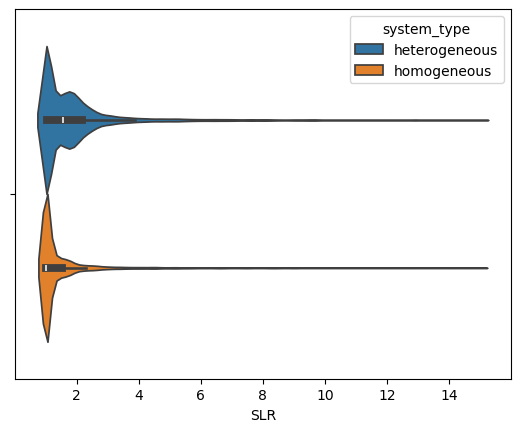

In [92]:
sns.violinplot(data=df[df.SLR < 15], x="SLR", hue="system_type")

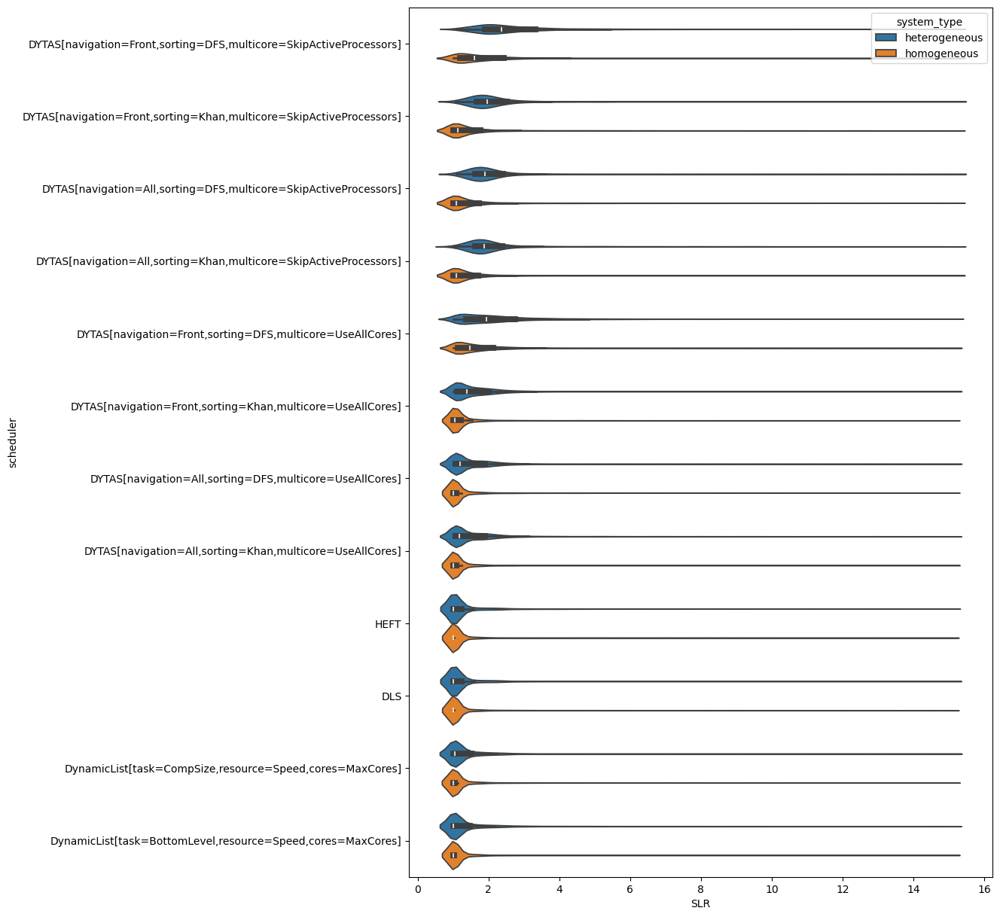

In [93]:
plt.figure(figsize=(10,15))
sns.violinplot(data=df[df.SLR < 15], x="SLR", hue="system_type", y="scheduler")
plt.show()

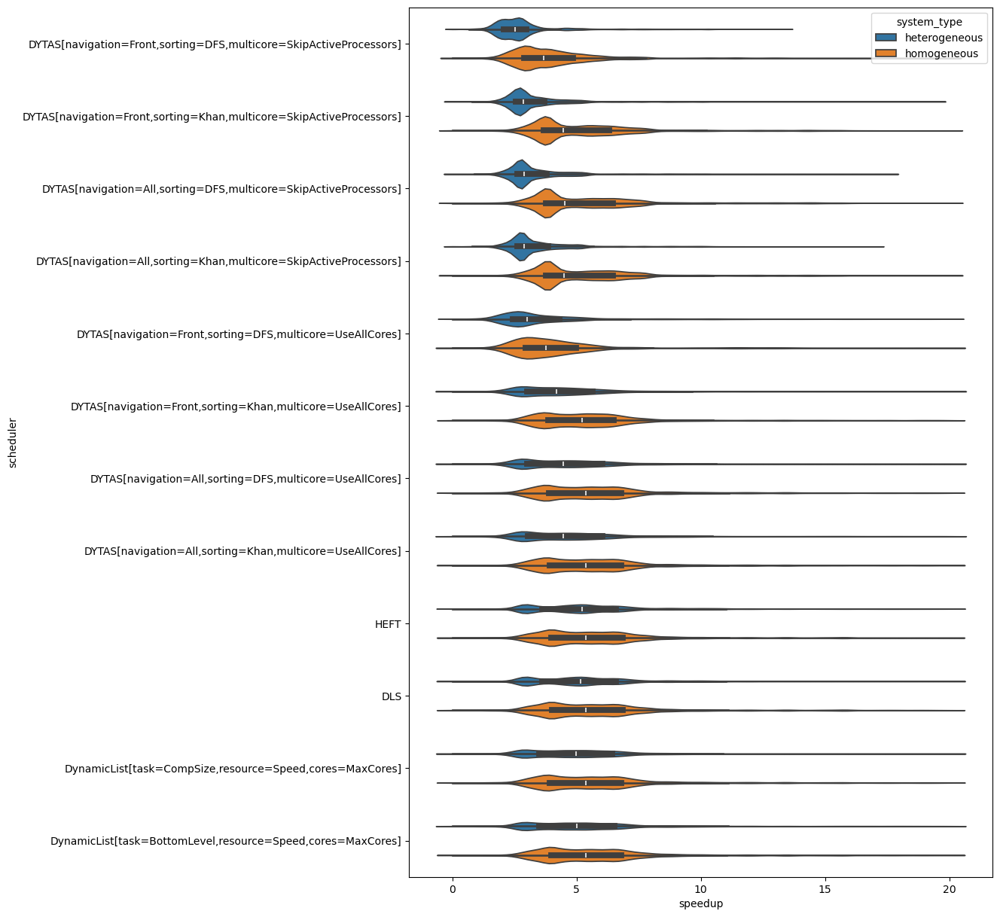

In [94]:
plt.figure(figsize=(10,15))
sns.violinplot(data=df[df.speedup < 20], x="speedup", hue="system_type", y="scheduler")
plt.show()

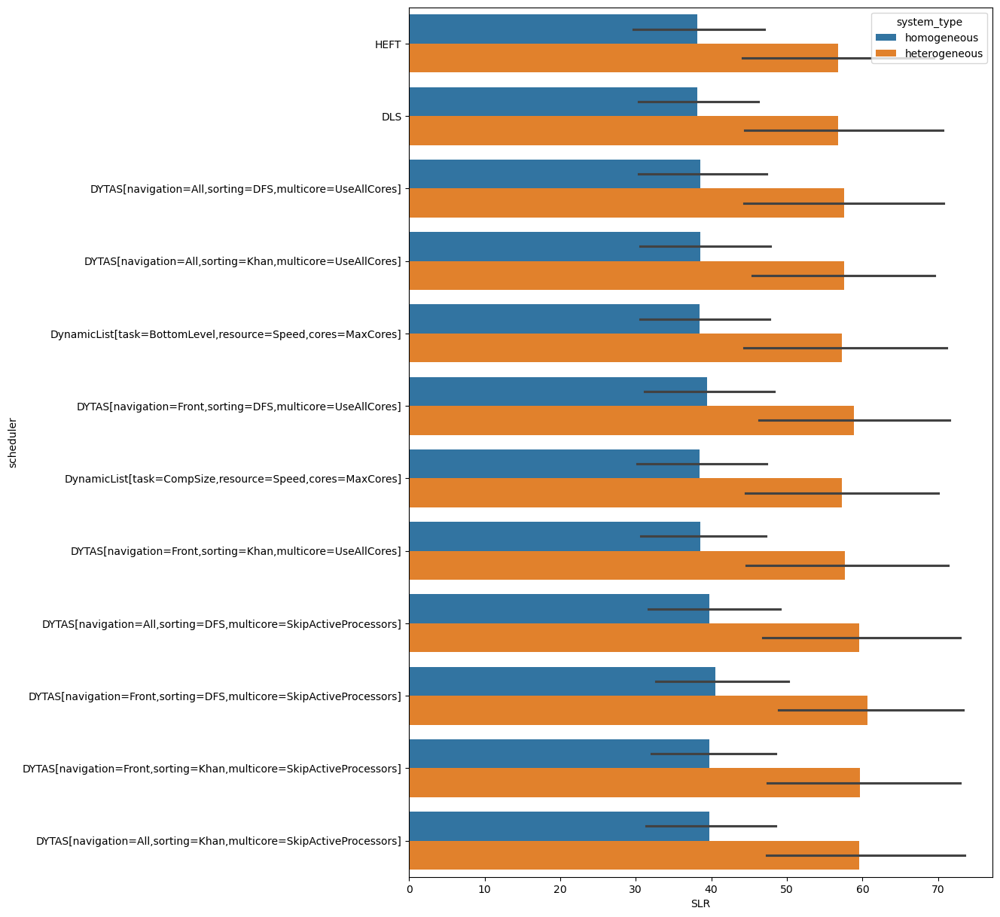

In [95]:
plt.figure(figsize=(10,15))
sns.barplot(data=df.sort_values(by="SLR"), x="SLR", hue="system_type", y="scheduler")
plt.show()

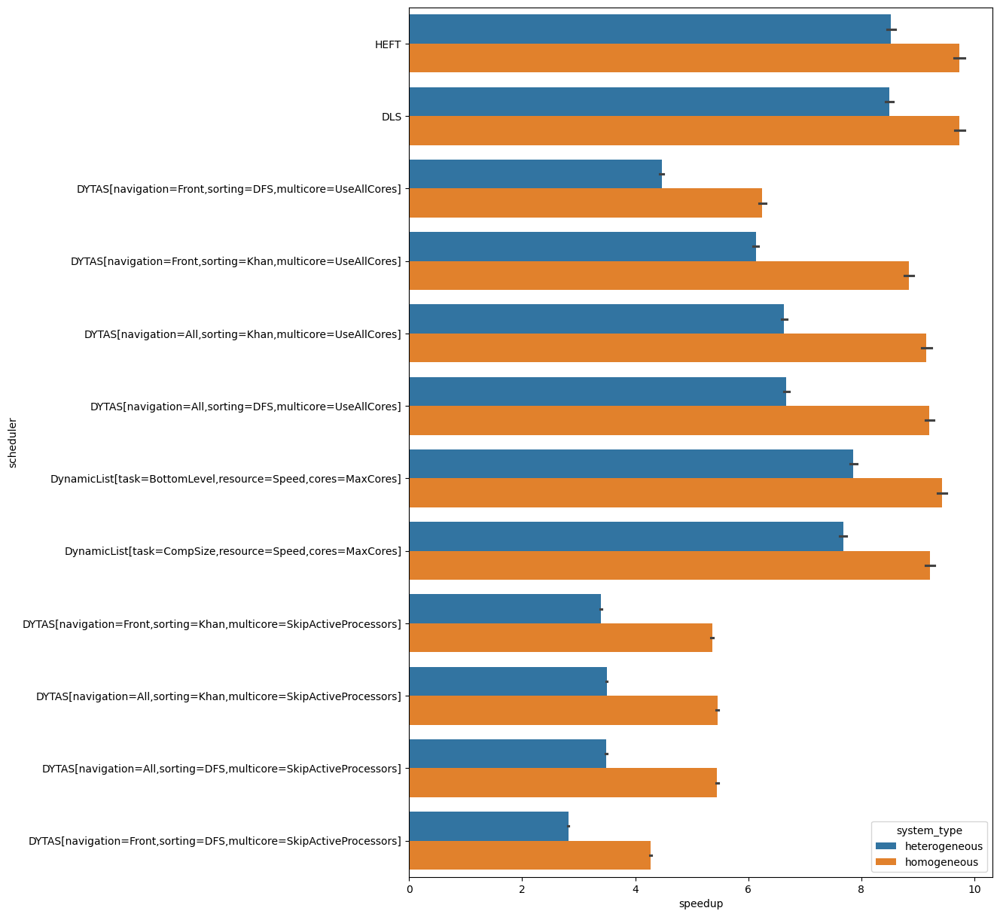

In [96]:
plt.figure(figsize=(10,15))
sns.barplot(data=df.sort_values(by="speedup"), x="speedup", hue="system_type", y="scheduler")
plt.show()

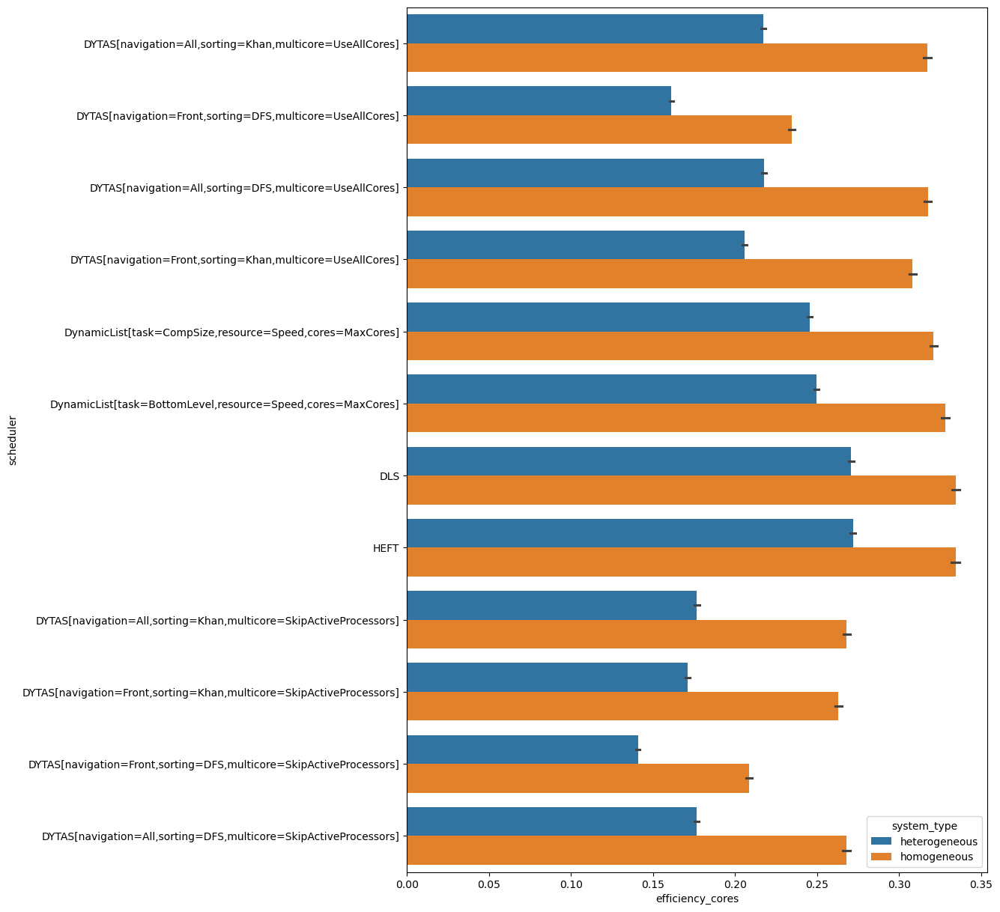

In [97]:
plt.figure(figsize=(10,15))
sns.barplot(data=df.sort_values(by="efficiency_cores"), x="efficiency_cores", hue="system_type", y="scheduler")
plt.show()

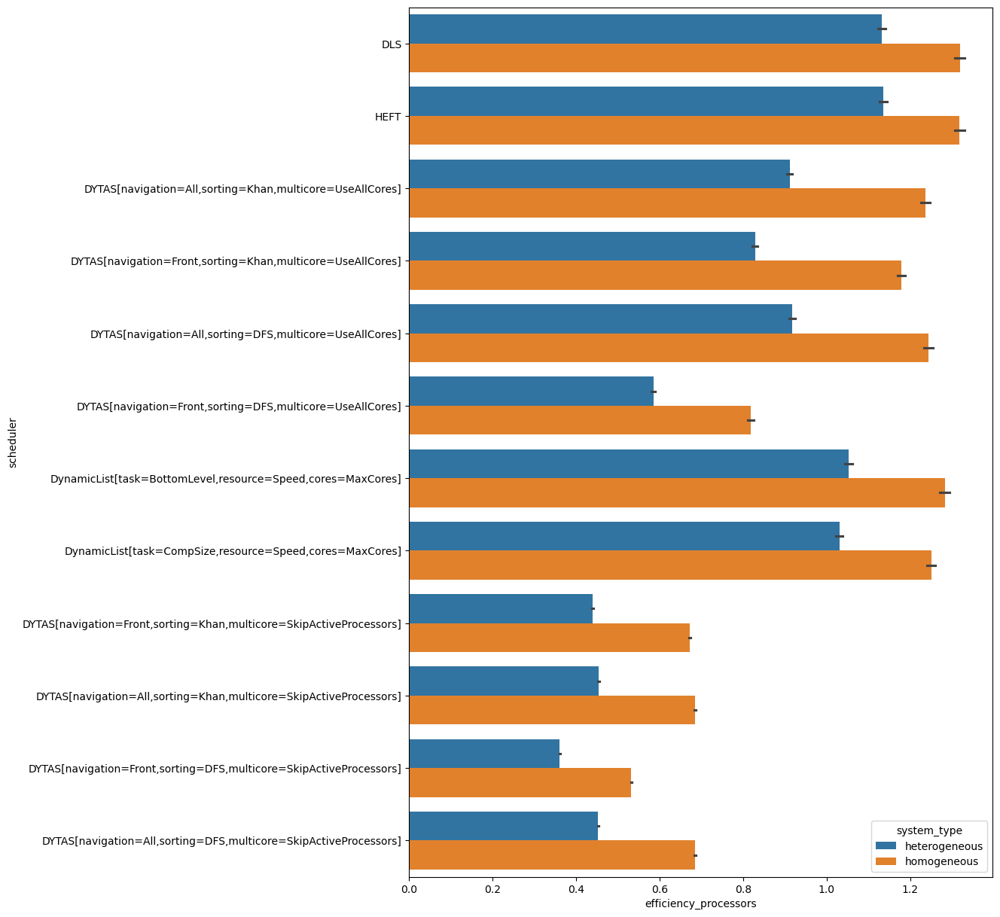

In [98]:
plt.figure(figsize=(10,15))
sns.barplot(data=df.sort_values(by="efficiency_processors"), x="efficiency_processors", hue="system_type", y="scheduler")
plt.show()

In [99]:
comparison_stats_scores_het = calculate_comparison_on_all_metrics(df[df.system_type == "heterogeneous"])

defaultdict(<function calculate_pairwise_comparison.<locals>.<lambda> at 0x7fb18d77d760>, {('DLS', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 90.71483283770388, 'E': 6.184103811841038, 'W': 3.1010633504550777}, ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'DLS'): {'B': 3.1010633504550777, 'E': 6.184103811841038, 'W': 90.71483283770388}, ('DLS', 'DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]'): {'B': 98.20559610705597, 'E': 0.0, 'W': 1.794403892944039}, ('DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]', 'DLS'): {'B': 1.794403892944039, 'E': 0.0, 'W': 98.20559610705597}, ('DLS', 'DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]'): {'B': 95.17549788231054, 'E': 2.9501216545012166, 'W': 1.874380463188249}, ('DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]', 'DLS'): {'B': 1.874380463188249, 'E': 2.9501216545012166, 'W': 95.17549788231054}, ('DLS', 'DYTAS[navigation=All,sorting=Khan,multicore=SkipActi

<Figure size 1500x800 with 0 Axes>

DLS  \
Algorithm                                          Result           
DLS                                                B                
                                                   E                
                                                   W                
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B        1.79%   
                                                   E        0.00%   
                                                   W       98.21%   
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B        1.87%   
                                                   E        2.95%   
                                                   W       95.18%   
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B        1.51%   
                                                   E        0.00%   
                                                   W       98.49%   
DYTAS[navigation=All,sorting=Khan,multicore=Use... B        1.47%   
                                                   E        4.24%   
                                                   W       94.29%   
DYTAS[navigation=Front,sorting=DFS,multicore=Sk... B        1.40%   
                                                   E        0.00%   
                                                   W       98.60%   
DYTAS[navigation=Front,sorting=DFS,multicore=Us... B        1.33%   
                                                   E        0.72%   
                                                   W       97.95%   
DYTAS[navigation=Front,sorting=Khan,multicore=S... B        1.46%   
                                                   E        0.00%   
                                                   W       98.54%   
DYTAS[navigation=Front,sorting=Khan,multicore=U... B        1.35%   
                                                   E        3.06%   
                                                   W       95.59%   
DynamicList[task=BottomLevel,resource=Speed,cor... B        5.67%   
                                                   E       10.65%   
                                                   W       83.68%   
DynamicList[task=CompSize,resource=Speed,cores=... B        3.10%   
                                                   E        6.18%   
                                                   W       90.71%   
HEFT                                               B       25.13%   
                                                   E       61.76%   
                                                   W       13.11%   

                                                          DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]  \
Algorithm                                          Result                                                                    
DLS                                                B                                                  98.21%                 
                                                   E                                                   0.00%                 
                                                   W                                                   1.79%                 
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B                                                                         
                                                   E                                                                         
                                                   W                                                                         
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B                                                  65.99%                 
                                                   E                                                  33.33%                 
                                                   W                                                   0.67%                 
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B 

defaultdict(<function calculate_pairwise_comparison.<locals>.<lambda> at 0x7fb1de124d60>, {('DLS', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 90.71483283770388, 'E': 6.184103811841038, 'W': 3.1010633504550777}, ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'DLS'): {'B': 3.1010633504550777, 'E': 6.184103811841038, 'W': 90.71483283770388}, ('DLS', 'DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]'): {'B': 98.20559610705597, 'E': 0.0, 'W': 1.794403892944039}, ('DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]', 'DLS'): {'B': 1.794403892944039, 'E': 0.0, 'W': 98.20559610705597}, ('DLS', 'DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]'): {'B': 95.17549788231054, 'E': 2.9501216545012166, 'W': 1.874380463188249}, ('DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]', 'DLS'): {'B': 1.874380463188249, 'E': 2.9501216545012166, 'W': 95.17549788231054}, ('DLS', 'DYTAS[navigation=All,sorting=Khan,multicore=SkipActi

<Figure size 1500x800 with 0 Axes>

DLS  \
Algorithm                                          Result           
DLS                                                B                
                                                   E                
                                                   W                
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B        1.79%   
                                                   E        0.00%   
                                                   W       98.21%   
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B        1.87%   
                                                   E        2.95%   
                                                   W       95.18%   
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B        1.51%   
                                                   E        0.00%   
                                                   W       98.49%   
DYTAS[navigation=All,sorting=Khan,multicore=Use... B        1.47%   
                                                   E        4.24%   
                                                   W       94.29%   
DYTAS[navigation=Front,sorting=DFS,multicore=Sk... B        1.40%   
                                                   E        0.00%   
                                                   W       98.60%   
DYTAS[navigation=Front,sorting=DFS,multicore=Us... B        1.33%   
                                                   E        0.72%   
                                                   W       97.95%   
DYTAS[navigation=Front,sorting=Khan,multicore=S... B        1.46%   
                                                   E        0.00%   
                                                   W       98.54%   
DYTAS[navigation=Front,sorting=Khan,multicore=U... B        1.35%   
                                                   E        3.06%   
                                                   W       95.59%   
DynamicList[task=BottomLevel,resource=Speed,cor... B        5.67%   
                                                   E       10.65%   
                                                   W       83.68%   
DynamicList[task=CompSize,resource=Speed,cores=... B        3.10%   
                                                   E        6.18%   
                                                   W       90.71%   
HEFT                                               B       25.13%   
                                                   E       61.76%   
                                                   W       13.11%   

                                                          DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]  \
Algorithm                                          Result                                                                    
DLS                                                B                                                  98.21%                 
                                                   E                                                   0.00%                 
                                                   W                                                   1.79%                 
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B                                                                         
                                                   E                                                                         
                                                   W                                                                         
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B                                                  65.99%                 
                                                   E                                                  33.33%                 
                                                   W                                                   0.67%                 
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B 

defaultdict(<function calculate_pairwise_comparison.<locals>.<lambda> at 0x7fb1de3efd80>, {('DLS', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 4.364918446426962, 'E': 0.0, 'W': 95.63508155357304}, ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'DLS'): {'B': 95.63508155357304, 'E': 0.0, 'W': 4.364918446426962}, ('DLS', 'DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]'): {'B': 0.9022708840227088, 'E': 0.0, 'W': 99.09772911597729}, ('DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]', 'DLS'): {'B': 99.09772911597729, 'E': 0.0, 'W': 0.9022708840227088}, ('DLS', 'DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]'): {'B': 0.9833738848337389, 'E': 0.0, 'W': 99.01662611516626}, ('DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]', 'DLS'): {'B': 99.01662611516626, 'E': 0.0, 'W': 0.9833738848337389}, ('DLS', 'DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]'): {'B': 0.5496981166080923, 'E': 0.0, 'W'

<Figure size 1500x800 with 0 Axes>

DLS  \
Algorithm                                          Result           
DLS                                                B                
                                                   E                
                                                   W                
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B       99.10%   
                                                   E        0.00%   
                                                   W        0.90%   
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B       99.02%   
                                                   E        0.00%   
                                                   W        0.98%   
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B       99.45%   
                                                   E        0.00%   
                                                   W        0.55%   
DYTAS[navigation=All,sorting=Khan,multicore=Use... B       99.22%   
                                                   E        0.00%   
                                                   W        0.78%   
DYTAS[navigation=Front,sorting=DFS,multicore=Sk... B       99.17%   
                                                   E        0.00%   
                                                   W        0.83%   
DYTAS[navigation=Front,sorting=DFS,multicore=Us... B       99.52%   
                                                   E        0.00%   
                                                   W        0.48%   
DYTAS[navigation=Front,sorting=Khan,multicore=S... B       98.95%   
                                                   E        0.00%   
                                                   W        1.05%   
DYTAS[navigation=Front,sorting=Khan,multicore=U... B       99.53%   
                                                   E        0.00%   
                                                   W        0.47%   
DynamicList[task=BottomLevel,resource=Speed,cor... B       80.94%   
                                                   E        0.00%   
                                                   W       19.06%   
DynamicList[task=CompSize,resource=Speed,cores=... B       95.64%   
                                                   E        0.00%   
                                                   W        4.36%   
HEFT                                               B       98.66%   
                                                   E        0.00%   
                                                   W        1.34%   

                                                          DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]  \
Algorithm                                          Result                                                                    
DLS                                                B                                                   0.90%                 
                                                   E                                                   0.00%                 
                                                   W                                                  99.10%                 
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B                                                                         
                                                   E                                                                         
                                                   W                                                                         
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B                                                  58.17%                 
                                                   E                                                   0.00%                 
                                                   W                                                  41.83%                 
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B 

defaultdict(<function calculate_pairwise_comparison.<locals>.<lambda> at 0x7fb1de3eff60>, {('DLS', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 90.71483283770388, 'E': 6.184103811841038, 'W': 3.1010633504550777}, ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'DLS'): {'B': 3.1010633504550777, 'E': 6.184103811841038, 'W': 90.71483283770388}, ('DLS', 'DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]'): {'B': 98.20559610705597, 'E': 0.0, 'W': 1.794403892944039}, ('DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]', 'DLS'): {'B': 1.794403892944039, 'E': 0.0, 'W': 98.20559610705597}, ('DLS', 'DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]'): {'B': 95.17549788231054, 'E': 2.9501216545012166, 'W': 1.874380463188249}, ('DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]', 'DLS'): {'B': 1.874380463188249, 'E': 2.9501216545012166, 'W': 95.17549788231054}, ('DLS', 'DYTAS[navigation=All,sorting=Khan,multicore=SkipActi

<Figure size 1500x800 with 0 Axes>

DLS  \
Algorithm                                          Result           
DLS                                                B                
                                                   E                
                                                   W                
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B        1.79%   
                                                   E        0.00%   
                                                   W       98.21%   
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B        1.87%   
                                                   E        2.95%   
                                                   W       95.18%   
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B        1.51%   
                                                   E        0.00%   
                                                   W       98.49%   
DYTAS[navigation=All,sorting=Khan,multicore=Use... B        1.47%   
                                                   E        4.24%   
                                                   W       94.29%   
DYTAS[navigation=Front,sorting=DFS,multicore=Sk... B        1.40%   
                                                   E        0.00%   
                                                   W       98.60%   
DYTAS[navigation=Front,sorting=DFS,multicore=Us... B        1.33%   
                                                   E        0.72%   
                                                   W       97.95%   
DYTAS[navigation=Front,sorting=Khan,multicore=S... B        1.46%   
                                                   E        0.00%   
                                                   W       98.54%   
DYTAS[navigation=Front,sorting=Khan,multicore=U... B        1.35%   
                                                   E        3.06%   
                                                   W       95.59%   
DynamicList[task=BottomLevel,resource=Speed,cor... B        5.67%   
                                                   E       10.65%   
                                                   W       83.68%   
DynamicList[task=CompSize,resource=Speed,cores=... B        3.10%   
                                                   E        6.18%   
                                                   W       90.71%   
HEFT                                               B       25.13%   
                                                   E       61.76%   
                                                   W       13.11%   

                                                          DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]  \
Algorithm                                          Result                                                                    
DLS                                                B                                                  98.21%                 
                                                   E                                                   0.00%                 
                                                   W                                                   1.79%                 
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B                                                                         
                                                   E                                                                         
                                                   W                                                                         
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B                                                  65.99%                 
                                                   E                                                  33.33%                 
                                                   W                                                   0.67%                 
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B 

defaultdict(<function calculate_pairwise_comparison.<locals>.<lambda> at 0x7fb134900ae0>, {('DLS', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 90.71483283770388, 'E': 6.184103811841038, 'W': 3.1010633504550777}, ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'DLS'): {'B': 3.1010633504550777, 'E': 6.184103811841038, 'W': 90.71483283770388}, ('DLS', 'DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]'): {'B': 98.20559610705597, 'E': 0.0, 'W': 1.794403892944039}, ('DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]', 'DLS'): {'B': 1.794403892944039, 'E': 0.0, 'W': 98.20559610705597}, ('DLS', 'DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]'): {'B': 95.17549788231054, 'E': 2.9501216545012166, 'W': 1.874380463188249}, ('DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]', 'DLS'): {'B': 1.874380463188249, 'E': 2.9501216545012166, 'W': 95.17549788231054}, ('DLS', 'DYTAS[navigation=All,sorting=Khan,multicore=SkipActi

<Figure size 1500x800 with 0 Axes>

DLS  \
Algorithm                                          Result           
DLS                                                B                
                                                   E                
                                                   W                
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B        1.79%   
                                                   E        0.00%   
                                                   W       98.21%   
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B        1.87%   
                                                   E        2.95%   
                                                   W       95.18%   
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B        1.51%   
                                                   E        0.00%   
                                                   W       98.49%   
DYTAS[navigation=All,sorting=Khan,multicore=Use... B        1.47%   
                                                   E        4.24%   
                                                   W       94.29%   
DYTAS[navigation=Front,sorting=DFS,multicore=Sk... B        1.40%   
                                                   E        0.00%   
                                                   W       98.60%   
DYTAS[navigation=Front,sorting=DFS,multicore=Us... B        1.33%   
                                                   E        0.72%   
                                                   W       97.95%   
DYTAS[navigation=Front,sorting=Khan,multicore=S... B        1.46%   
                                                   E        0.00%   
                                                   W       98.54%   
DYTAS[navigation=Front,sorting=Khan,multicore=U... B        1.35%   
                                                   E        3.06%   
                                                   W       95.59%   
DynamicList[task=BottomLevel,resource=Speed,cor... B        5.67%   
                                                   E       10.65%   
                                                   W       83.68%   
DynamicList[task=CompSize,resource=Speed,cores=... B        3.10%   
                                                   E        6.18%   
                                                   W       90.71%   
HEFT                                               B       25.13%   
                                                   E       61.76%   
                                                   W       13.11%   

                                                          DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]  \
Algorithm                                          Result                                                                    
DLS                                                B                                                  98.21%                 
                                                   E                                                   0.00%                 
                                                   W                                                   1.79%                 
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B                                                                         
                                                   E                                                                         
                                                   W                                                                         
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B                                                  65.99%                 
                                                   E                                                  33.33%                 
                                                   W                                                   0.67%                 
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B 

defaultdict(<function calculate_pairwise_comparison.<locals>.<lambda> at 0x7fb1dce95580>, {('DLS', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 90.71483283770388, 'E': 6.184103811841038, 'W': 3.1010633504550777}, ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'DLS'): {'B': 3.1010633504550777, 'E': 6.184103811841038, 'W': 90.71483283770388}, ('DLS', 'DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]'): {'B': 98.20559610705597, 'E': 0.0, 'W': 1.794403892944039}, ('DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]', 'DLS'): {'B': 1.794403892944039, 'E': 0.0, 'W': 98.20559610705597}, ('DLS', 'DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]'): {'B': 95.17549788231054, 'E': 2.9501216545012166, 'W': 1.874380463188249}, ('DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]', 'DLS'): {'B': 1.874380463188249, 'E': 2.9501216545012166, 'W': 95.17549788231054}, ('DLS', 'DYTAS[navigation=All,sorting=Khan,multicore=SkipActi

<Figure size 1500x800 with 0 Axes>

DLS  \
Algorithm                                          Result           
DLS                                                B                
                                                   E                
                                                   W                
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B        1.79%   
                                                   E        0.00%   
                                                   W       98.21%   
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B        1.87%   
                                                   E        2.95%   
                                                   W       95.18%   
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B        1.51%   
                                                   E        0.00%   
                                                   W       98.49%   
DYTAS[navigation=All,sorting=Khan,multicore=Use... B        1.47%   
                                                   E        4.24%   
                                                   W       94.29%   
DYTAS[navigation=Front,sorting=DFS,multicore=Sk... B        1.40%   
                                                   E        0.00%   
                                                   W       98.60%   
DYTAS[navigation=Front,sorting=DFS,multicore=Us... B        1.33%   
                                                   E        0.72%   
                                                   W       97.95%   
DYTAS[navigation=Front,sorting=Khan,multicore=S... B        1.46%   
                                                   E        0.00%   
                                                   W       98.54%   
DYTAS[navigation=Front,sorting=Khan,multicore=U... B        1.35%   
                                                   E        3.06%   
                                                   W       95.59%   
DynamicList[task=BottomLevel,resource=Speed,cor... B        5.67%   
                                                   E       10.65%   
                                                   W       83.68%   
DynamicList[task=CompSize,resource=Speed,cores=... B        3.10%   
                                                   E        6.18%   
                                                   W       90.71%   
HEFT                                               B       25.13%   
                                                   E       61.76%   
                                                   W       13.11%   

                                                          DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]  \
Algorithm                                          Result                                                                    
DLS                                                B                                                  98.21%                 
                                                   E                                                   0.00%                 
                                                   W                                                   1.79%                 
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B                                                                         
                                                   E                                                                         
                                                   W                                                                         
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B                                                  65.99%                 
                                                   E                                                  33.33%                 
                                                   W                                                   0.67%                 
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B 

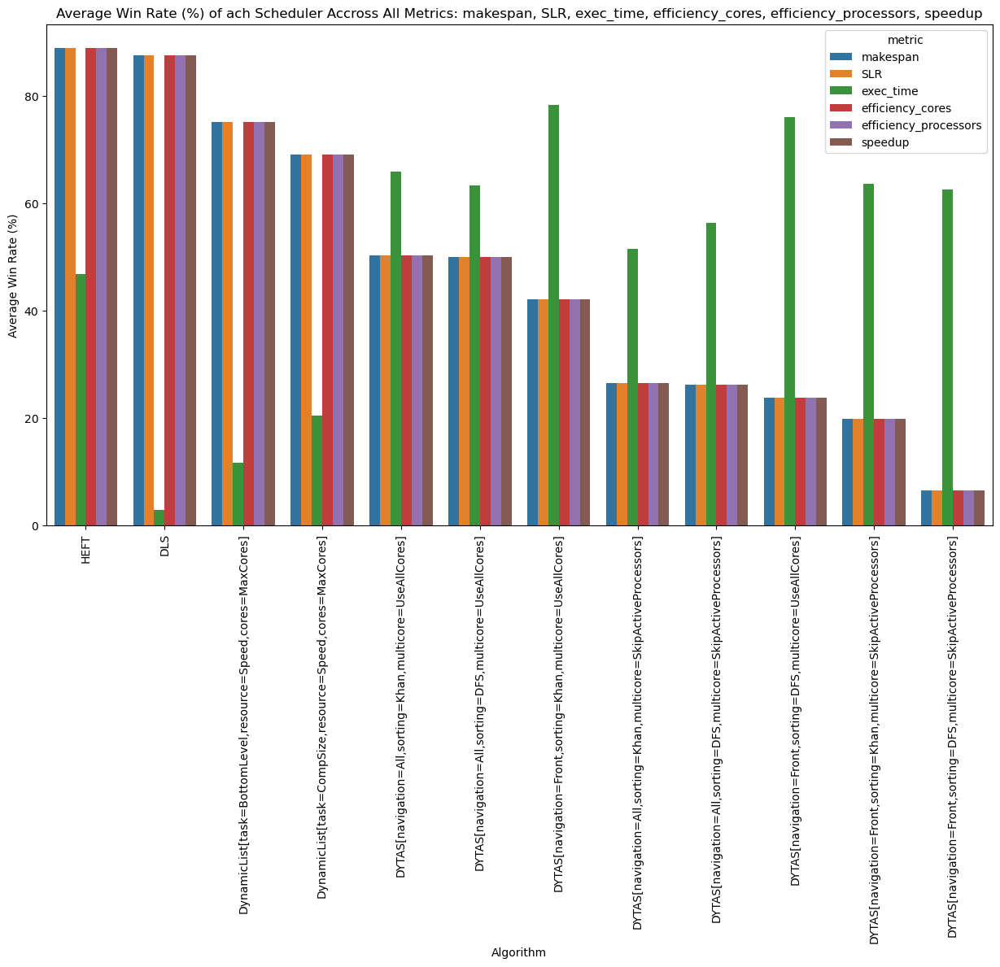

In [100]:
win_rates_dic = {}
for metric, val in comparison_stats_scores_het.items():
    ranks = rank_pairwise_comparison(val)
    win_rates_dic[metric] = pd.DataFrame(ranks.reset_index(names="Algorithm"))

win_rates_df = pd.concat(win_rates_dic, names=["metric"]).reset_index(level=0).reset_index(drop=True)

plt.figure(figsize=(15,8))
sns.barplot(data=win_rates_df, hue="metric",x="Algorithm",y="Average Win Rate (%)")
plt.xticks(rotation=90)
plt.title("Average Win Rate (%) of ach Scheduler Accross All Metrics: " + ", ".join(win_rates_df.metric.unique()))
plt.show()

In [101]:
comparison_stats_scores_hom = calculate_comparison_on_all_metrics(df[df.system_type == "homogeneous"])

defaultdict(<function calculate_pairwise_comparison.<locals>.<lambda> at 0x7fb194311260>, {('DLS', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 69.71140848878075, 'E': 26.277372262773724, 'W': 4.011219248445526}, ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'DLS'): {'B': 4.011219248445526, 'E': 26.277372262773724, 'W': 69.71140848878075}, ('DLS', 'DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]'): {'B': 97.7764260610976, 'E': 0.0, 'W': 2.223573938902406}, ('DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]', 'DLS'): {'B': 2.223573938902406, 'E': 0.0, 'W': 97.7764260610976}, ('DLS', 'DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]'): {'B': 88.7480850680364, 'E': 7.887266828872669, 'W': 3.3646481030909254}, ('DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]', 'DLS'): {'B': 3.3646481030909254, 'E': 7.887266828872669, 'W': 88.7480850680364}, ('DLS', 'DYTAS[navigation=All,sorting=Khan,multicore=SkipActivePr

<Figure size 1500x800 with 0 Axes>

DLS  \
Algorithm                                          Result           
DLS                                                B                
                                                   E                
                                                   W                
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B        2.22%   
                                                   E        0.00%   
                                                   W       97.78%   
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B        3.36%   
                                                   E        7.89%   
                                                   W       88.75%   
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B        2.08%   
                                                   E        0.06%   
                                                   W       97.86%   
DYTAS[navigation=All,sorting=Khan,multicore=Use... B        2.91%   
                                                   E       13.86%   
                                                   W       83.23%   
DYTAS[navigation=Front,sorting=DFS,multicore=Sk... B        1.71%   
                                                   E        0.00%   
                                                   W       98.29%   
DYTAS[navigation=Front,sorting=DFS,multicore=Us... B        1.81%   
                                                   E        1.48%   
                                                   W       96.71%   
DYTAS[navigation=Front,sorting=Khan,multicore=S... B        1.99%   
                                                   E        0.06%   
                                                   W       97.95%   
DYTAS[navigation=Front,sorting=Khan,multicore=U... B        2.35%   
                                                   E        7.02%   
                                                   W       90.63%   
DynamicList[task=BottomLevel,resource=Speed,cor... B        8.86%   
                                                   E       33.09%   
                                                   W       58.05%   
DynamicList[task=CompSize,resource=Speed,cores=... B        4.01%   
                                                   E       26.28%   
                                                   W       69.71%   
HEFT                                               B        2.24%   
                                                   E       88.93%   
                                                   W        8.83%   

                                                          DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]  \
Algorithm                                          Result                                                                    
DLS                                                B                                                  97.78%                 
                                                   E                                                   0.00%                 
                                                   W                                                   2.22%                 
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B                                                                         
                                                   E                                                                         
                                                   W                                                                         
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B                                                  65.92%                 
                                                   E                                                  33.34%                 
                                                   W                                                   0.74%                 
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B 

defaultdict(<function calculate_pairwise_comparison.<locals>.<lambda> at 0x7fb208113ba0>, {('DLS', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 69.71140848878075, 'E': 26.277372262773724, 'W': 4.011219248445526}, ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'DLS'): {'B': 4.011219248445526, 'E': 26.277372262773724, 'W': 69.71140848878075}, ('DLS', 'DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]'): {'B': 97.7764260610976, 'E': 0.0, 'W': 2.223573938902406}, ('DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]', 'DLS'): {'B': 2.223573938902406, 'E': 0.0, 'W': 97.7764260610976}, ('DLS', 'DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]'): {'B': 88.7480850680364, 'E': 7.887266828872669, 'W': 3.3646481030909254}, ('DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]', 'DLS'): {'B': 3.3646481030909254, 'E': 7.887266828872669, 'W': 88.7480850680364}, ('DLS', 'DYTAS[navigation=All,sorting=Khan,multicore=SkipActivePr

<Figure size 1500x800 with 0 Axes>

DLS  \
Algorithm                                          Result           
DLS                                                B                
                                                   E                
                                                   W                
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B        2.22%   
                                                   E        0.00%   
                                                   W       97.78%   
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B        3.36%   
                                                   E        7.89%   
                                                   W       88.75%   
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B        2.08%   
                                                   E        0.06%   
                                                   W       97.86%   
DYTAS[navigation=All,sorting=Khan,multicore=Use... B        2.91%   
                                                   E       13.86%   
                                                   W       83.23%   
DYTAS[navigation=Front,sorting=DFS,multicore=Sk... B        1.71%   
                                                   E        0.00%   
                                                   W       98.29%   
DYTAS[navigation=Front,sorting=DFS,multicore=Us... B        1.81%   
                                                   E        1.48%   
                                                   W       96.71%   
DYTAS[navigation=Front,sorting=Khan,multicore=S... B        1.99%   
                                                   E        0.06%   
                                                   W       97.95%   
DYTAS[navigation=Front,sorting=Khan,multicore=U... B        2.35%   
                                                   E        7.02%   
                                                   W       90.63%   
DynamicList[task=BottomLevel,resource=Speed,cor... B        8.86%   
                                                   E       33.09%   
                                                   W       58.05%   
DynamicList[task=CompSize,resource=Speed,cores=... B        4.01%   
                                                   E       26.28%   
                                                   W       69.71%   
HEFT                                               B        2.24%   
                                                   E       88.93%   
                                                   W        8.83%   

                                                          DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]  \
Algorithm                                          Result                                                                    
DLS                                                B                                                  97.78%                 
                                                   E                                                   0.00%                 
                                                   W                                                   2.22%                 
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B                                                                         
                                                   E                                                                         
                                                   W                                                                         
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B                                                  65.92%                 
                                                   E                                                  33.34%                 
                                                   W                                                   0.74%                 
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B 

defaultdict(<function calculate_pairwise_comparison.<locals>.<lambda> at 0x7fb1de58de40>, {('DLS', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 4.261286834279535, 'E': 0.0, 'W': 95.73871316572047}, ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'DLS'): {'B': 95.73871316572047, 'E': 0.0, 'W': 4.261286834279535}, ('DLS', 'DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]'): {'B': 1.0216725241056142, 'E': 0.0, 'W': 98.97832747589439}, ('DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]', 'DLS'): {'B': 98.97832747589439, 'E': 0.0, 'W': 1.0216725241056142}, ('DLS', 'DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]'): {'B': 0.9721095791655402, 'E': 0.0, 'W': 99.02789042083445}, ('DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]', 'DLS'): {'B': 99.02789042083445, 'E': 0.0, 'W': 0.9721095791655402}, ('DLS', 'DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]'): {'B': 0.6217896728845634, 'E': 0.0, 'W'

<Figure size 1500x800 with 0 Axes>

DLS  \
Algorithm                                          Result           
DLS                                                B                
                                                   E                
                                                   W                
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B       98.98%   
                                                   E        0.00%   
                                                   W        1.02%   
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B       99.03%   
                                                   E        0.00%   
                                                   W        0.97%   
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B       99.38%   
                                                   E        0.00%   
                                                   W        0.62%   
DYTAS[navigation=All,sorting=Khan,multicore=Use... B       99.14%   
                                                   E        0.00%   
                                                   W        0.86%   
DYTAS[navigation=Front,sorting=DFS,multicore=Sk... B       99.13%   
                                                   E        0.00%   
                                                   W        0.87%   
DYTAS[navigation=Front,sorting=DFS,multicore=Us... B       99.39%   
                                                   E        0.00%   
                                                   W        0.61%   
DYTAS[navigation=Front,sorting=Khan,multicore=S... B       98.87%   
                                                   E        0.00%   
                                                   W        1.13%   
DYTAS[navigation=Front,sorting=Khan,multicore=U... B       99.38%   
                                                   E        0.00%   
                                                   W        0.62%   
DynamicList[task=BottomLevel,resource=Speed,cor... B       80.74%   
                                                   E        0.00%   
                                                   W       19.26%   
DynamicList[task=CompSize,resource=Speed,cores=... B       95.74%   
                                                   E        0.00%   
                                                   W        4.26%   
HEFT                                               B       98.74%   
                                                   E        0.00%   
                                                   W        1.26%   

                                                          DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]  \
Algorithm                                          Result                                                                    
DLS                                                B                                                   1.02%                 
                                                   E                                                   0.00%                 
                                                   W                                                  98.98%                 
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B                                                                         
                                                   E                                                                         
                                                   W                                                                         
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B                                                  59.34%                 
                                                   E                                                   0.00%                 
                                                   W                                                  40.66%                 
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B 

defaultdict(<function calculate_pairwise_comparison.<locals>.<lambda> at 0x7fb1dcf4f380>, {('DLS', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 69.71140848878075, 'E': 26.277372262773724, 'W': 4.011219248445526}, ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'DLS'): {'B': 4.011219248445526, 'E': 26.277372262773724, 'W': 69.71140848878075}, ('DLS', 'DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]'): {'B': 97.7764260610976, 'E': 0.0, 'W': 2.223573938902406}, ('DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]', 'DLS'): {'B': 2.223573938902406, 'E': 0.0, 'W': 97.7764260610976}, ('DLS', 'DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]'): {'B': 88.7480850680364, 'E': 7.887266828872669, 'W': 3.3646481030909254}, ('DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]', 'DLS'): {'B': 3.3646481030909254, 'E': 7.887266828872669, 'W': 88.7480850680364}, ('DLS', 'DYTAS[navigation=All,sorting=Khan,multicore=SkipActivePr

<Figure size 1500x800 with 0 Axes>

DLS  \
Algorithm                                          Result           
DLS                                                B                
                                                   E                
                                                   W                
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B        2.22%   
                                                   E        0.00%   
                                                   W       97.78%   
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B        3.36%   
                                                   E        7.89%   
                                                   W       88.75%   
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B        2.08%   
                                                   E        0.06%   
                                                   W       97.86%   
DYTAS[navigation=All,sorting=Khan,multicore=Use... B        2.91%   
                                                   E       13.86%   
                                                   W       83.23%   
DYTAS[navigation=Front,sorting=DFS,multicore=Sk... B        1.71%   
                                                   E        0.00%   
                                                   W       98.29%   
DYTAS[navigation=Front,sorting=DFS,multicore=Us... B        1.81%   
                                                   E        1.48%   
                                                   W       96.71%   
DYTAS[navigation=Front,sorting=Khan,multicore=S... B        1.99%   
                                                   E        0.06%   
                                                   W       97.95%   
DYTAS[navigation=Front,sorting=Khan,multicore=U... B        2.35%   
                                                   E        7.02%   
                                                   W       90.63%   
DynamicList[task=BottomLevel,resource=Speed,cor... B        8.86%   
                                                   E       33.09%   
                                                   W       58.05%   
DynamicList[task=CompSize,resource=Speed,cores=... B        4.01%   
                                                   E       26.28%   
                                                   W       69.71%   
HEFT                                               B        2.24%   
                                                   E       88.93%   
                                                   W        8.83%   

                                                          DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]  \
Algorithm                                          Result                                                                    
DLS                                                B                                                  97.78%                 
                                                   E                                                   0.00%                 
                                                   W                                                   2.22%                 
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B                                                                         
                                                   E                                                                         
                                                   W                                                                         
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B                                                  65.92%                 
                                                   E                                                  33.34%                 
                                                   W                                                   0.74%                 
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B 

defaultdict(<function calculate_pairwise_comparison.<locals>.<lambda> at 0x7fb1ba57aac0>, {('DLS', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 69.71140848878075, 'E': 26.277372262773724, 'W': 4.011219248445526}, ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'DLS'): {'B': 4.011219248445526, 'E': 26.277372262773724, 'W': 69.71140848878075}, ('DLS', 'DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]'): {'B': 97.7764260610976, 'E': 0.0, 'W': 2.223573938902406}, ('DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]', 'DLS'): {'B': 2.223573938902406, 'E': 0.0, 'W': 97.7764260610976}, ('DLS', 'DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]'): {'B': 88.7480850680364, 'E': 7.887266828872669, 'W': 3.3646481030909254}, ('DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]', 'DLS'): {'B': 3.3646481030909254, 'E': 7.887266828872669, 'W': 88.7480850680364}, ('DLS', 'DYTAS[navigation=All,sorting=Khan,multicore=SkipActivePr

<Figure size 1500x800 with 0 Axes>

DLS  \
Algorithm                                          Result           
DLS                                                B                
                                                   E                
                                                   W                
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B        2.22%   
                                                   E        0.00%   
                                                   W       97.78%   
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B        3.36%   
                                                   E        7.89%   
                                                   W       88.75%   
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B        2.08%   
                                                   E        0.06%   
                                                   W       97.86%   
DYTAS[navigation=All,sorting=Khan,multicore=Use... B        2.91%   
                                                   E       13.86%   
                                                   W       83.23%   
DYTAS[navigation=Front,sorting=DFS,multicore=Sk... B        1.71%   
                                                   E        0.00%   
                                                   W       98.29%   
DYTAS[navigation=Front,sorting=DFS,multicore=Us... B        1.81%   
                                                   E        1.48%   
                                                   W       96.71%   
DYTAS[navigation=Front,sorting=Khan,multicore=S... B        1.99%   
                                                   E        0.06%   
                                                   W       97.95%   
DYTAS[navigation=Front,sorting=Khan,multicore=U... B        2.35%   
                                                   E        7.02%   
                                                   W       90.63%   
DynamicList[task=BottomLevel,resource=Speed,cor... B        8.86%   
                                                   E       33.09%   
                                                   W       58.05%   
DynamicList[task=CompSize,resource=Speed,cores=... B        4.01%   
                                                   E       26.28%   
                                                   W       69.71%   
HEFT                                               B        2.24%   
                                                   E       88.93%   
                                                   W        8.83%   

                                                          DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]  \
Algorithm                                          Result                                                                    
DLS                                                B                                                  97.78%                 
                                                   E                                                   0.00%                 
                                                   W                                                   2.22%                 
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B                                                                         
                                                   E                                                                         
                                                   W                                                                         
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B                                                  65.92%                 
                                                   E                                                  33.34%                 
                                                   W                                                   0.74%                 
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B 

defaultdict(<function calculate_pairwise_comparison.<locals>.<lambda> at 0x7fb1dd048fe0>, {('DLS', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 69.71140848878075, 'E': 26.277372262773724, 'W': 4.011219248445526}, ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'DLS'): {'B': 4.011219248445526, 'E': 26.277372262773724, 'W': 69.71140848878075}, ('DLS', 'DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]'): {'B': 97.7764260610976, 'E': 0.0, 'W': 2.223573938902406}, ('DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]', 'DLS'): {'B': 2.223573938902406, 'E': 0.0, 'W': 97.7764260610976}, ('DLS', 'DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]'): {'B': 88.7480850680364, 'E': 7.887266828872669, 'W': 3.3646481030909254}, ('DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]', 'DLS'): {'B': 3.3646481030909254, 'E': 7.887266828872669, 'W': 88.7480850680364}, ('DLS', 'DYTAS[navigation=All,sorting=Khan,multicore=SkipActivePr

<Figure size 1500x800 with 0 Axes>

DLS  \
Algorithm                                          Result           
DLS                                                B                
                                                   E                
                                                   W                
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B        2.22%   
                                                   E        0.00%   
                                                   W       97.78%   
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B        3.36%   
                                                   E        7.89%   
                                                   W       88.75%   
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B        2.08%   
                                                   E        0.06%   
                                                   W       97.86%   
DYTAS[navigation=All,sorting=Khan,multicore=Use... B        2.91%   
                                                   E       13.86%   
                                                   W       83.23%   
DYTAS[navigation=Front,sorting=DFS,multicore=Sk... B        1.71%   
                                                   E        0.00%   
                                                   W       98.29%   
DYTAS[navigation=Front,sorting=DFS,multicore=Us... B        1.81%   
                                                   E        1.48%   
                                                   W       96.71%   
DYTAS[navigation=Front,sorting=Khan,multicore=S... B        1.99%   
                                                   E        0.06%   
                                                   W       97.95%   
DYTAS[navigation=Front,sorting=Khan,multicore=U... B        2.35%   
                                                   E        7.02%   
                                                   W       90.63%   
DynamicList[task=BottomLevel,resource=Speed,cor... B        8.86%   
                                                   E       33.09%   
                                                   W       58.05%   
DynamicList[task=CompSize,resource=Speed,cores=... B        4.01%   
                                                   E       26.28%   
                                                   W       69.71%   
HEFT                                               B        2.24%   
                                                   E       88.93%   
                                                   W        8.83%   

                                                          DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]  \
Algorithm                                          Result                                                                    
DLS                                                B                                                  97.78%                 
                                                   E                                                   0.00%                 
                                                   W                                                   2.22%                 
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B                                                                         
                                                   E                                                                         
                                                   W                                                                         
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B                                                  65.92%                 
                                                   E                                                  33.34%                 
                                                   W                                                   0.74%                 
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B 

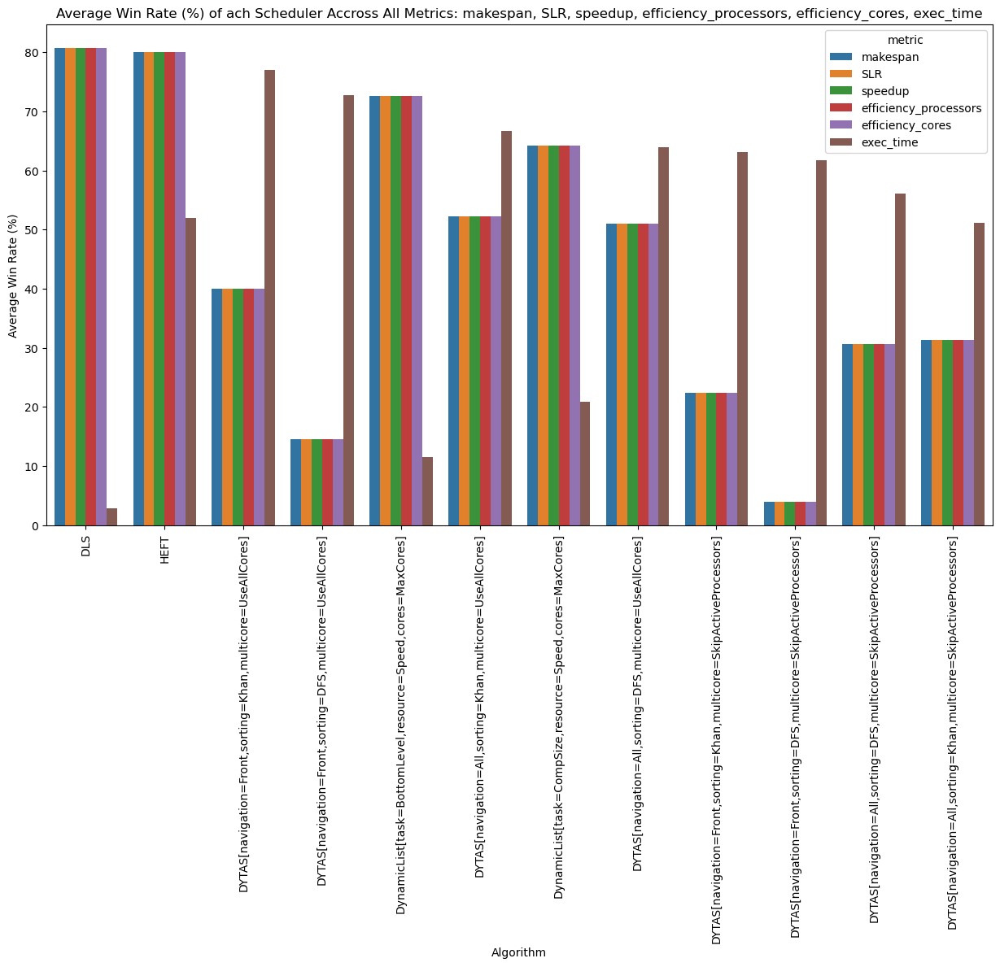

In [102]:
win_rates_dic = {}
for metric, val in comparison_stats_scores_hom.items():
    ranks = rank_pairwise_comparison(val)
    win_rates_dic[metric] = pd.DataFrame(ranks.reset_index(names="Algorithm"))

win_rates_df = pd.concat(win_rates_dic, names=["metric"]).reset_index(level=0).reset_index(drop=True)
win_rates_df = win_rates_df.sort_values(by="Average Win Rate (%)", ascending=False)

plt.figure(figsize=(15,8))
sns.barplot(data=win_rates_df, hue="metric",x="Algorithm",y="Average Win Rate (%)")
plt.xticks(rotation=90)
plt.title("Average Win Rate (%) of ach Scheduler Accross All Metrics: " + ", ".join(win_rates_df.metric.unique()))
plt.show()

# Impact of system network configurations

Eg. Network vs CCR

Core metrics: network_bandwidth, network_latency, network_model, run_stats.total_network_time, run_stats.total_network_traffic, CCR

The communication to computation ratio signfificantly increases as the network changes from `ConstantBandwidth` to `SharedBandwidth`

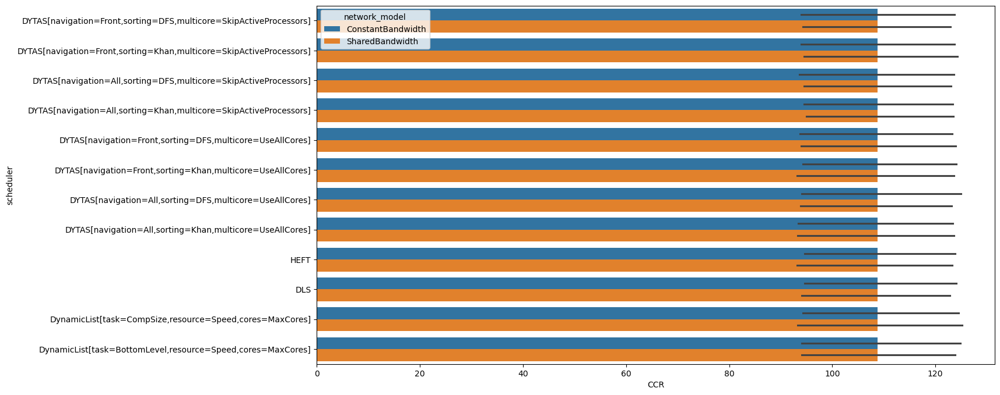

In [103]:
plt.figure(figsize=(15,8))
sns.barplot(data=df, y="scheduler", x="CCR", hue="network_model")
plt.show()

There is also a significant difference between `network_model` accross the board for all algorithms in terms of `SLR`.

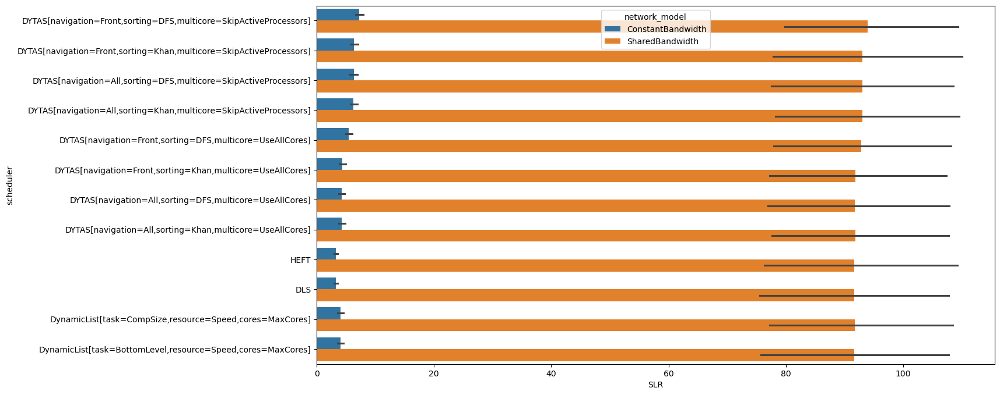

In [104]:
plt.figure(figsize=(15,8))
sns.barplot(data=df, y="scheduler", x="SLR", hue="network_model")
plt.show()

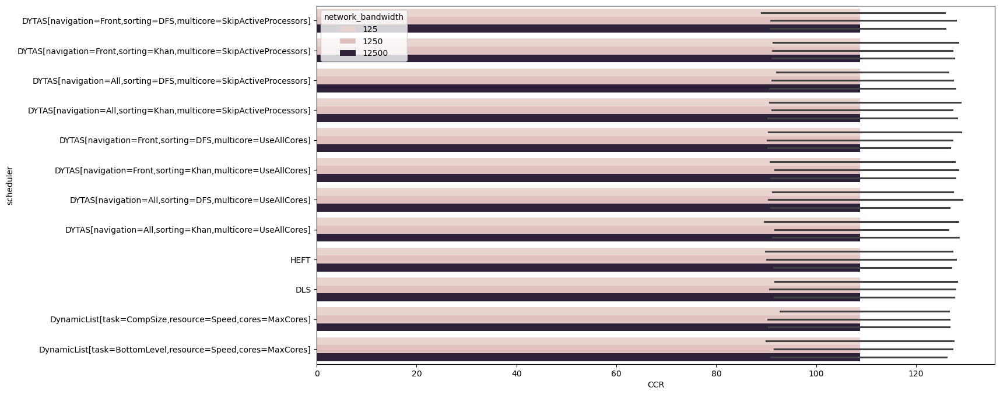

In [105]:
plt.figure(figsize=(15,8))
sns.barplot(data=df, y="scheduler", x="CCR", hue="network_bandwidth")
plt.show()

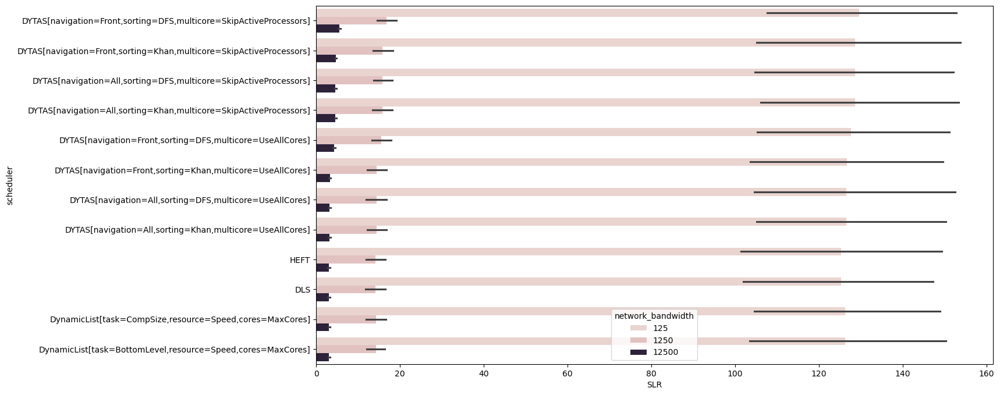

In [106]:
plt.figure(figsize=(15,8))
sns.barplot(data=df, y="scheduler", x="SLR", hue="network_bandwidth")
plt.show()

There doesnt seem to be a noticeable impact between network latencies of 10, 100, 1000

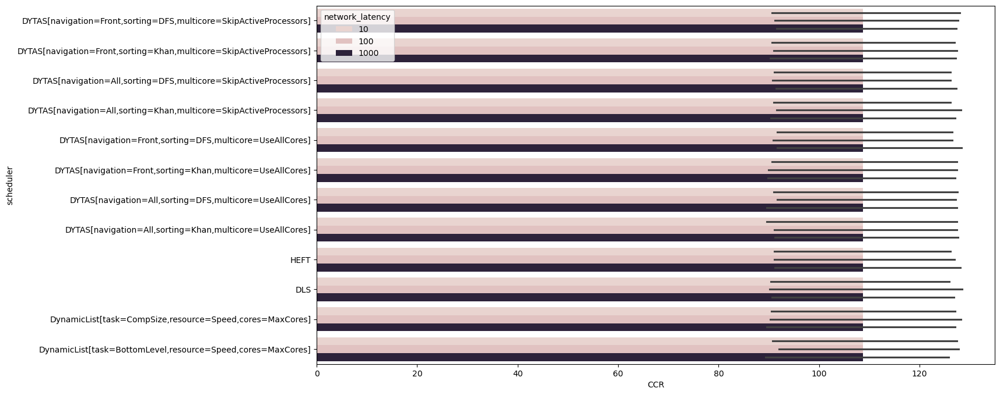

In [107]:
plt.figure(figsize=(15,8))
sns.barplot(data=df, y="scheduler", x="CCR", hue="network_latency")
plt.show()

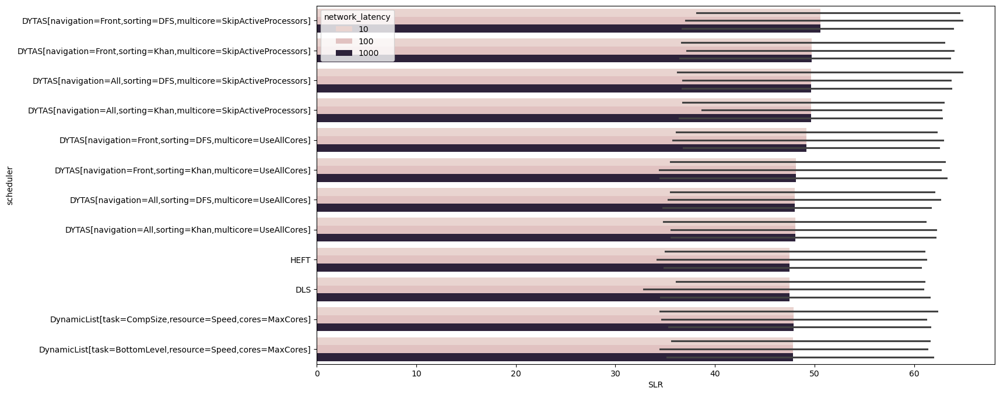

In [108]:
plt.figure(figsize=(15,8))
sns.barplot(data=df, y="scheduler", x="SLR", hue="network_latency")
plt.show()

# TO DO: Verify the impact of DAG density

In [109]:
# df_mean_slr = df[
#     ["SLR", "scheduler", "dag_density"]
# ].groupby(["scheduler"]).mean().reset_index()
# df_mean_slr = df_mean_slr.rename(columns={"SLR":"mean_SLR", "dag_density":"mean_dag_density"})

# plt.figure(figsize=(15,8))

# sns.scatterplot(
#     data=df_mean_slr[(df_mean_slr.dag_density < 0.029)],
#     y="mean_SLR", x="dag_density", hue="scheduler"
# )

# plt.show()

<Axes: xlabel='dag_density', ylabel='SLR'>

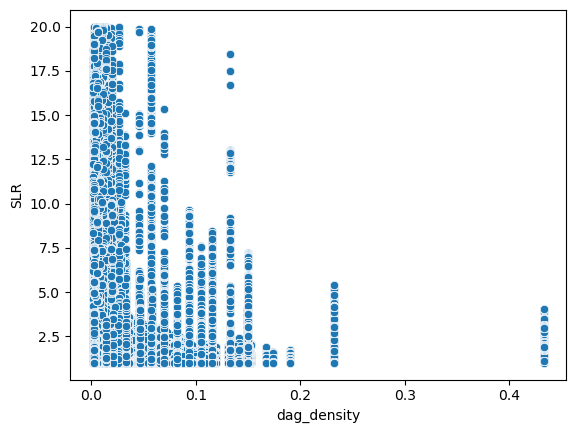

In [110]:
sns.scatterplot(df[df.SLR < 20], x="dag_density", y="SLR")

<Axes: xlabel='dag_density', ylabel='exec_time'>

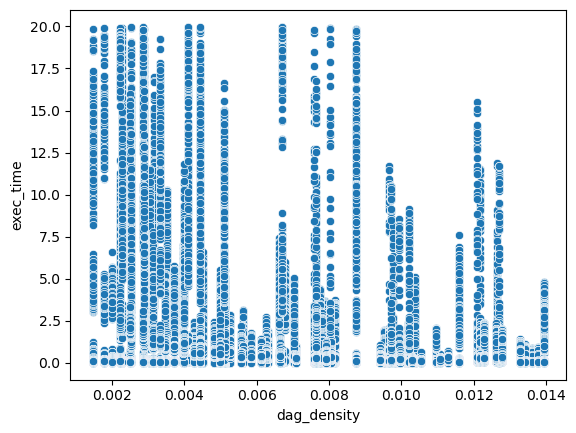

In [111]:
sns.scatterplot(df[(df.exec_time < 20) & (df.dag_density < 0.014)], x="dag_density", y="exec_time")

<Axes: xlabel='SLR', ylabel='dag_density'>

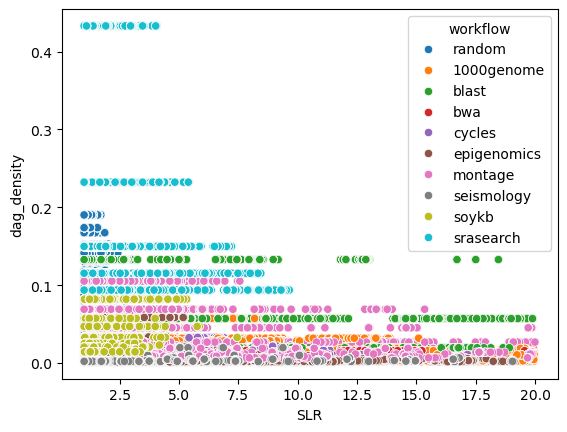

In [112]:
sns.scatterplot(df[df.SLR < 20], y="dag_density", x="SLR", hue="workflow")

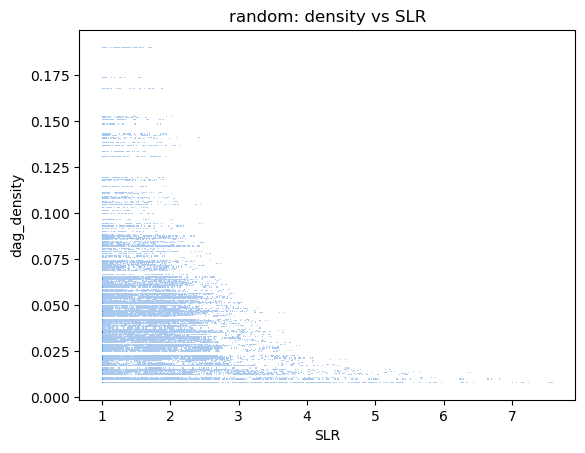

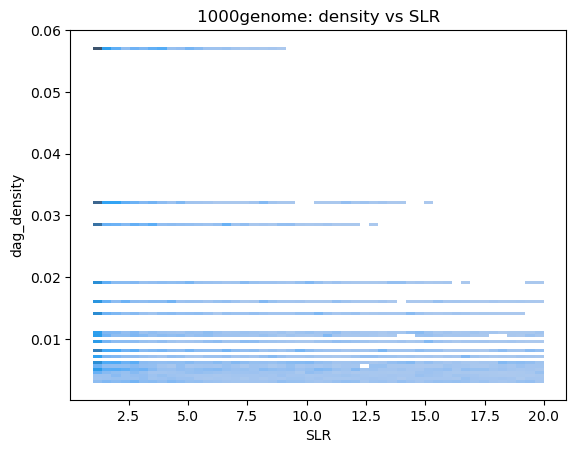

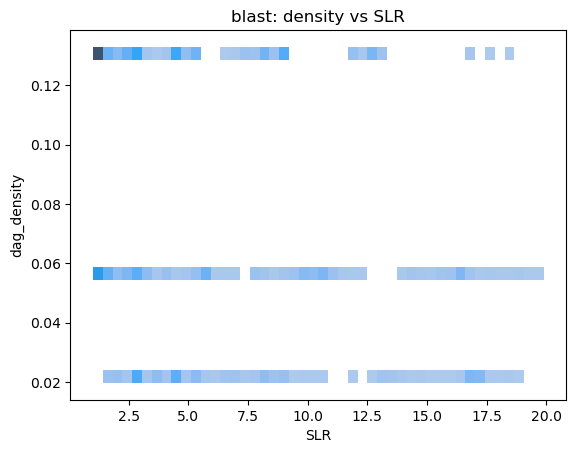

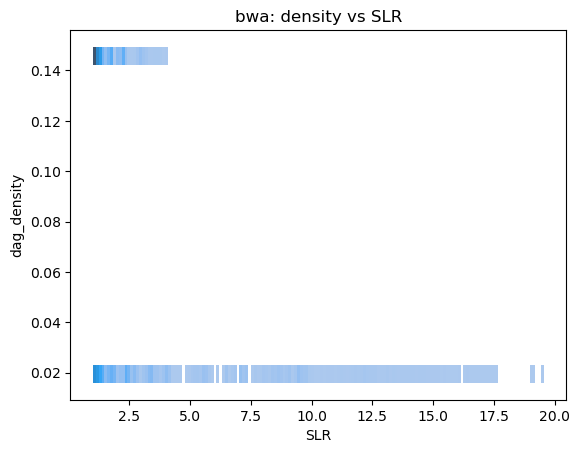

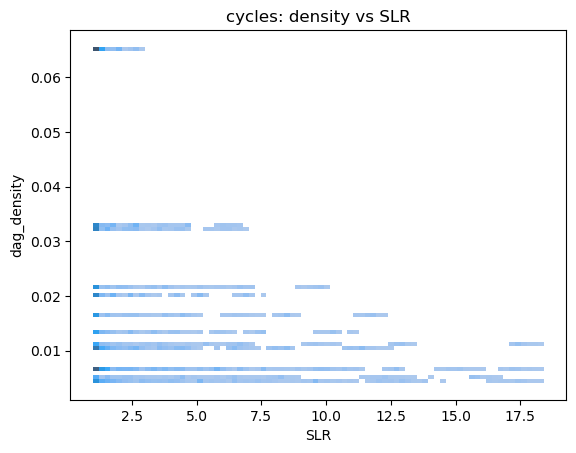

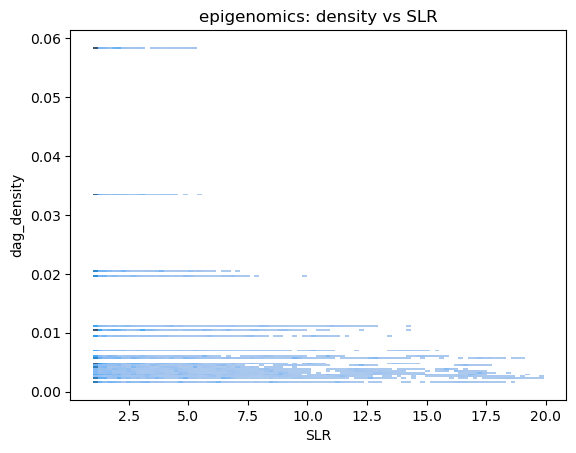

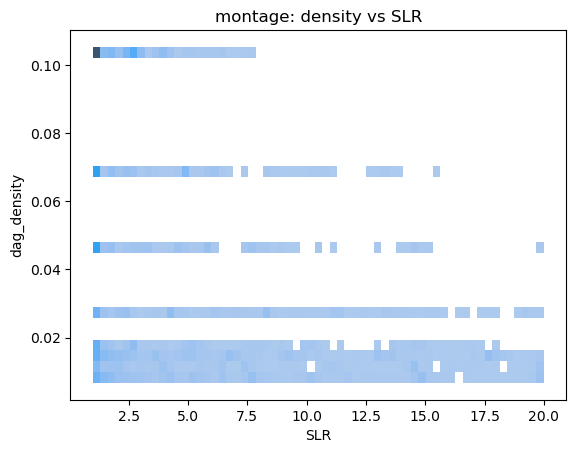

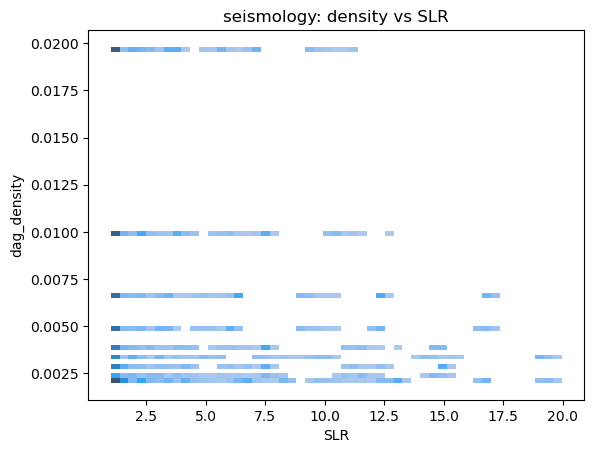

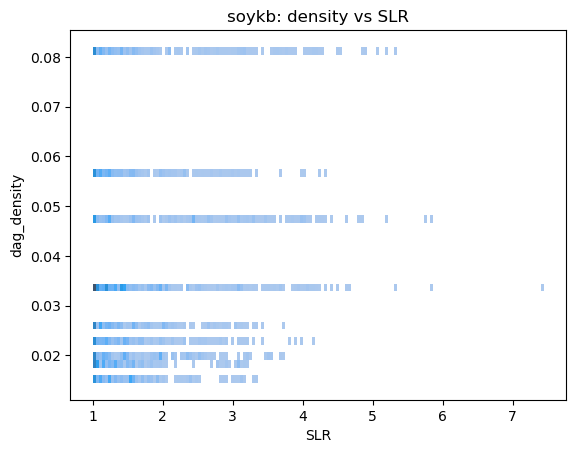

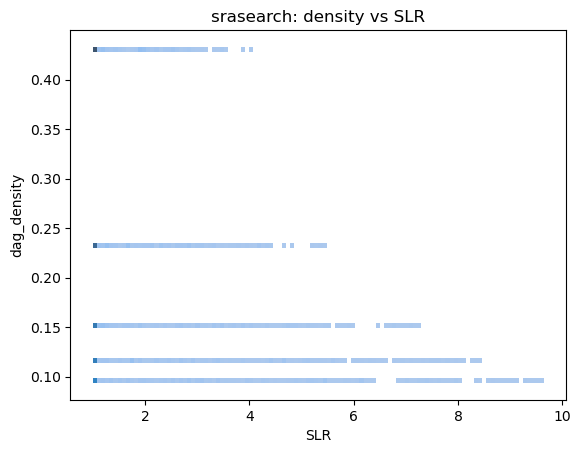

In [113]:
for workflow in df.workflow.unique():

    
    sns.histplot(df[(df.SLR < 20) & (df.workflow == workflow)], 
                    y="dag_density", x="SLR").set(title=workflow + ": density vs SLR")
    plt.show()

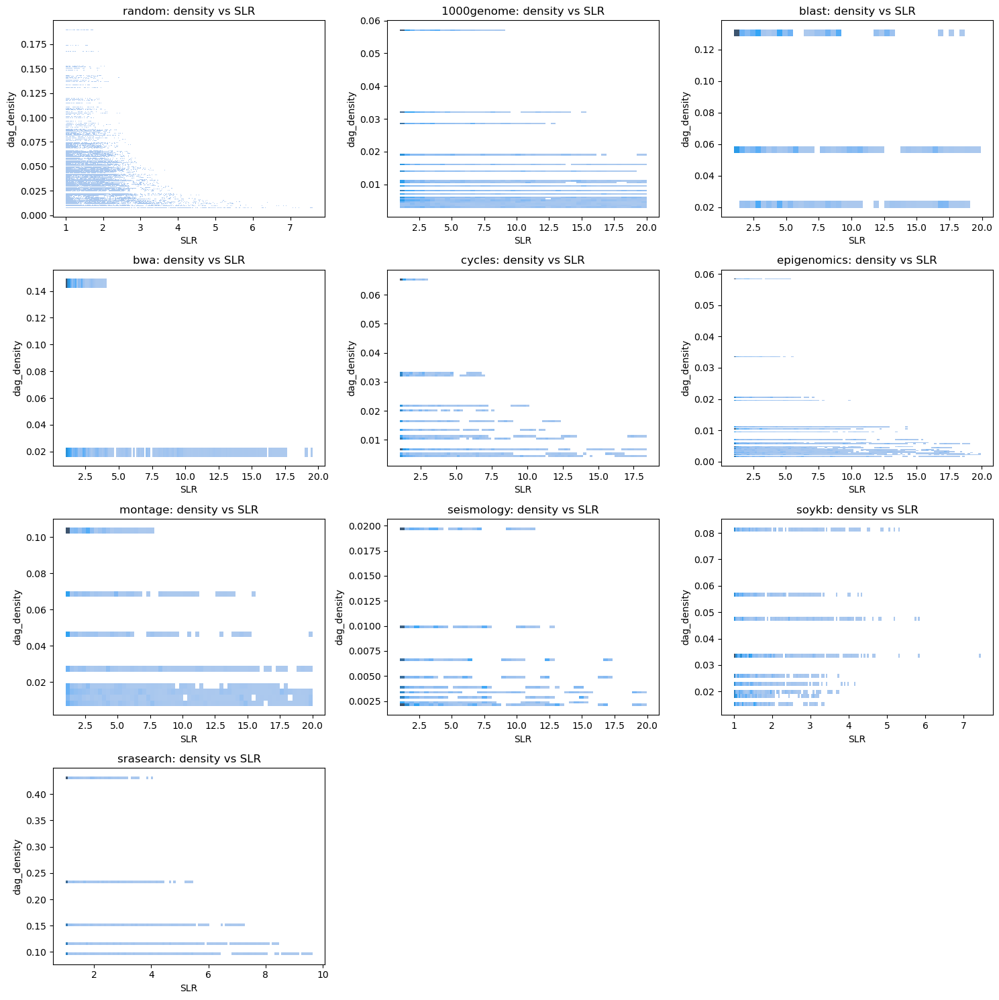

In [114]:
# Get the unique workflows
workflows = df.workflow.unique()

# Create a 3x3 grid for the plots
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15, 15))
axes = axes.flatten()  # Flatten the grid to easily index subplots

# Loop through each workflow and plot on the corresponding axis
for i, workflow in enumerate(workflows):
    ax = axes[i]
    # Filter the DataFrame for the current workflow and condition SLR < 20
    subset = df[(df.SLR < 20) & (df.workflow == workflow)]
    
    # Create the histogram plot on the designated axis
    sns.histplot(subset, x="SLR", y="dag_density", ax=ax)
    
    # Set the title for the subplot
    ax.set_title(f"{workflow}: density vs SLR")

# Hide any unused subplots if there are less than 9 workflows
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.savefig("Workflow DAG densities vs SLR.png", dpi=300)
plt.show()


random


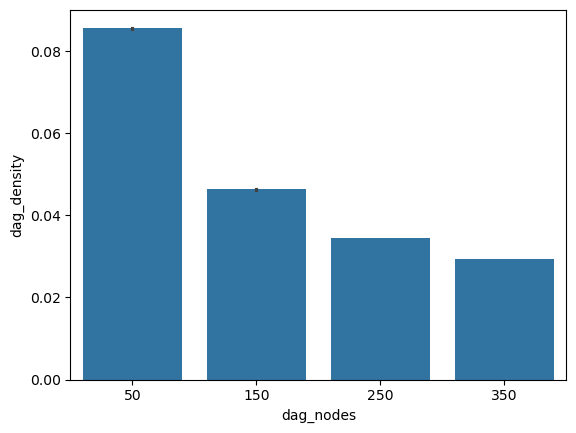

1000genome


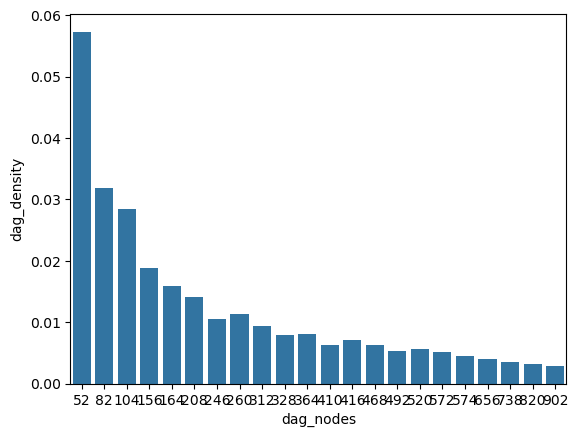

blast


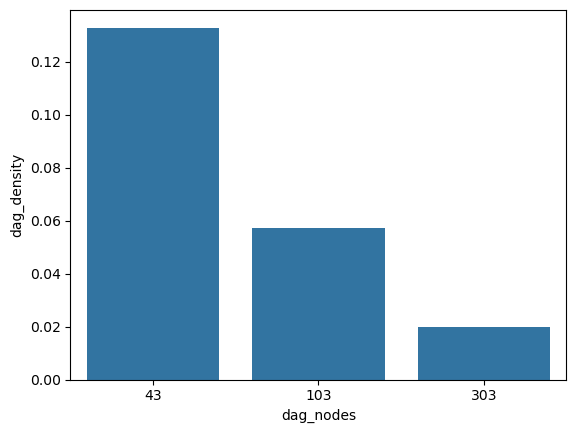

bwa


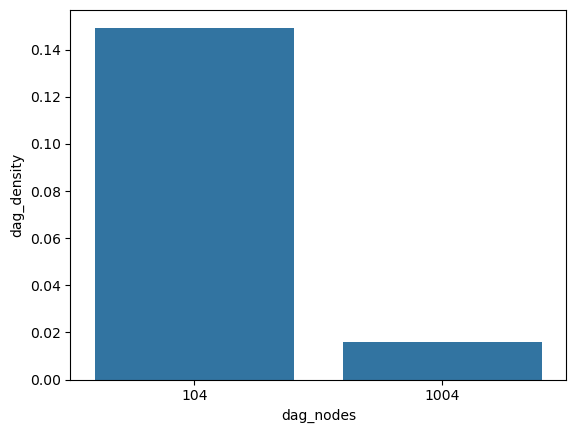

cycles


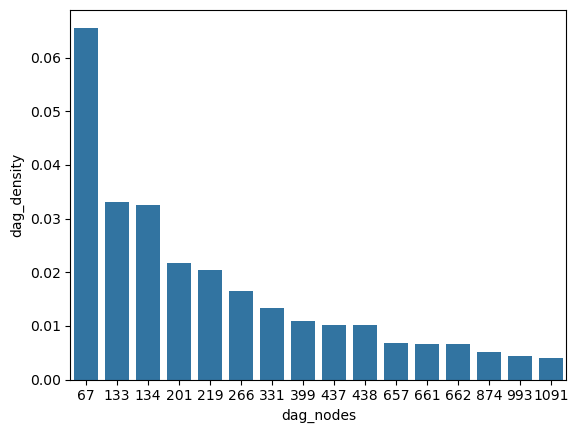

epigenomics


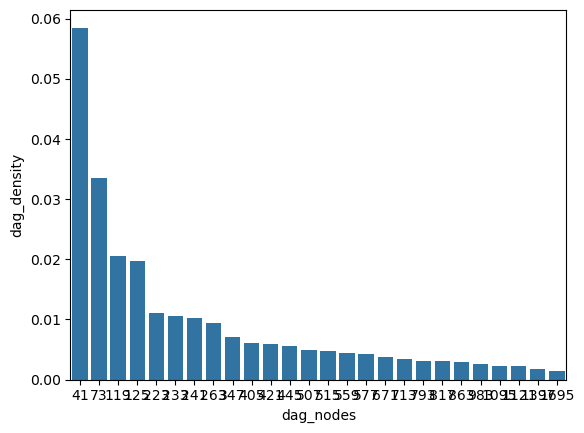

montage


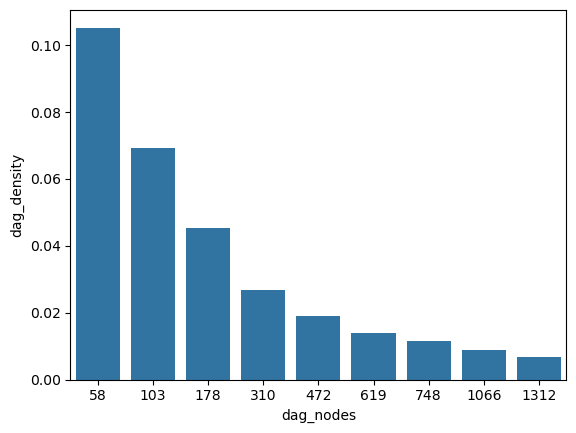

seismology


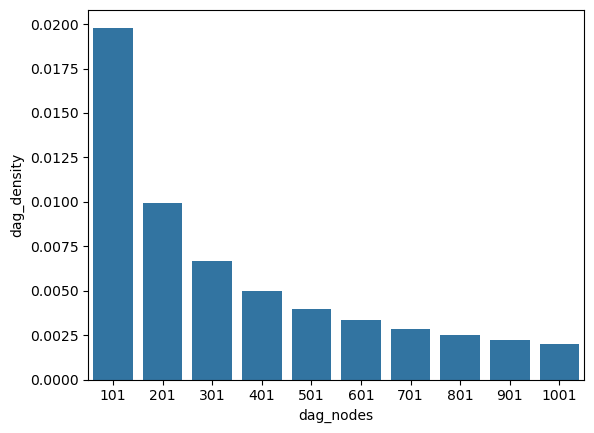

soykb


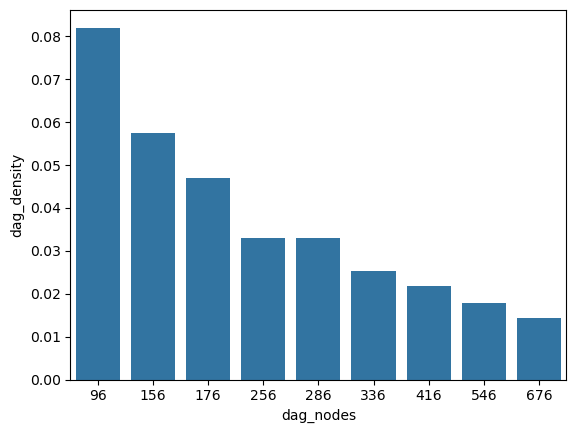

srasearch


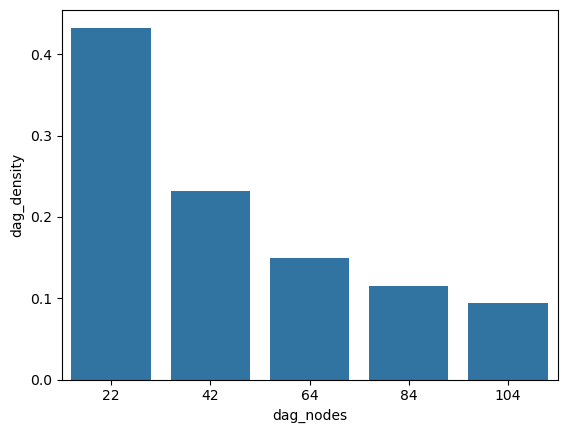

In [115]:
for workflow in df.workflow.unique():
    print(workflow)
    sns.barplot(df[df.workflow == workflow], x="dag_nodes", y="dag_density")
    plt.show()

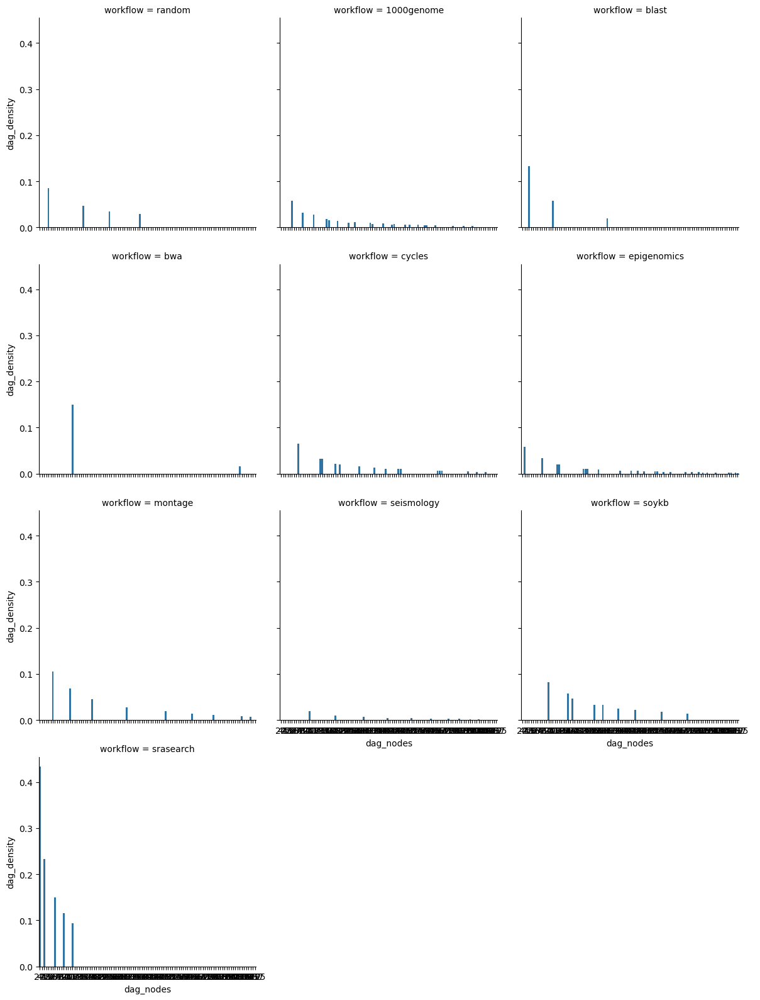

In [116]:
g = sns.catplot(
    data=df,
    kind="bar",
    x="dag_nodes",
    y="dag_density",
    col="workflow",
    col_wrap=3,
    height=4,
    aspect=1
)
plt.tight_layout()
plt.show()

In [122]:
# Create a grid of barplots with each subplot having its own x-axis scale.
# plt.figure(figsize=(15,15))

# g = sns.catplot(
#     data=df[df.SLR < 20],
#     kind="boxen",
#     x="SLR",
#     y="dag_density",
#     col="workflow",
#     col_wrap=3,          # Adjust this to control the number of plots per row
#     sharex=False,
#     height=4,            # Height of each subplot
#     aspect=1             # Aspect ratio of each subplot
# )
# g.set_xticklabels(rotation=75)
# # plt.tight_layout()
# title = "Workflow DAG: Density vs SLR"
# g.fig.suptitle(title, fontsize=16, y=1.05)
# # g.fig.subplots_adjust(top=2, bottom=1)
# plt.savefig(title+".png", dpi=300)
# plt.show()


<Figure size 1500x1500 with 0 Axes>

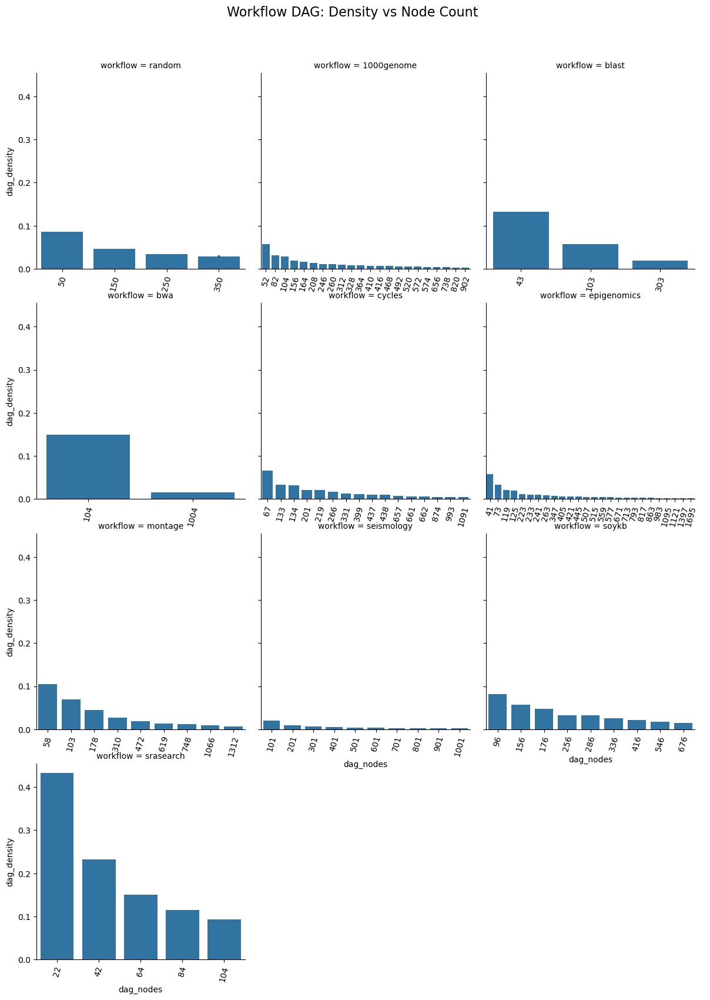

In [123]:
# Create a grid of barplots with each subplot having its own x-axis scale.
plt.figure(figsize=(15,15))

g = sns.catplot(
    data=df,
    kind="bar",
    x="dag_nodes",
    y="dag_density",
    col="workflow",
    col_wrap=3,          # Adjust this to control the number of plots per row
    sharex=False,
    height=4,            # Height of each subplot
    aspect=1             # Aspect ratio of each subplot
)
g.set_xticklabels(rotation=75)
# plt.tight_layout()
title = "Workflow DAG: Density vs Node Count"
g.fig.suptitle(title, fontsize=16, y=1.05)
# g.fig.subplots_adjust(top=2, bottom=1)
plt.savefig(title+".png", dpi=300)
plt.show()


# Plotting how dag density affects execution time by controlling for node count in DAGs

In [124]:
import seaborn.objects as so

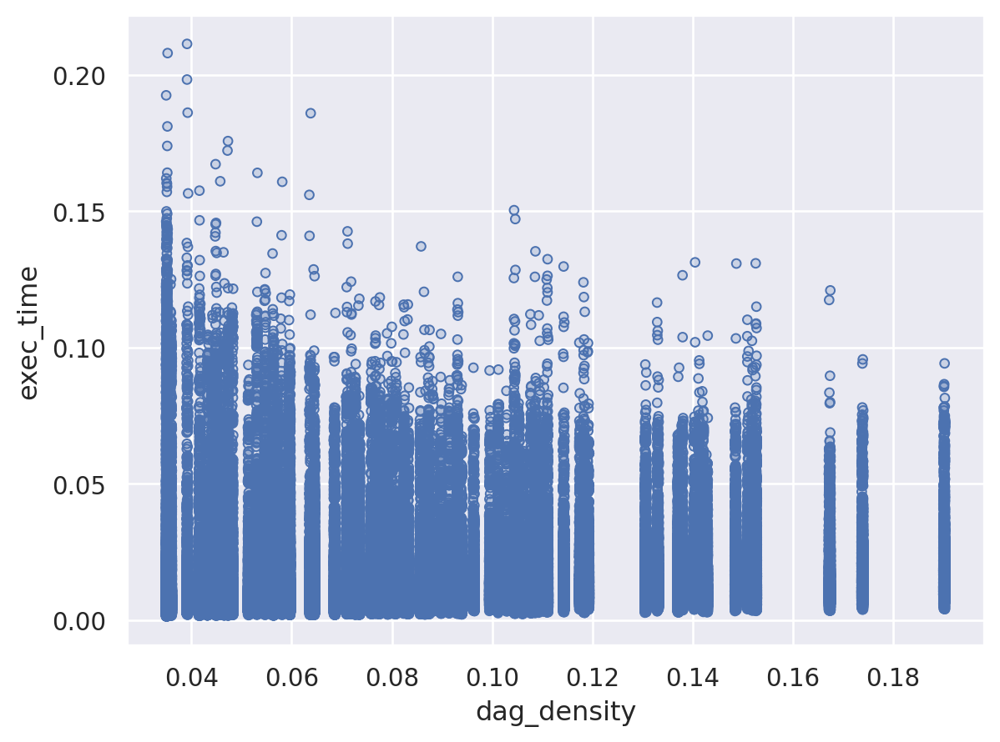

In [125]:
(
    so.Plot(df[df.dag_nodes == 50], "dag_density", "exec_time")
    .add(so.Dots(), so.Jitter(.5))
)

In [126]:
# df[(df.dag_nodes == node_count)][
#         ["scheduler", "exec_time", "dag_density"]
#         ].groupby(["scheduler", "dag_density"]).mean().reset_index()

NameError: name 'node_count' is not defined

<Figure size 1200x800 with 0 Axes>

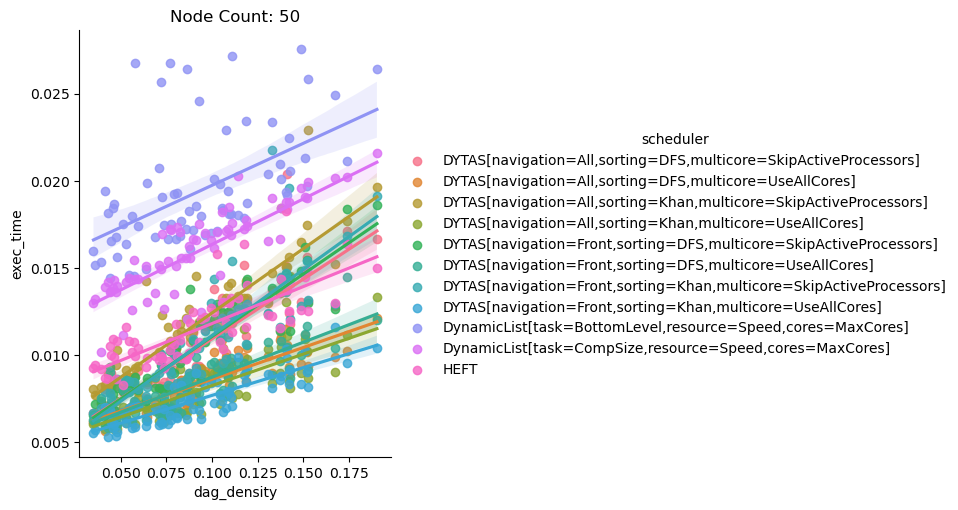

<Figure size 1200x800 with 0 Axes>

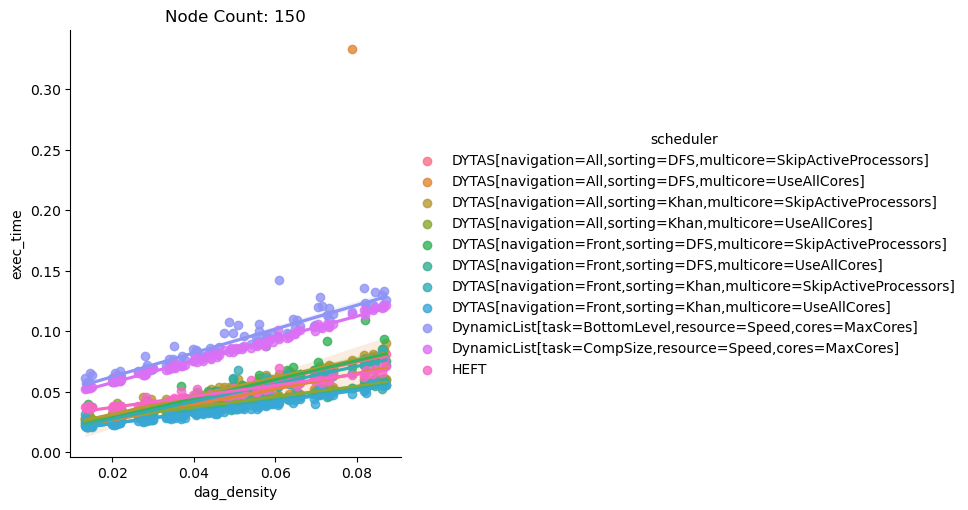

<Figure size 1200x800 with 0 Axes>

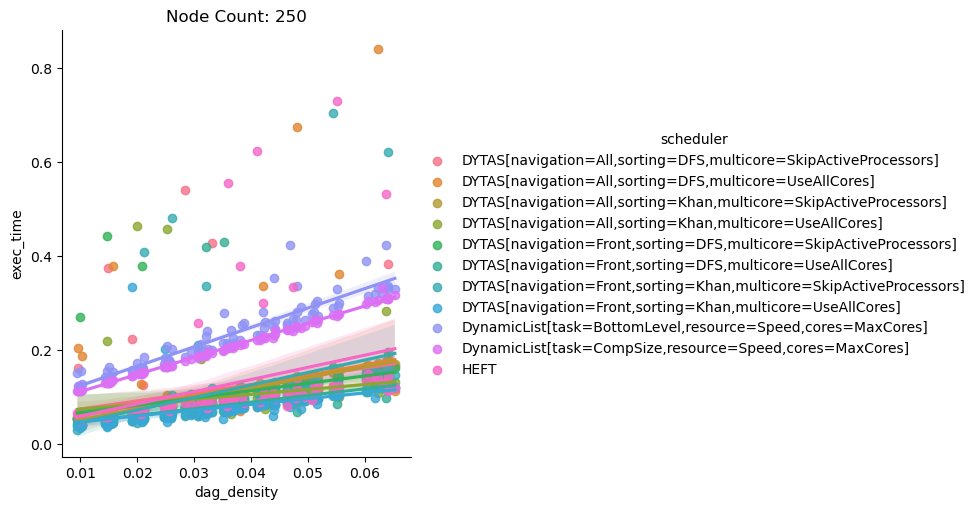

<Figure size 1200x800 with 0 Axes>

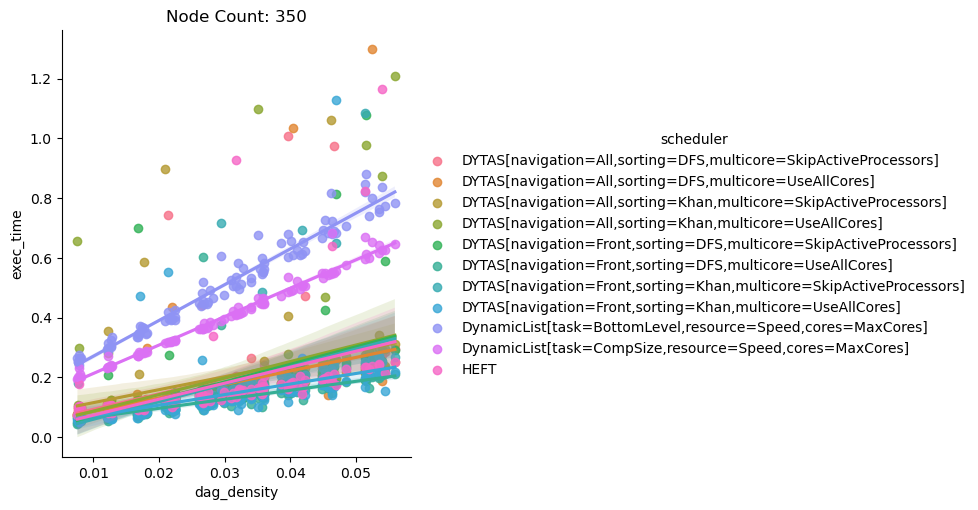

In [127]:
node_counts = [50, 150, 250, 350]

for node_count in node_counts:

    plt.figure(figsize=(12,8))
    sns.lmplot(
        df[(df.dag_nodes == node_count) & (df.scheduler != "DLS")][
        ["scheduler", "exec_time", "dag_density"]
        ].groupby(["scheduler", "dag_density"]).mean().reset_index(),
        x="dag_density", y="exec_time", hue="scheduler"
    ).set(title="Node Count: " + str(node_count))
    plt.show()

In [ ]:
# df["dag_density_bin"] = pd.cut(df["dag_density"], 7)


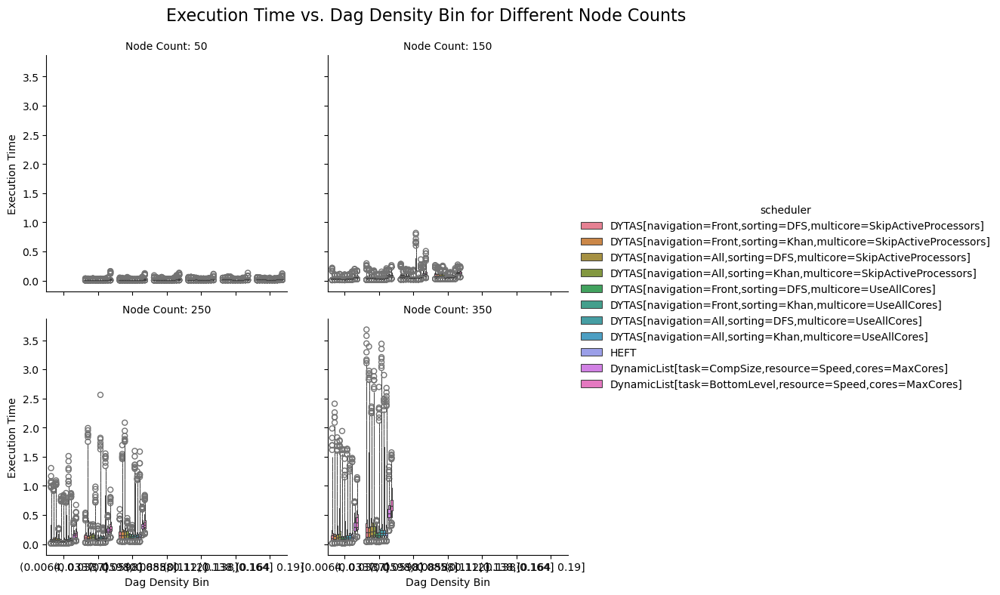

In [128]:

# Filter for the desired node_counts
node_counts = [50, 150, 250, 350]
data_subset = df[(df.scheduler != "DLS") & (df.dag_nodes.isin(node_counts))].copy()

# Create the bin for dag_density
data_subset["dag_density_bin"] = pd.cut(data_subset["dag_density"], 7, include_lowest=True)

# Use catplot with faceting by dag_nodes; here we wrap the facets into 2 columns.
g = sns.catplot(
    data=data_subset,
    x="dag_density_bin", y="exec_time", hue="scheduler",
    kind="boxen", col="dag_nodes", col_wrap=2,
    height=4, aspect=1.2
)

g.set_titles("Node Count: {col_name}")
g.set_axis_labels("Dag Density Bin", "Execution Time")
plt.subplots_adjust(top=0.9)
plt.suptitle("Execution Time vs. Dag Density Bin for Different Node Counts", fontsize=16)
plt.show()

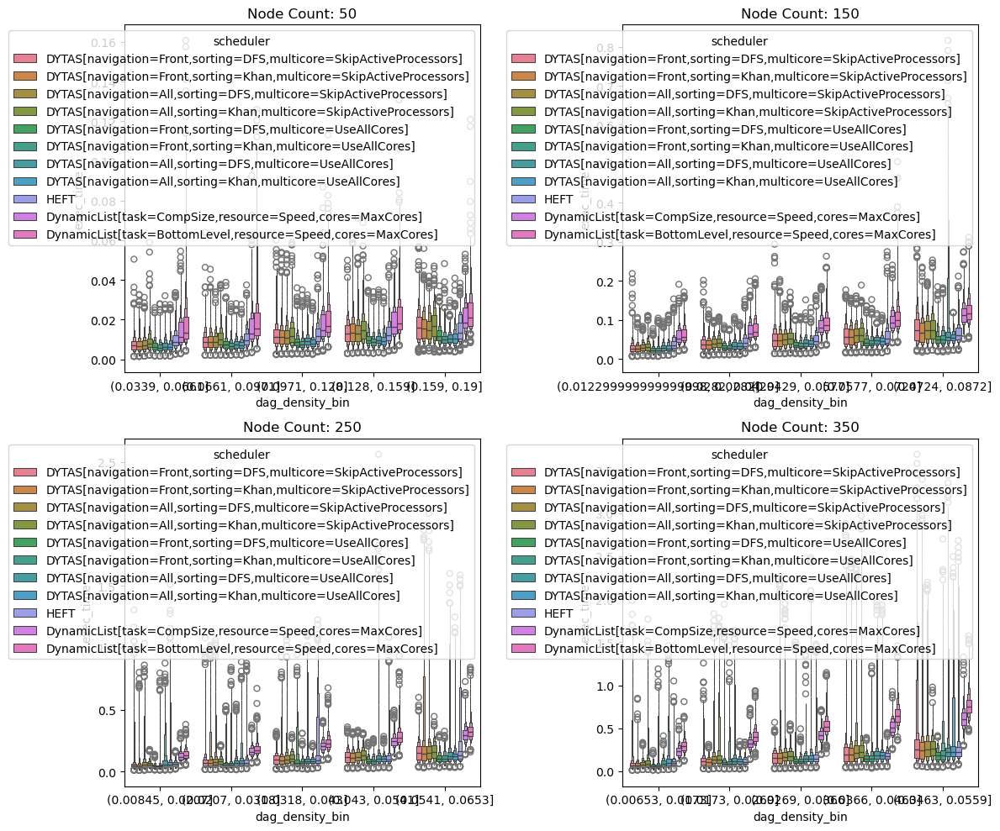

In [129]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

for ax, node_count in zip(axes.flatten(), node_counts):
    data = df[(df.dag_nodes == node_count) & (df.scheduler != "DLS")].copy()
    data["dag_density_bin"] = pd.cut(data["dag_density"], 5, include_lowest=True)
    sns.boxenplot(
        data=data,
        x="dag_density_bin", y="exec_time", hue="scheduler",
        dodge=True, ax=ax
    ).set(title="Node Count: " + str(node_count))
    
plt.tight_layout()
plt.show()


In [130]:
df.scheduler.unique()

array(['DYTAS[navigation=Front,sorting=DFS,multicore=SkipActiveProcessors]',
       'DYTAS[navigation=Front,sorting=Khan,multicore=SkipActiveProcessors]',
       'DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]',
       'DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]',
       'DYTAS[navigation=Front,sorting=DFS,multicore=UseAllCores]',
       'DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]',
       'DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]',
       'DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]', 'HEFT',
       'DLS', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]',
       'DynamicList[task=BottomLevel,resource=Speed,cores=MaxCores]'],
      dtype=object)

/tmp/ipykernel_17123/2284713213.py:17: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  data_subset = data_subset.groupby('dag_nodes', group_keys=False).apply(


<Figure size 1500x1000 with 0 Axes>

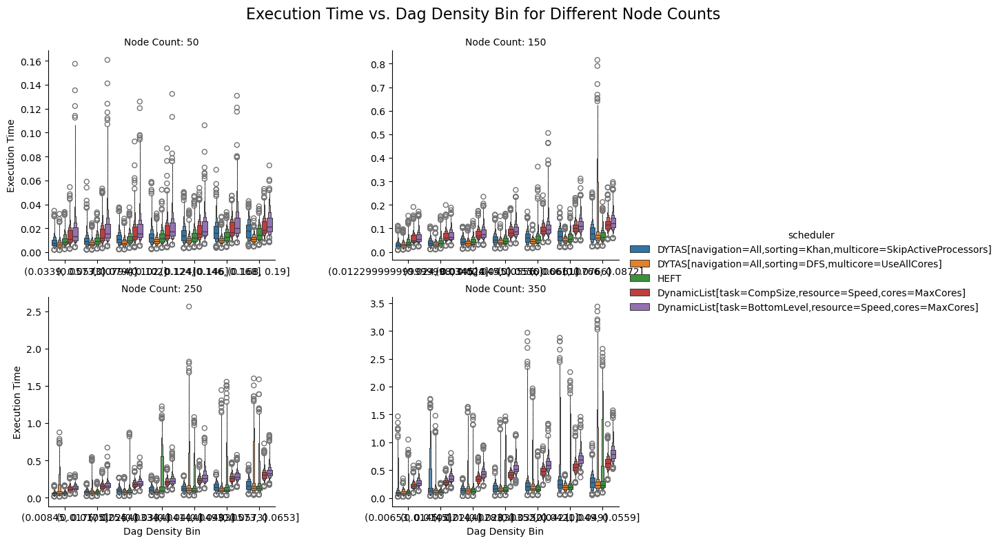

In [131]:
# Define node counts of interest
node_counts = [50, 150, 250, 350]
excluded_schedulers = [
    "DLS",
    "DYTAS[navigation=Front,sorting=DFS,multicore=SkipActiveProcessors]",
    "DYTAS[navigation=Front,sorting=Khan,multicore=SkipActiveProcessors]",
    "DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]",
    "DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]",
    "DYTAS[navigation=Front,sorting=DFS,multicore=UseAllCores]",
    "DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]",
    "DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]"
]
# Filter the DataFrame for the desired scheduler and node counts
data_subset = df[~(df.scheduler.isin(excluded_schedulers)) & (df.dag_nodes.isin(node_counts))].copy()

# Compute 'dag_density_bin' separately per node count:
data_subset = data_subset.groupby('dag_nodes', group_keys=False).apply(
    lambda g: g.assign(dag_density_bin=pd.cut(g['dag_density'], 7, include_lowest=True))
)
plt.figure(figsize=(15,10))
# Create a faceted plot where each facet has its own x-axis categories:
g = sns.catplot(
    data=data_subset,
    x="dag_density_bin", y="exec_time", hue="scheduler",
    kind="boxen", col="dag_nodes", col_wrap=2,
    sharex=False,  # Each subplot gets its own x-axis (i.e. its own binning)
    sharey=False,
    height=4, aspect=1.2
)

g.set_titles("Node Count: {col_name}")
g.set_axis_labels("Dag Density Bin", "Execution Time")
plt.subplots_adjust(top=0.9)
plt.suptitle("Execution Time vs. Dag Density Bin for Different Node Counts", fontsize=16)
plt.show()


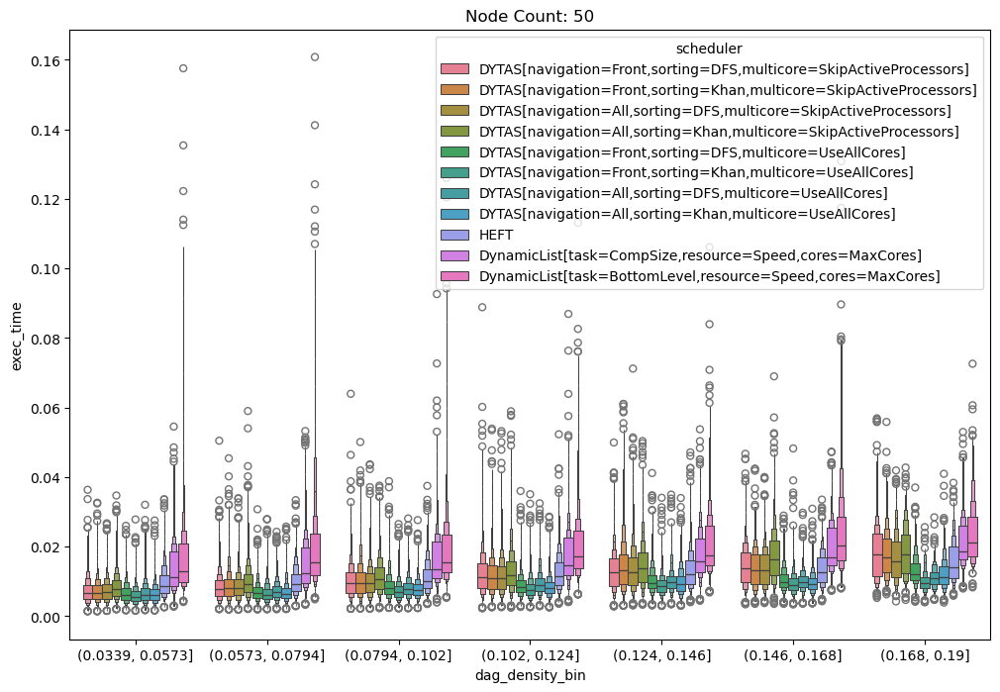

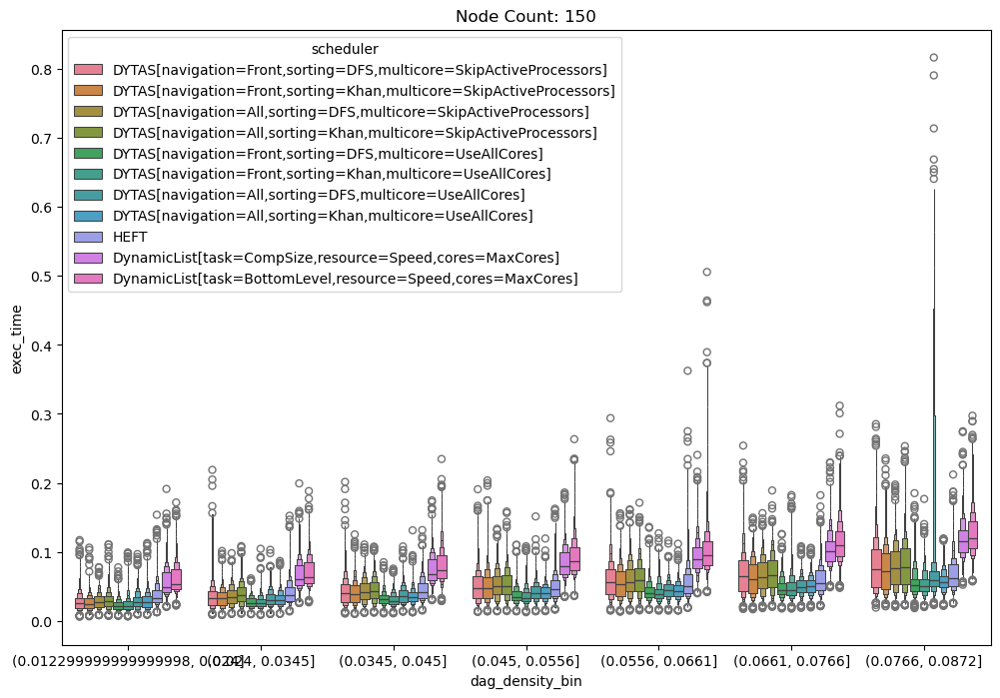

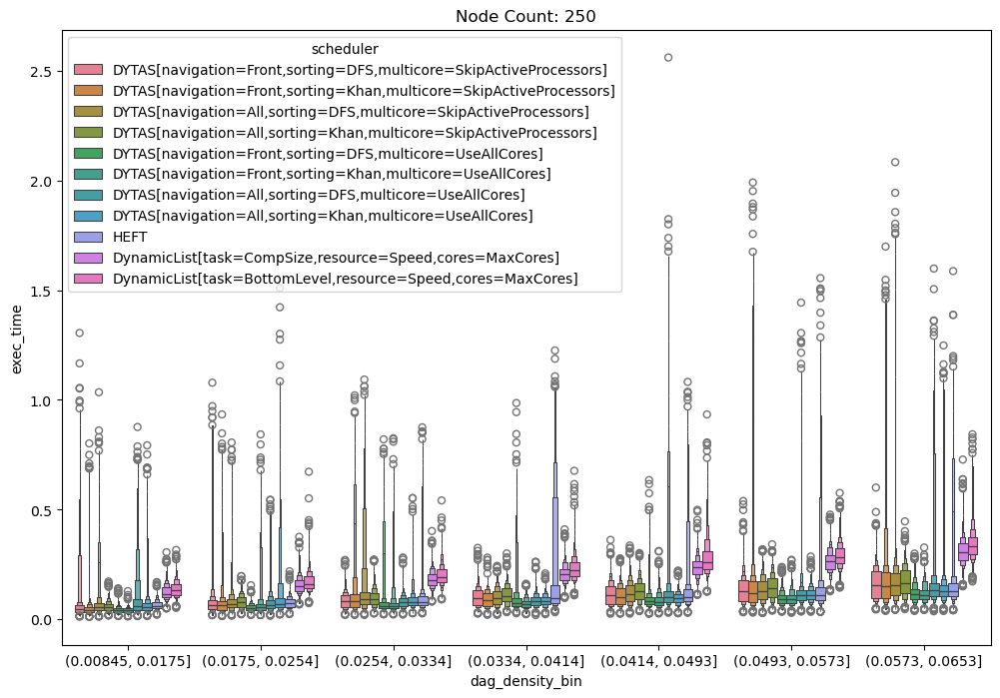

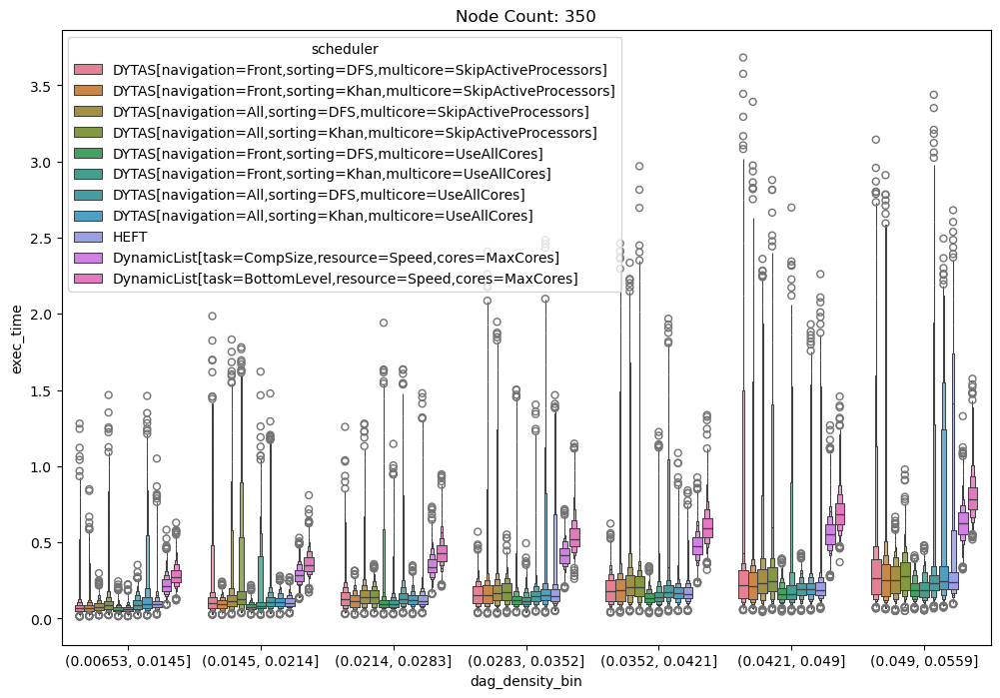

In [132]:
node_counts = [50, 150, 250, 350]

for node_count in node_counts:
    plt.figure(figsize=(12,8))

    data = df[(df.dag_nodes == node_count) & (df.scheduler != "DLS")].copy()
    data["dag_density_bin"] = pd.cut(data["dag_density"], 7,
                                     include_lowest=True)
    
    sns.boxenplot(
        data,
        x="dag_density_bin", y="exec_time", hue="scheduler",
        dodge=True
    ).set(title="Node Count: " + str(node_count))
    
    plt.show()



In [133]:
# node_counts = [50, 150, 250, 350]

# for node_count in node_counts:
#     for scheduler in df.scheduler.unique():
#         plt.figure(figsize=(12,8))
#         sns.stripplot(
#             df[(df.dag_nodes == node_count) & (df.scheduler == scheduler)],
#             x="dag_density", y="exec_time"
#         ).set(title="Node Count: " + str(node_count) + " Scheduler: " + scheduler)
#         plt.show()

# Now the same but with SLR

<Figure size 1200x800 with 0 Axes>

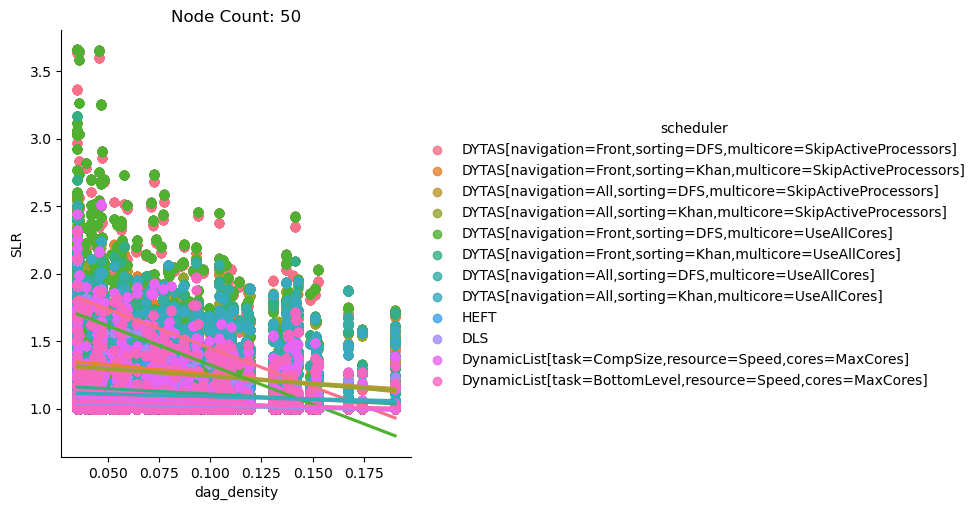

<Figure size 1200x800 with 0 Axes>

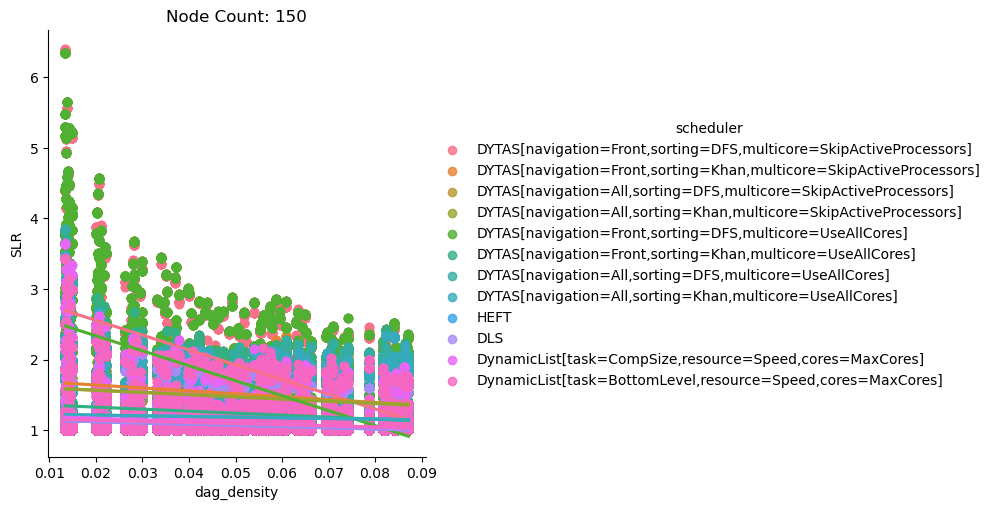

<Figure size 1200x800 with 0 Axes>

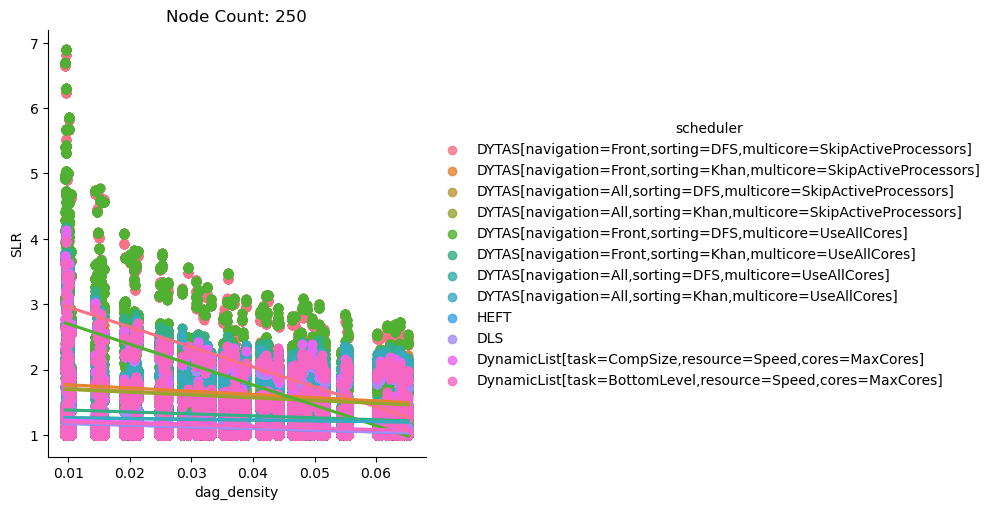

<Figure size 1200x800 with 0 Axes>

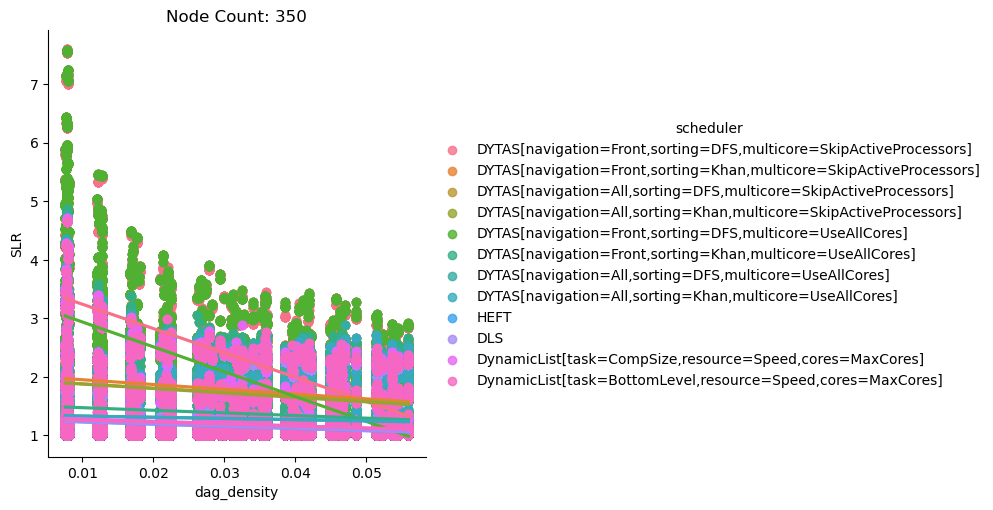

In [134]:
node_counts = [50, 150, 250, 350]
for node_count in node_counts:
    plt.figure(figsize=(12,8))
    sns.lmplot(
        df[(df.dag_nodes == node_count)],
        x="dag_density", y="SLR", hue="scheduler",
    ).set(title="Node Count: " + str(node_count))
    plt.show()

In [135]:
# Now plotting, for each class of node count, the
# dag density w.r.t. the execution time

# TO DO: Check single core performance per algorithm, specially DYTAS

In [136]:
df_single_core = df[df.processor_count == df.core_count].reset_index(drop=True).copy()

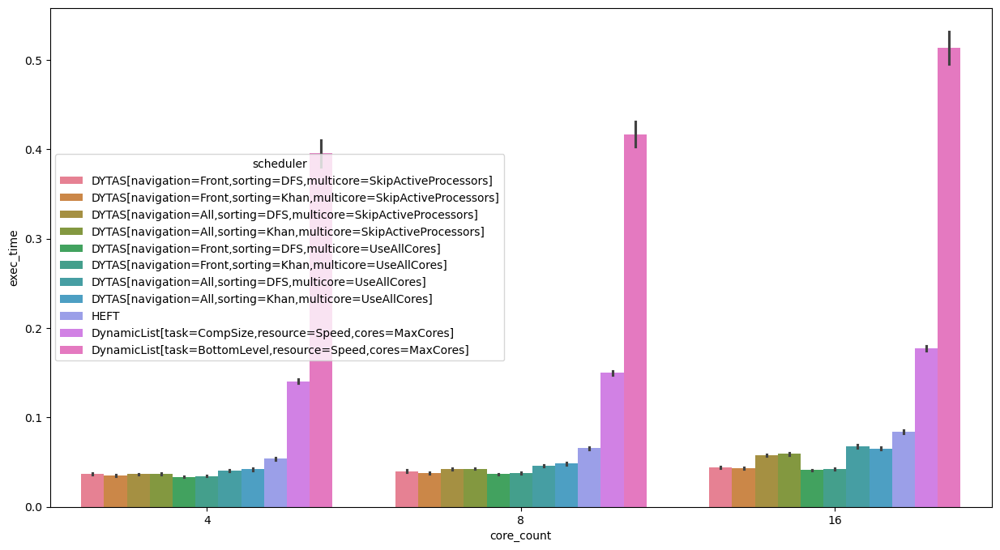

In [137]:
# Ignoring DLS
plt.figure(figsize=(15,8))

sns.barplot(data=df_single_core[df_single_core.scheduler != "DLS"], x="core_count", y="exec_time", hue="scheduler")

plt.show()

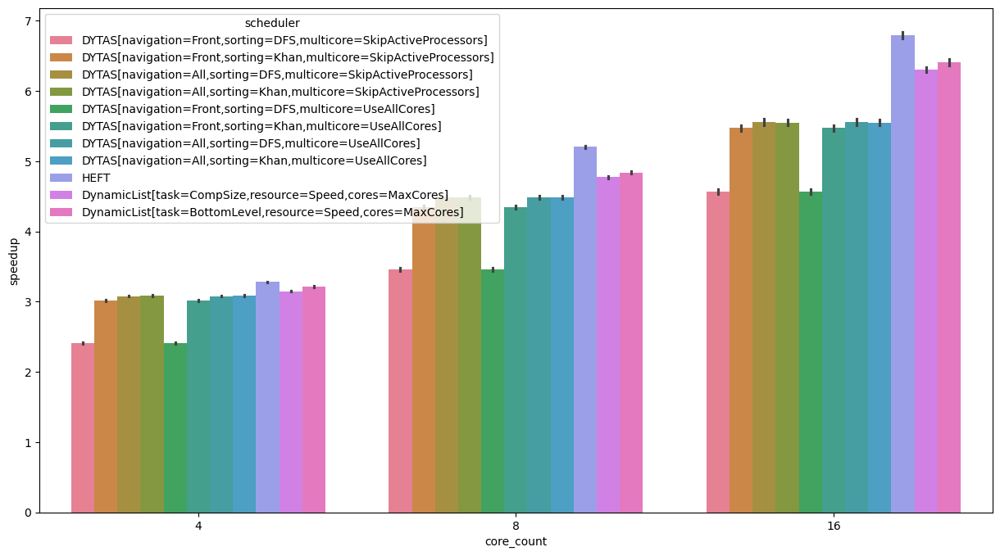

In [138]:
plt.figure(figsize=(15,8))

sns.barplot(data=df_single_core[df_single_core.scheduler != "DLS"], x="core_count", y="speedup", hue="scheduler")

plt.show()

random


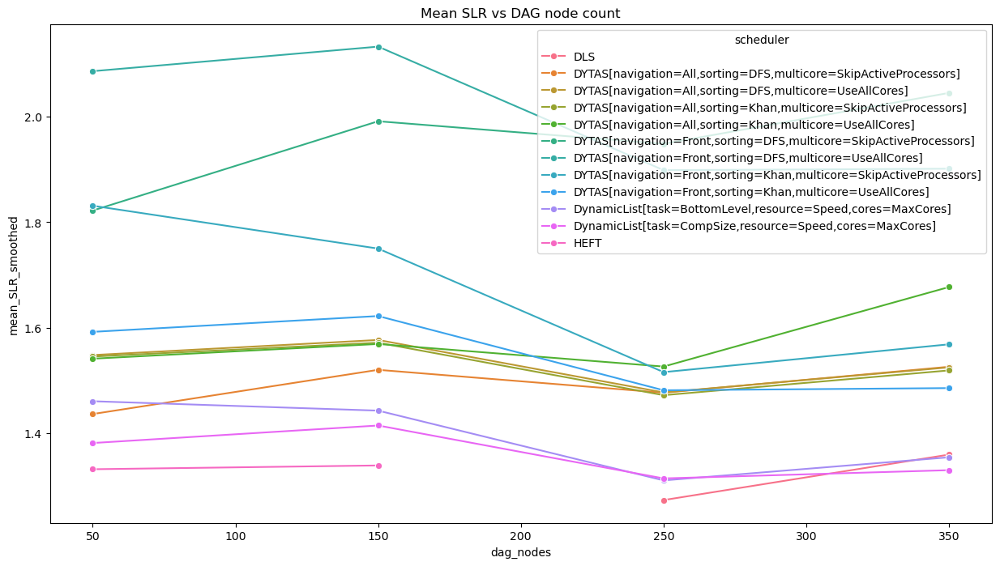

1000genome


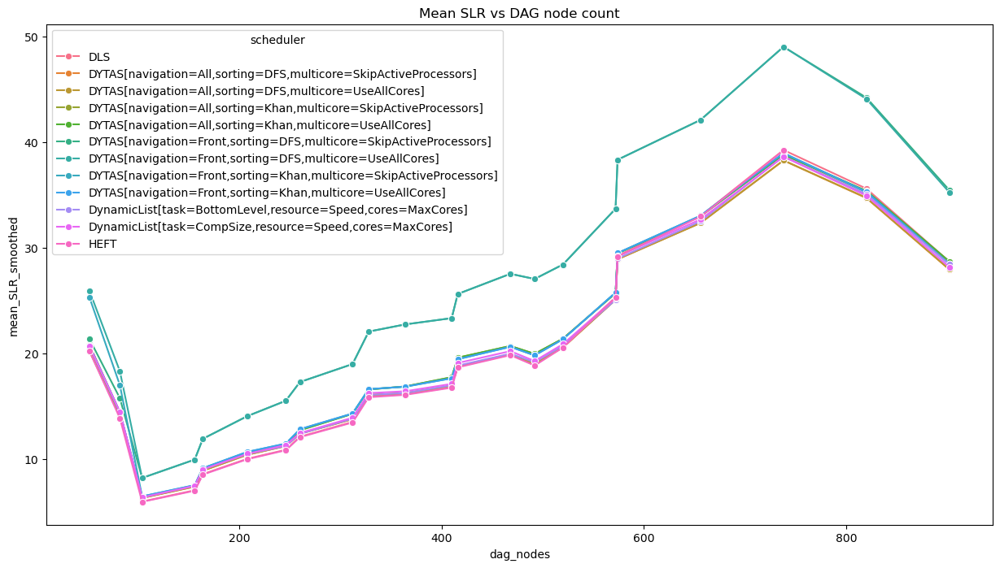

blast


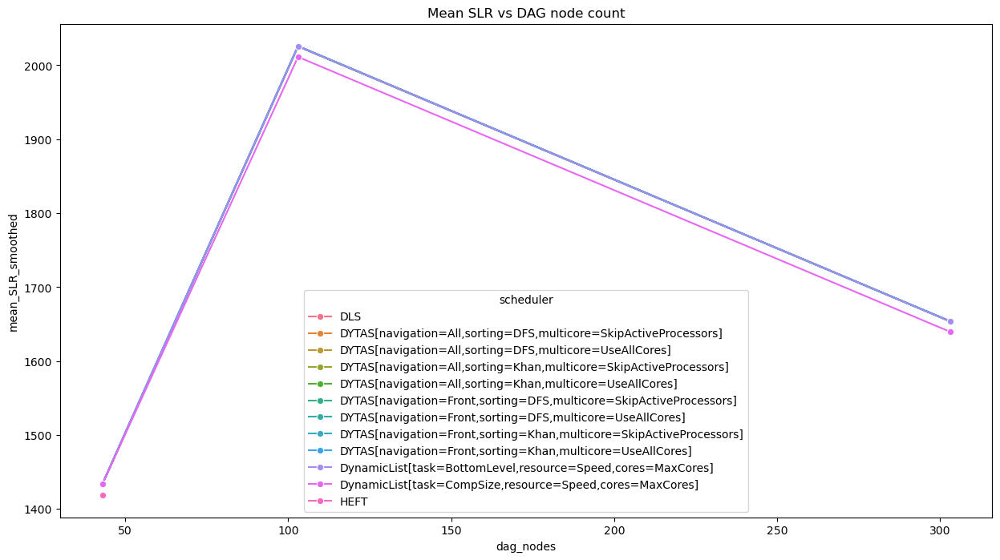

bwa


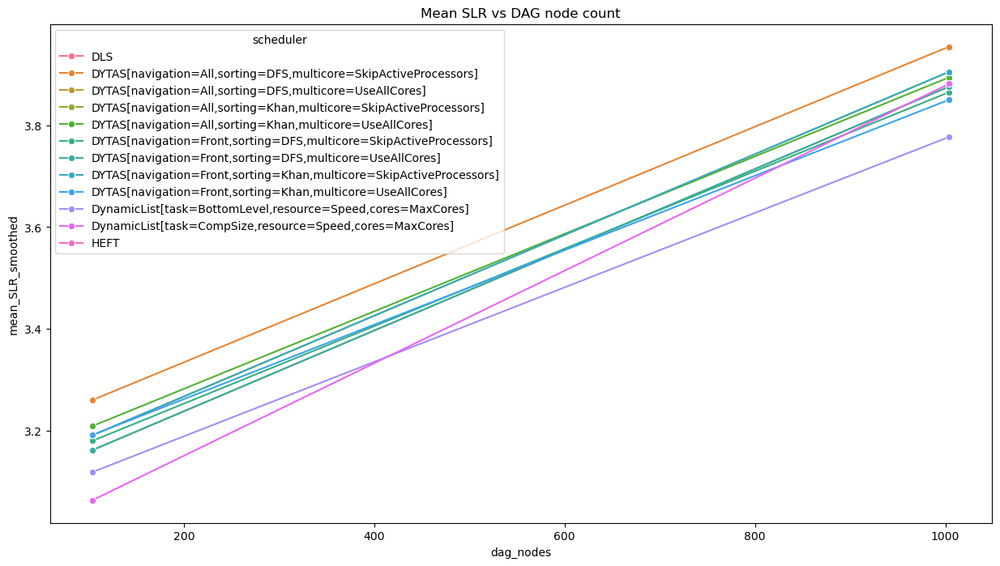

cycles


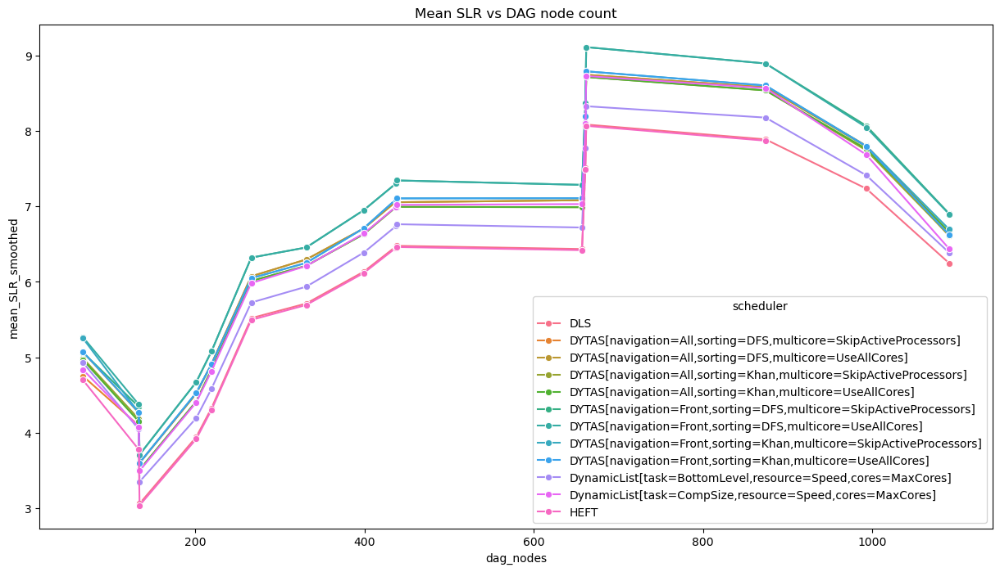

epigenomics


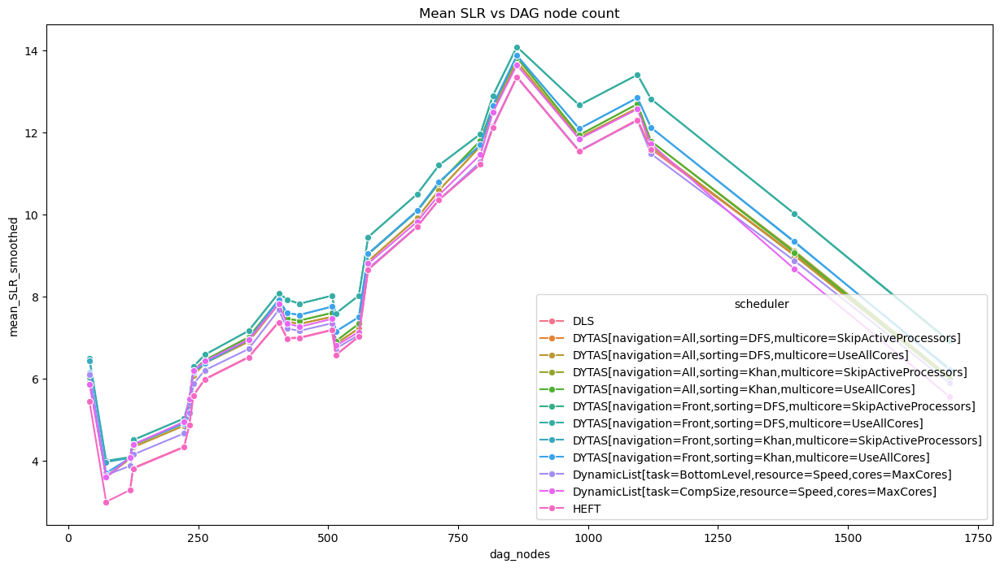

montage


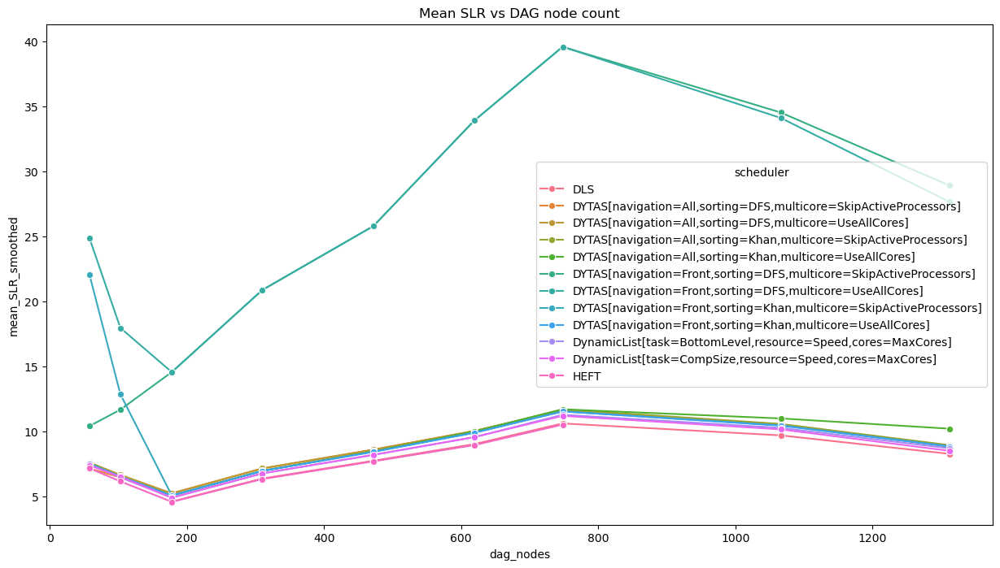

seismology


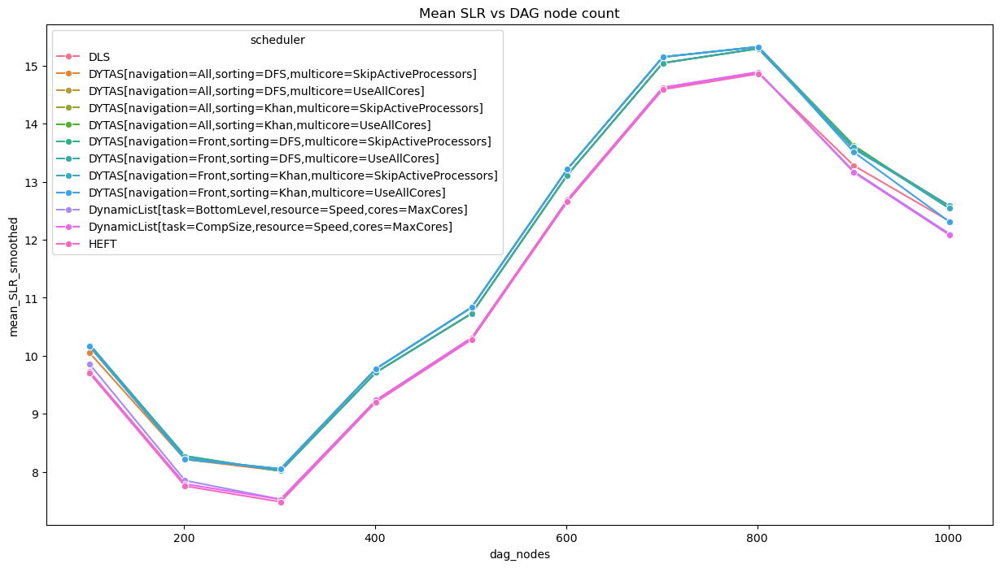

soykb


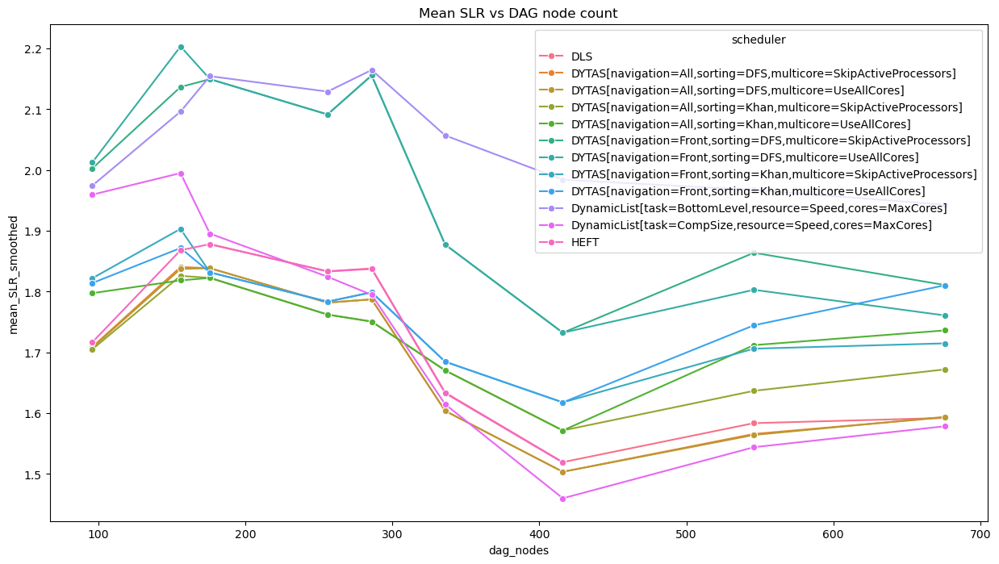

srasearch


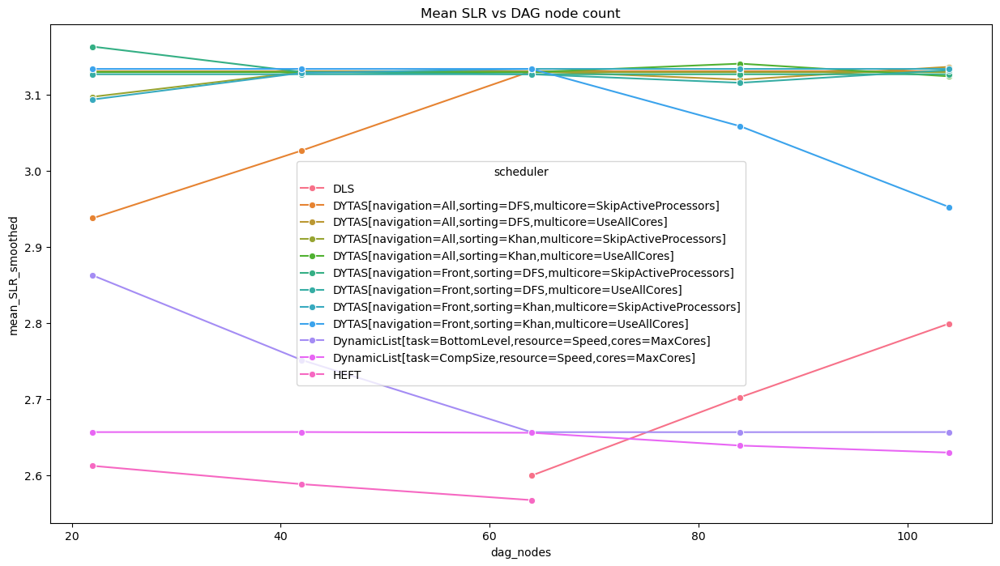

In [139]:
for workflow in df.workflow.unique():
    print(workflow)
    plot_mean_slr(df_single_core[df_single_core.workflow == workflow])

HEFT and DLS seem to have missing data, somehow...

In [140]:
heft_single_core_df = df_single_core[(df_single_core.workflow == "random") & (df_single_core.scheduler == "HEFT")]

<Axes: xlabel='dag_density', ylabel='exec_time'>

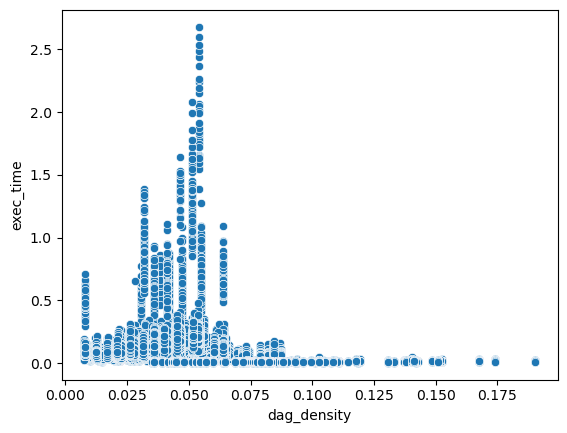

In [141]:
sns.scatterplot(heft_single_core_df, x="dag_density", y="exec_time")

In [142]:
df.test_id.nunique()

177552

In [143]:
len(df) / df.scheduler.nunique()

177552.0